## Importación de librerías

In [1]:
# Librerías estándar
import os
import warnings

# Manipulación de datos
import pandas as pd
import numpy as np

# Configuración de warnings
warnings.filterwarnings('ignore')

# Análisis de nulos
import missingno as msno

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Textos
import unicodedata
#!pip install fuzzywuzzy
#from fuzzywuzzy import process
import re

In [2]:
!pip install fuzzywuzzy

In [3]:
from fuzzywuzzy import process

In [4]:
import sys

sys.path.append(r"C:/Users/helenacaro/Documents/GitHub/Digital-campaigns-Fintech/notebooks/drafts_teams")

import Sesion3_funciones_resuelta as fun

## Carga de datos



In [5]:
path = '/Users/helenacaro/Desktop/Fintech/data/'

# 2. Lista todos los archivos del directorio
lista = os.listdir(path)

# 3. Filtra solo los archivos .csv (opcional)
csv_files = [file for file in lista if (file.endswith('.csv') | file.endswith('.xlsx'))]

csv_files = sorted(csv_files)
csv_files

['bank-additional_bank-additional-full.xlsx']

In [6]:
diccionario_datos = {}

for file in csv_files:
  ruta = os.path.join(path, file)

  if file.endswith('.xlsx'):
    df = pd.read_excel(ruta)
  elif file.endswith('.csv'):
    df = pd.read_csv(ruta, sep = ';')  # o read_excel(), etc.

  key = file.split('.')[0]
  #key = file.split('t_')[1].split('.')[0]
  diccionario_datos[key] = df
  print(f"{key}: {df.shape}")  # ejemplo: mostrar nombre y dimensiones

bank-additional_bank-additional-full: (41188, 21)


## Exploración inicial de los datos



## Analizar columnas

In [7]:
#dict_analizar_columnas = {}

#for k, v in diccionario_datos.items():
  #print(k.upper())
  #print('#' * 90)
  #df_aux = analizar_columnas(v)
  #df_aux['Fuente'] = k

  #df_aux.reset_index(inplace = True)
  #df_aux.rename(columns={'index': 'Columna'}, inplace = True)

  #order_columns = ['Fuente', 'Columna', 'Tipo', 'Num_nulos', 'Pct_nulos', 'Valores']
  #df_aux = df_aux[order_columns]

  #dict_analizar_columnas[k] = df_aux
  #print('#' * 90)
  # crear una variable 'Fuente' cuyo valor sea la k y almancenar el dataframe resultante en dict_analizar_columnas

In [8]:
#v.head()

In [9]:
df = fun.leer_archivo(ruta)

# Exploración inicial de datos

¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 41,188 filas y 21 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,"emp,var,rate","cons,price,idx","cons,conf,idx",euribor3m,"nr,employed",y
0,56,housemaid,married,"basic,4y",no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
1,57,services,married,"high,school",unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
2,37,services,married,"high,school",no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
3,40,"admin,",married,"basic,6y",no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
4,56,services,married,"high,school",no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no


----------------------------------------------------------------------------------------------------
¿Cuáles son las últimas cinco filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,"emp,var,rate","cons,price,idx","cons,conf,idx",euribor3m,"nr,employed",y
41183,73,retired,married,"professional,course",no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,yes
41184,46,blue-collar,married,"professional,course",no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,no
41185,56,retired,married,"university,degree",no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,no
41186,44,technician,married,"professional,course",no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94767.0,-50.8,1028.0,4963.6,yes
41187,74,retired,married,"professional,course",no,yes,no,cellular,nov,fri,...,3,999,1,failure,-1.1,94767.0,-50.8,1028.0,4963.6,no


----------------------------------------------------------------------------------------------------
¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,"emp,var,rate","cons,price,idx","cons,conf,idx",euribor3m,"nr,employed",y
1421,50,blue-collar,single,"basic,9y",unknown,yes,yes,telephone,may,thu,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4855.0,5191.0,no
11033,38,blue-collar,married,"basic,4y",no,yes,no,telephone,jun,wed,...,41,999,0,nonexistent,1.4,94465.0,-41.8,4962.0,5228.1,no
11265,38,"admin,",married,"university,degree",no,no,no,telephone,jun,thu,...,1,999,0,nonexistent,1.4,94465.0,-41.8,4961.0,5228.1,no
28515,45,"admin,",single,"basic,9y",no,yes,yes,cellular,apr,tue,...,2,999,1,failure,-1.8,93075.0,-47.1,1423.0,5099.1,no
2705,28,blue-collar,married,"basic,9y",no,yes,no,telephone,may,wed,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4859.0,5191.0,no


----------------------------------------------------------------------------------------------------
¿Cuáles son las columnas del conjunto de datos?
	- age
	- job
	- marital
	- education
	- default
	- housing
	- loan
	- contact
	- month
	- day_of_week
	- duration
	- campaign
	- pdays
	- previous
	- poutcome
	- emp,var,rate
	- cons,price,idx
	- cons,conf,idx
	- euribor3m
	- nr,employed
	- y
----------------------------------------------------------------------------------------------------
¿Cuál es el tipo de datos de cada columna?
age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp,var,rate      float64
cons,price,idx    float64
cons,conf,idx     flo

,0
age,"[56, 57, 37, 40, 45, 59, 41, 24, 25, 29, 35, 5..."
job,"[housemaid, services, admin,, blue-collar, tec..."
marital,"[married, single, divorced, unknown]"
education,"[basic,4y, high,school, basic,6y, basic,9y, pr..."
default,"[no, unknown, yes]"
housing,"[no, yes, unknown]"
loan,"[no, yes, unknown]"
contact,"[telephone, cellular]"
month,"[may, jun, jul, aug, oct, nov, dec, mar, apr, ..."
day_of_week,"[mon, tue, wed, thu, fri]"


----------------------------------------------------------------------------------------------------
¿Cuáles son las estadísticas descriptivas básicas de todas las columnas?


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,"emp,var,rate","cons,price,idx","cons,conf,idx",euribor3m,"nr,employed",y
count,41188.0,41188,41188,41188,41188,41188,41188,41188,41188,41188,...,41188.0,41188.0,41188.0,41188,41188.0,41188.0,41188.0,41188.0,41188.0,41188
unique,,12,4,8,3,3,3,2,10,5,...,,,,3,,,,,,2
top,,"admin,",married,"university,degree",no,yes,no,cellular,may,thu,...,,,,nonexistent,,,,,,no
freq,,10422,24928,12168,32588,21576,33950,26144,13769,8623,...,,,,35563,,,,,,36548
mean,40.02406,,,,,,,,,,...,2.567593,962.475454,0.172963,,0.081886,85401.579955,-40.5026,3180.107207,5167.035911,
std,10.42125,,,,,,,,,,...,2.770014,186.910907,0.494901,,1.57096,26471.506796,4.628198,2086.690436,72.251528,
min,17.0,,,,,,,,,,...,1.0,0.0,0.0,,-3.4,93.2,-50.8,0.634,4963.6,
25%,32.0,,,,,,,,,,...,1.0,999.0,0.0,,-1.8,92893.0,-42.7,1281.0,5099.1,
50%,38.0,,,,,,,,,,...,2.0,999.0,0.0,,1.1,93749.0,-41.8,4856.0,5191.0,
75%,47.0,,,,,,,,,,...,3.0,999.0,0.0,,1.4,93994.0,-36.4,4961.0,5228.1,


----------------------------------------------------------------------------------------------------
¿Cuántos valores nulos hay en cada columna del DataFrame?


age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp,var,rate      0
cons,price,idx    0
cons,conf,idx     0
euribor3m         0
nr,employed       0
y                 0
dtype: int64

----------------------------------------------------------------------------------------------------
¿Cuál es el porcentaje de valores nulos por columna, ordenado de mayor a menor?


,Col,pct
0,age,0.0
1,campaign,0.0
2,"nr,employed",0.0
3,euribor3m,0.0
4,"cons,conf,idx",0.0
5,"cons,price,idx",0.0
6,"emp,var,rate",0.0
7,poutcome,0.0
8,previous,0.0
9,pdays,0.0


----------------------------------------------------------------------------------------------------
## Valores nulos: Visualización


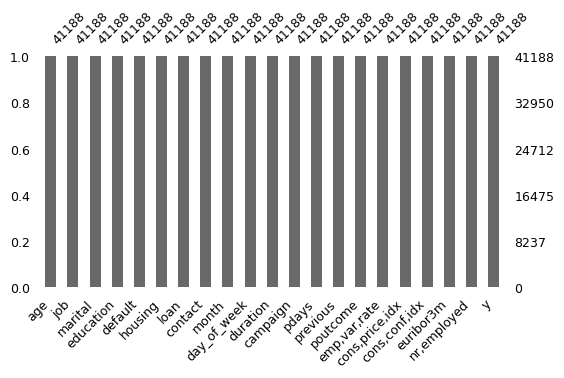

----------------------------------------------------------------------------------------------------
## Visualización de patrones en valores nulos


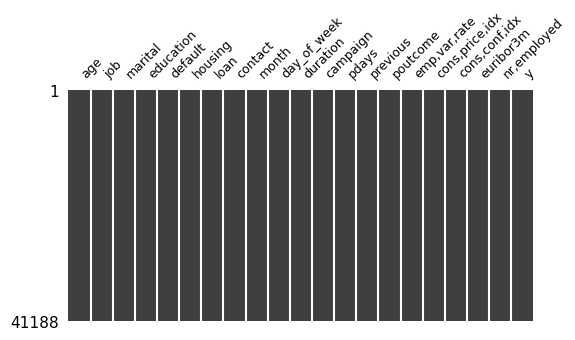

----------------------------------------------------------------------------------------------------


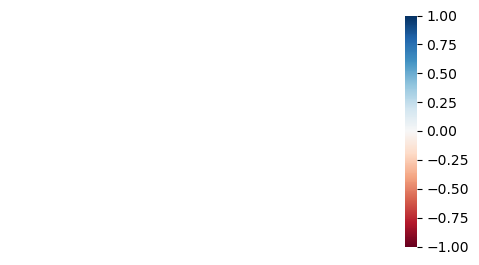

----------------------------------------------------------------------------------------------------
##########################################################################################


In [10]:
fun.exploracion_inicial(df)

In [11]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,"emp,var,rate","cons,price,idx","cons,conf,idx",euribor3m,"nr,employed",y
0,56,housemaid,married,"basic,4y",no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
1,57,services,married,"high,school",unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
2,37,services,married,"high,school",no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
3,40,"admin,",married,"basic,6y",no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no
4,56,services,married,"high,school",no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93994.0,-36.4,4857.0,5191.0,no


In [12]:
df.select_dtypes(include= 'number')

,age,duration,campaign,pdays,previous,"emp,var,rate","cons,price,idx","cons,conf,idx",euribor3m,"nr,employed"
0,56,261,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0
1,57,149,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0
2,37,226,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0
3,40,151,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0
4,56,307,1,999,0,1.1,93994.0,-36.4,4857.0,5191.0
...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94767.0,-50.8,1028.0,4963.6
41184,46,383,1,999,0,-1.1,94767.0,-50.8,1028.0,4963.6
41185,56,189,2,999,0,-1.1,94767.0,-50.8,1028.0,4963.6
41186,44,442,1,999,0,-1.1,94767.0,-50.8,1028.0,4963.6


In [13]:
df.select_dtypes(exclude= 'number')

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome,y
0,housemaid,married,"basic,4y",no,no,no,telephone,may,mon,nonexistent,no
1,services,married,"high,school",unknown,no,no,telephone,may,mon,nonexistent,no
2,services,married,"high,school",no,yes,no,telephone,may,mon,nonexistent,no
3,"admin,",married,"basic,6y",no,no,no,telephone,may,mon,nonexistent,no
4,services,married,"high,school",no,no,yes,telephone,may,mon,nonexistent,no
...,...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,cellular,nov,fri,nonexistent,yes
41184,blue-collar,married,"professional,course",no,no,no,cellular,nov,fri,nonexistent,no
41185,retired,married,"university,degree",no,yes,no,cellular,nov,fri,nonexistent,no
41186,technician,married,"professional,course",no,no,no,cellular,nov,fri,nonexistent,yes


In [14]:
orden_dias = ["mon", "tue", "wed", "thu", "fri"]
orden_meses = ["mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]

In [15]:
df["day_of_week"] = pd.Categorical(df["day_of_week"], categories=orden_dias, ordered=True)
df["month"] = pd.Categorical(df["month"], categories=orden_meses, ordered=True)

## Datos clientes

In [16]:
def graficar_barras_relativo_px(df, variable_analisis):
    orden_dias = ["mon", "tue", "wed", "thu", "fri"]
    orden_meses = ["mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]

    # asigno orden solo si la variable lo necesita
    if variable_analisis == "month":
        orden = orden_meses
    elif variable_analisis == "day_of_week":
        orden = orden_dias
    else:
        orden = None

    # conteos
    counts = df[variable_analisis].value_counts(dropna=False)

    if orden is not None:
        counts = counts.reindex(orden, fill_value=0)

    volumen = counts.reset_index()
    volumen.columns = [variable_analisis, "Frecuencia"]
    volumen["Porcentaje"] = (volumen["Frecuencia"] / volumen["Frecuencia"].sum()) * 100
    volumen["Texto"] = volumen.apply(lambda r: f'{int(r["Frecuencia"])} ({r["Porcentaje"]:.2f}%)', axis=1)

    fig = px.bar(volumen, x=variable_analisis, y="Porcentaje", text="Texto")
    fig.update_traces(texttemplate="%{text}", textposition="outside")

    if orden is not None:
        fig.update_layout(xaxis={"categoryorder": "array", "categoryarray": orden})

    fig.update_layout(
        title_text=f"Gráfico de barras relativo: {variable_analisis}",
        xaxis_title=variable_analisis,
        yaxis_title="Porcentaje",
        plot_bgcolor="white",
    )
    fig.update_xaxes(showgrid=True, gridcolor="lightgrey")
    fig.update_yaxes(showgrid=True, gridcolor="lightgrey")

    fig.show()


In [17]:
cols_clientes = ["job", "marital", "education", "default", "housing", "loan"]

In [18]:
datos_clientes = df[cols_clientes].copy() 

In [19]:
columnas_categoricas = datos_clientes.columns.tolist()

In [20]:
for col in columnas_categoricas:
    graficar_barras_relativo_px(datos_clientes, col)

## Datos campañas

In [21]:
campana_actual_cat = ["contact", "month", "day_of_week"]     # categóricas
campana_actual_num = ["duration", "campaign"]               # numéricas

In [22]:
campana_previa_cat = ["poutcome"]                           # categóricas
campana_previa_num = ["pdays", "previous"]                  # numéricas

In [23]:
resultado = ["y"]

In [24]:
df_base = df

In [25]:
df_campana_actual = df_base[campana_actual_cat + campana_actual_num + resultado].copy()
df_campana_previa = df_base[campana_previa_cat + campana_previa_num + resultado].copy()

### Campaña actual

In [26]:
for col in campana_actual_cat:
    graficar_barras_relativo_px(df_campana_actual, col)

### Campaña previa

In [27]:
for col in campana_previa_cat:
    graficar_barras_relativo_px(df_campana_previa, col)

### Resultado general

In [28]:
graficar_barras_relativo_px(df, "y")

In [29]:
def graficar_barras_resultado_por_categoria(df, variable, target="y", modo="stack",
                                           orden_meses=None, orden_dias=None):
    # Frecuencia por (categoria, resultado)
    tabla = (
        df.groupby([variable, target])
          .size()
          .reset_index(name="Frecuencia")
    )

    # Porcentaje dentro de cada categoría
    tabla["Porcentaje"] = (
        tabla.groupby(variable)["Frecuencia"]
             .transform(lambda x: x / x.sum() * 100)
    )

    # Texto Frecuencia + Porcentaje
    tabla["Texto"] = tabla.apply(
        lambda r: f'{int(r["Frecuencia"])} ({r["Porcentaje"]:.2f}%)', axis=1
    )

    # Si quiero orden natural, preparo el orden en la tabla (para no depender de plotly)
    if variable == "month" and orden_meses is not None:
        tabla[variable] = pd.Categorical(tabla[variable], categories=orden_meses, ordered=True)
        tabla = tabla.sort_values(variable)
    elif variable == "day_of_week" and orden_dias is not None:
        tabla[variable] = pd.Categorical(tabla[variable], categories=orden_dias, ordered=True)
        tabla = tabla.sort_values(variable)

    # Gráfico
    fig = px.bar(
        tabla,
        x=variable,
        y="Porcentaje",
        color=target,
        text="Texto",
        barmode=("stack" if modo == "stack" else "group")
    )

    fig.update_traces(texttemplate="%{text}", textposition="outside")

    # Orden del eje X: natural para mes/día, y por volumen para el resto
    if variable == "month" and orden_meses is not None:
        fig.update_layout(xaxis={"categoryorder": "array", "categoryarray": orden_meses})
    elif variable == "day_of_week" and orden_dias is not None:
        fig.update_layout(xaxis={"categoryorder": "array", "categoryarray": orden_dias})
    else:
        fig.update_layout(xaxis={"categoryorder": "total descending"})

    fig.update_layout(
        title_text=f"Resultado ({target}) por {variable}",
        xaxis_title=variable,
        yaxis_title="Porcentaje dentro de la categoría",
        plot_bgcolor="white",
    )
    fig.update_xaxes(showgrid=True, gridcolor="lightgrey")
    fig.update_yaxes(showgrid=True, gridcolor="lightgrey")

    fig.show()


## Análisis del target con todas las variables del dataset

### Variables campaña actual vs target sin orden

In [30]:
cols_cat_actual = ["contact", "month", "day_of_week"]
cols_cat_previa = ["poutcome"]

for col in cols_cat_actual:
    graficar_barras_resultado_por_categoria(df, col, target="y", modo="stack")

### Variable campaña previa vs target

In [31]:
for col in cols_cat_previa:
    graficar_barras_resultado_por_categoria(df, col, target="y", modo="stack")

### Campaña actual vs target con media y datos ordenados

In [32]:
def graficar_barras_resultado_por_categoria(
    df, 
    variable, 
    target="y", 
    modo="stack",
    media_conversion=None  # si es None, se calcula sola
):
    orden_dias = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]
    orden_meses = ["mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]

    # 1) Media global dinámica (si no me la pasan)
    if media_conversion is None:
        media_conversion = (df[target].astype(str).str.lower().eq("yes").mean()) * 100

    # Frecuencia por (categoria, resultado)
    tabla = (
        df.groupby([variable, target])
          .size()
          .reset_index(name="Frecuencia")
    )

    # Porcentaje dentro de cada categoría
    tabla["Porcentaje"] = (
        tabla.groupby(variable)["Frecuencia"]
             .transform(lambda x: x / x.sum() * 100)
    )

    tabla["Texto"] = tabla.apply(
        lambda r: f'{int(r["Frecuencia"])} ({r["Porcentaje"]:.2f}%)', axis=1
    )

    # Orden X para mes/día
    if variable == "day_of_week":
        tabla[variable] = pd.Categorical(tabla[variable], categories=orden_dias, ordered=True)
        tabla = tabla.sort_values(variable)
        xaxis_order = {"categoryorder": "array", "categoryarray": orden_dias}
    elif variable == "month":
        tabla[variable] = pd.Categorical(tabla[variable], categories=orden_meses, ordered=True)
        tabla = tabla.sort_values(variable)
        xaxis_order = {"categoryorder": "array", "categoryarray": orden_meses}
    else:
        xaxis_order = {"categoryorder": "total descending"}

    # Gráfico (orden apilado y colores suaves)
    fig = px.bar(
        tabla,
        x=variable,
        y="Porcentaje",
        color=target,
        text="Texto",
        barmode=("stack" if modo == "stack" else "group"),
        category_orders={target: ["yes", "no"]},
        color_discrete_map={"yes": "#EF553B", "no": "#636EFA"}
    )

    # 2) Línea media sin anotación dentro (solo la línea)
    fig.add_hline(
        y=media_conversion,
        line_dash="dash",
        line_color="black"
    )

    # 3) Anotación fuera del área del gráfico (arriba a la izquierda)
    fig.add_annotation(
        x=0, xref="paper",
        y=1.08, yref="paper",
        text=f"Media global: {media_conversion:.2f}%",
        showarrow=False,
        align="left"
    )

    fig.update_traces(texttemplate="%{text}", textposition="outside")
    fig.update_layout(
        title_text=f"Resultado ({target}) por {variable}",
        xaxis_title=variable,
        yaxis_title="Porcentaje dentro de la categoría",
        xaxis=xaxis_order,
        plot_bgcolor="white",
        margin=dict(t=90)  # deja espacio arriba para la anotación
    )
    fig.update_xaxes(showgrid=True, gridcolor="lightgrey")
    fig.update_yaxes(showgrid=True, gridcolor="lightgrey")

    fig.show()


In [33]:
cols_cat_actual = ["contact", "month", "day_of_week"]
cols_cat_previa = ["poutcome"]

for col in cols_cat_actual:
    graficar_barras_resultado_por_categoria(df, col, target="y", modo="stack")

#### Interpretación: Resultado (y) por `contact` (con media global)

Este gráfico muestra la proporción de clientes que **contratan (yes, rojo)** vs **no contratan (no, azul)** según el tipo de contacto (`cellular` vs `telephone`).

**Línea discontinua (media global):**
- La línea negra representa la **tasa de conversión global del dataset: 11.27%**.
- Sirve como referencia para ver qué categorías están **por encima** o **por debajo** de la media.

**Qué se observa:**
- **`cellular`** tiene una conversión de **14.74% (3,853 yes)** → está **por encima** de la media global (11.27%).
- **`telephone`** tiene una conversión de **5.23% (787 yes)** → está **por debajo** de la media global.

**Conclusión rápida:**
- El canal **`cellular`** se asocia con **mejor rendimiento** (mayor probabilidad de “yes”) que `telephone`.
- `contact` parece ser una variable relevante para explicar diferencias en conversión.

**Nota de contexto:**
- Es un análisis descriptivo: no prueba causalidad. La diferencia puede depender de segmentación, timing o estrategia de contacto.


#### Interpretación: Resultado (y) por `month` (con media global)

Este gráfico muestra la proporción de **contratación (yes, rojo)** vs **no contratación (no, azul)** para cada mes.  
La línea discontinua marca la **media global de conversión (11.27%)** y sirve como referencia.

**Qué se observa (patrones claros):**
- Hay meses con conversión **muy por encima** de la media:
  - **mar (~50.55%)**, **sep (~44.91%)**, **oct (~43.87%)**, **dec (~48.90%)**.
- Hay meses con conversión **claramente por debajo** de la media:
  - **may (~6.43%)**, **jul (~9.05%)**, **nov (~10.14%)** (y también **jun/aug** cerca pero por debajo o muy cerca).
- En meses como **may** el volumen total es alto (muchos contactos), pero la conversión es baja, lo que sugiere que **no solo importa el número de contactos**, sino el contexto del mes.

**Conclusión rápida:**
- `month` parece estar **muy relacionado** con la probabilidad de “yes” (hay estacionalidad marcada).
- Esto podría reflejar factores como timing de campañas, comportamiento del cliente por temporada, o condiciones macroeconómicas asociadas a ciertos meses.

**Nota importante:**
- Para interpretar bien estos picos (mar/sep/oct/dec), conviene mirar también el **tamaño de muestra por mes (n)**, porque meses con poca muestra pueden mostrar porcentajes extremos.


#### Interpretación: Resultado (y) por `day_of_week` (con media global)

Este gráfico compara la proporción de **contratación (yes, rojo)** vs **no contratación (no, azul)** según el día de la semana (`mon` a `fri`).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa:**
- Las tasas de conversión están **bastante estables** entre días (no hay diferencias grandes).
- Días **ligeramente por encima** de la media:
  - **thu ~12.12%**, **tue ~11.78%**, **wed ~11.67%**.
- Días **por debajo** de la media:
  - **mon ~9.95%** (el más bajo), **fri ~10.81%**.

**Conclusión rápida:**
- `day_of_week` parece tener un **impacto moderado/bajo** en la conversión: hay pequeñas variaciones, pero no cambios fuertes.
- Si se tuviera que priorizar por rendimiento, **jueves** (y después martes/miércoles) aparece como el mejor día, mientras que **lunes** es el más flojo.

**Nota importante:**
- Aunque la diferencia es pequeña, puede ser útil combinar `day_of_week` con otras variables (por ejemplo `month` o `contact`) para ver si existen patrones más claros por segmentos.


### Campaña previa vs target con media y datos ordenados

In [34]:
for col in cols_cat_previa:
    graficar_barras_resultado_por_categoria(df, col, target="y", modo="stack")

#### Interpretación: Resultado (y) por `poutcome` (campaña previa)

Este gráfico muestra cómo cambia la probabilidad de **contratación (yes, rojo)** según el resultado de la **campaña previa** (`poutcome`).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa (tasa de conversión “yes” dentro de cada categoría):**
- **success → 65.11% (894 casos)**  
  Es una conversión **muy superior** a la media global. Si una persona ya tuvo “éxito” en una campaña anterior, es mucho más probable que vuelva a contratar.
- **failure → 14.23% (605 casos)**  
  Está **ligeramente por encima** de la media global, pero lejos del nivel de “success”. Indica que “fallar” antes no elimina la posibilidad de convertir, aunque no ayuda demasiado.
- **nonexistent → 8.83% (3141 casos)**  
  Está **por debajo** de la media global. Son clientes sin resultado previo registrado (o sin campaña previa), y su probabilidad de contratación es menor.

**Conclusión rápida:**
- `poutcome` es una de las variables más informativas: el histórico de campaña previa **marca mucha diferencia**.
- En términos de negocio, el segmento **poutcome=success** es “prioridad alta” porque convierte muchísimo más.

**Nota importante (para no interpretar mal):**
- `poutcome` describe el resultado de una campaña anterior, y **no es lo mismo** que el target `y` (resultado de esta campaña).  
  Por eso puede existir `poutcome=failure` y aun así `y=yes` en la campaña actual: falló antes, pero ahora sí contrata.


In [35]:
pd.crosstab(df["poutcome"], df["y"])

y,no,yes
poutcome,,
failure,3647,605
nonexistent,32422,3141
success,479,894


In [36]:
pd.crosstab(df["poutcome"], df["y"], normalize="index") * 100

y,no,yes
poutcome,,
failure,85.771402,14.228598
nonexistent,91.167787,8.832213
success,34.887109,65.112891


### Variables clientes vs target

In [37]:
cols_clientes = ["job", "marital", "education", "default", "housing", "loan", "age", "y"]

In [38]:
df_clientes = df[cols_clientes].copy()

In [39]:
df_clientes

,job,marital,education,default,housing,loan,age,y
0,housemaid,married,"basic,4y",no,no,no,56,no
1,services,married,"high,school",unknown,no,no,57,no
2,services,married,"high,school",no,yes,no,37,no
3,"admin,",married,"basic,6y",no,no,no,40,no
4,services,married,"high,school",no,no,yes,56,no
...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes
41184,blue-collar,married,"professional,course",no,no,no,46,no
41185,retired,married,"university,degree",no,yes,no,56,no
41186,technician,married,"professional,course",no,no,no,44,yes


In [40]:
cols_cat_clientes = ["job", "marital", "education", "default", "housing", "loan"]
cols_cat_clientes = [c for c in cols_cat_clientes if c in df_clientes.columns]
for col in cols_cat_clientes:
    graficar_barras_resultado_por_categoria(df_clientes, col, target="y", modo="stack")

#### Interpretación: Resultado (y) por `job`

Este gráfico compara la **tasa de conversión (yes, rojo)** entre distintos tipos de **ocupación** (`job`).  
La línea discontinua marca la **media global de conversión (11.27%)**, así que nos sirve como referencia para ver qué grupos convierten por encima o por debajo del promedio.

**Hallazgos principales (qué categorías destacan):**
- **student → 31.43%**  
  Es la categoría con **mayor conversión**, muy por encima de la media. Indica que, en este dataset, los estudiantes son un segmento especialmente propenso a contratar.
- **retired → 25.23%**  
  También presenta una conversión **muy alta**. Los jubilados aparecen como otro perfil con probabilidad elevada de contratación.
- **unemployed → 14.20%** y **admin. → 12.97%**  
  Están **ligeramente por encima** de la media global, con un rendimiento moderadamente bueno.
- **blue-collar → 6.89%**, **services → 8.14%**, **entrepreneur → 8.52%**  
  Son perfiles con conversión **por debajo de la media**, por lo que (en este dataset) parecen menos propensos a contratar.

**Conclusión rápida:**
- La variable `job` sí parece aportar señal: hay diferencias claras de conversión entre ocupaciones.
- Para decisiones de campaña, **student** y **retired** serían perfiles “prioritarios” (alta conversión), mientras que **blue-collar / services / entrepreneur** podrían requerir un enfoque distinto (mensaje, oferta o canal) porque convierten menos.

**Nota de cautela (importante):**
- Algunas categorías pueden tener **tamaños de muestra distintos**. Si un grupo tiene pocos casos, su porcentaje puede ser más inestable. Por eso conviene mirar también el volumen de cada categoría antes de sacar conclusiones definitivas.


#### Interpretación: Resultado (y) por `marital`

Este gráfico compara la **tasa de conversión (yes, rojo)** según el **estado civil** (`marital`).  
La línea discontinua representa la **media global de conversión (11.27%)**, que usamos como referencia.

**Qué se observa (comparado con la media):**
- **single → 14.00%**  
  Conversión **por encima de la media**. Dentro de este dataset, las personas solteras muestran mayor probabilidad de contratar que el promedio.
- **married → 10.16%** y **divorced → 10.32%**  
  Conversión **ligeramente por debajo de la media**. La diferencia existe, pero no es muy grande.
- **unknown → 15.00%**  
  Conversión aparentemente **alta**, pero hay que interpretarlo con cautela porque el **tamaño de muestra es muy pequeño** (se ve un volumen muy bajo), así que el porcentaje puede ser inestable.

**Conclusión rápida:**
- `marital` aporta **algo de señal**, pero las diferencias son **moderadas**.
- El grupo **single** destaca como el segmento más favorable (con diferencia clara vs media).
- El grupo **unknown** no lo tomaría como insight sólido sin confirmar primero el volumen (n) y, si es posible, revisar si hay sesgo en ese registro.

**Idea accionable (si esto fuera una campaña):**
- Priorizar / testar mensajes para **single**, y mantener el resto como baseline porque las diferencias entre **married** y **divorced** son pequeñas.


#### Interpretación: Resultado (y) por `education`

Este gráfico muestra la **tasa de conversión (yes, rojo)** según el nivel de **educación** (`education`).  
La línea discontinua marca la **media global de conversión (11.27%)** para comparar cada grupo con el promedio.

**Qué se observa (comparado con la media):**
- **university.degree → 13.72%**  
  Conversión **por encima de la media**. En este dataset, quienes tienen grado universitario presentan mayor probabilidad de contratar.
- **unknown → 14.50%**  
  Conversión alta, pero es un grupo “cajón” (valor faltante/indefinido). Puede esconder perfiles mixtos, así que conviene interpretarlo con cautela.
- **professional.course → 11.35%**  
  Muy cerca de la media (ligeramente por encima). No es un salto grande, pero es consistente.
- **high.school → 10.84%** y **basic.4y → 10.25%**  
  Ligeramente **por debajo** del promedio.
- **basic.6y → 8.20%** y **basic.9y → 7.82%**  
  Conversión **claramente por debajo** de la media: parecen segmentos menos propensos a contratar.
- **illiterate → 22.22%**  
  Ojo: el porcentaje es alto, pero el **tamaño de muestra es mínimo** (se ve muy poco volumen). Esto suele generar porcentajes “inflados” que no son estables.

**Conclusión rápida:**
- Hay una **tendencia general**: a mayor nivel educativo, la conversión tiende a ser **más alta** (destaca `university.degree`), mientras que los niveles `basic.*` tienden a estar **por debajo**.
- Los grupos **`illiterate` y `unknown`** deben tratarse con cautela: uno por **muestra pequeña** y el otro por ser **categoría poco informativa**.

**Idea accionable (si esto fuera una campaña):**
- Segmentar o personalizar mensajes priorizando **`university.degree`** (y quizá `professional.course`), y revisar si los segmentos `basic.*` necesitan un enfoque distinto (mensaje más simple, más confianza/beneficios concretos, etc.).


#### Interpretación: Resultado (y) por `default`

Este gráfico muestra la **tasa de conversión (yes, rojo)** según si el cliente tiene **default (impago)** (`default`).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa (comparado con la media):**
- **default = no → 12.88%**  
  Conversión **por encima de la media**. Es el grupo “más saludable” y además el más informativo (tiene mucho volumen).
- **default = unknown → 5.15%**  
  Conversión **muy por debajo** de la media. Esto suele indicar que “unknown” no es neutro: puede estar capturando perfiles con menos información/peor calidad de registro o clientes menos cualificados.
- **default = yes → 0%**  
  Aquí hay que tener cuidado: aparece **0%** porque el **tamaño de muestra es extremadamente bajo** (se ve que apenas hay casos). Con tan pocos datos, no se puede concluir que “tener default implica 0 conversión”; simplemente no hay evidencia suficiente en esta muestra.

**Conclusión rápida:**
- `default` parece una variable **relevante**, pero sobre todo por la diferencia clara entre **`no`** y **`unknown`**.
- El valor **`unknown`** es una señal de alerta: se asocia a una conversión mucho menor y conviene revisarlo (qué significa exactamente y por qué falta el dato).
- No se puede interpretar el grupo **`yes`** con fiabilidad por el **bajo volumen**.

**Idea accionable (si esto fuera una campaña):**
- Tratar `default=unknown` como un segmento separado (no asumir que se comporta igual que `no`).
- Para modelado, considerar:
  - mantener `unknown` como categoría propia,
  - y revisar si conviene imputar/limpiar esa variable en función del contexto del dataset.


#### Interpretación: Resultado (y) por `housing`

Este gráfico muestra la **tasa de conversión (yes, rojo)** según si el cliente tiene **préstamo hipotecario** (`housing`).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa (comparado con la media):**
- **housing = yes → 11.62%**  
  Conversión **ligeramente por encima** de la media. La diferencia es pequeña, pero sugiere que quienes tienen hipoteca podrían estar **muy ligeramente** más predispuestos a contratar.
- **housing = no → 10.88%**  
  Conversión **ligeramente por debajo** de la media. No es una caída grande, pero queda por debajo del promedio.
- **housing = unknown → 10.81%**  
  Conversión **por debajo** de la media. Aquí conviene ser prudente porque suele ser un grupo menos fiable (y normalmente con menos muestra), por lo que puede representar **falta de información** más que un perfil real.

**Conclusión rápida:**
- `housing` parece una variable con **señal débil**: las tasas están muy cerca entre sí (diferencias pequeñas).
- La lectura más consistente es que **tener hipoteca (yes)** se asocia a una conversión **un poco mejor**, pero no lo suficiente como para considerarlo un driver fuerte por sí solo.
- `unknown` se comporta parecido a `no`, y conviene interpretarlo como una categoría **no neutra** (posible calidad de dato/registro incompleto).

**Idea accionable (si esto fuera una campaña):**
- No segmentaría la estrategia solo por `housing`, pero sí lo usaría como **variable de apoyo** combinada con otras (por ejemplo `loan`, `job`, `age`, `poutcome`).
- Para modelado, mantener `unknown` como categoría separada (no imputarla automáticamente como `no`) y, si es posible, **investigar por qué falta ese dato** (origen del canal, errores de captura, etc).


#### Interpretación: Resultado (y) por `loan`

Este gráfico muestra la **tasa de conversión (yes, rojo)** según si el cliente tiene **préstamo personal** (`loan`).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa (comparado con la media):**
- **loan = no → 11.34%**  
  Conversión **muy ligeramente por encima** de la media. Es el grupo con mayor volumen, por lo que es el más estable para sacar conclusiones.
- **loan = yes → 10.93%**  
  Conversión **ligeramente por debajo** de la media. Sugiere que tener un préstamo personal activo podría estar asociado a una **menor predisposición** a contratar, aunque la diferencia es pequeña.
- **loan = unknown → 10.81%**  
  Conversión **por debajo** de la media. De nuevo, “unknown” suele reflejar **falta de información** o variaciones en la captura del dato, por lo que conviene tratarlo como categoría propia y no como neutra.

**Conclusión rápida:**
- `loan` aporta una señal **débil pero coherente**:  
  el grupo **sin préstamo (no)** convierte algo mejor que quienes **sí tienen préstamo (yes)**.
- Las diferencias son **pequeñas**, así que por sí sola no es una variable “decisiva”, pero sí puede sumar cuando la combines con otras (p. ej., `housing`, `job`, `age`, `poutcome`).

**Idea accionable (si esto fuera una campaña):**
- No tomaría decisiones fuertes solo por `loan`, pero sí lo usaría para **micro-segmentación**:
  - Priorizar (ligeramente) audiencias con `loan=no` si tienes que optimizar presupuesto/tiempo de contacto.
  - Mantener `loan=unknown` separado y revisar si el “unknown” proviene de un canal/captura específica (posible mejora de calidad de datos).
- Para modelado: mantener `unknown` como categoría propia y evaluar interacciones (`loan` + `housing` + variables de campaña).


In [41]:
if "age" in df_clientes.columns:
    # tramos sencillos para que sea más fácil de interpretar
    bins = [17, 25, 35, 45, 55, 65, 120]
    labels = ["18-25", "26-35", "36-45", "46-55", "56-65", "66+"]

    df_clientes["age_group"] = pd.cut(df_clientes["age"], bins=bins, labels=labels)

    graficar_barras_resultado_por_categoria(df_clientes, "age_group", target="y", modo="stack")

#### Interpretación: Resultado (y) por `age_group`

Este gráfico muestra la **tasa de conversión (yes, rojo)** según el **grupo de edad** (`age_group`).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa (comparado con la media):**
- **18–25 → 20.89%**  
  Conversión **muy por encima** de la media. Es un segmento joven con alta propensión relativa a contratar.
- **26–35 → 11.72%**  
  Conversión **muy cercana** a la media (ligeramente por encima). Segmento “neutral”.
- **36–45 → 8.51%** y **46–55 → 8.69%**  
  Conversión **por debajo** de la media. Aquí se concentra la parte menos favorable del rango “adulto medio”.
- **56–65 → 15.22%**  
  Conversión **por encima** de la media. Vuelve a subir claramente en edades más altas.
- **66+ → 46.85%**  
  Conversión **extraordinariamente alta** frente a la media. **Ojo**: aunque es un resultado muy llamativo, este grupo tiene **mucho menos volumen** que el resto (se ve por el conteo), así que puede estar inflado por el tamaño de muestra o por un sesgo de selección (p. ej., se contacta a perfiles muy específicos dentro de 66+).

**Conclusión rápida:**
- La relación entre edad y conversión parece **no lineal**:  
  cae en edades intermedias (36–55) y **sube fuerte** en 18–25 y especialmente en 56+.
- `age_group` es una variable **potencialmente muy relevante**, pero el caso de **66+** requiere validación por volumen y posibles sesgos (no asumir causalidad directa).

**Idea accionable (si esto fuera una campaña):**
- Priorizar/optimizar mensajes para segmentos con mejor rendimiento: **18–25** y **56–65**.
- Tratar **66+** como “segmento premium” pero con control:  
  revisar el **tamaño de muestra**, estabilidad por mes/canal, y si hay variables que lo expliquen (p. ej., `contact`, `poutcome`, `campaign`, `duration`).
- Para modelado: mantener `age_group` (o incluso usar `age` numérica con no-linealidad: binning, splines o árboles) porque la señal no parece lineal.


In [42]:
df_clientes.head()

,job,marital,education,default,housing,loan,age,y,age_group
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65
1,services,married,"high,school",unknown,no,no,57,no,56-65
2,services,married,"high,school",no,yes,no,37,no,36-45
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45
4,services,married,"high,school",no,no,yes,56,no,56-65


### Evaluación del impacto de los detalles de la campaña actual

In [43]:
cols_campana = ["campaign", "month", "day_of_week", "contact", "y"]
cols_campana = [c for c in cols_campana if c in df.columns]

df_campana = df[cols_campana].copy()

In [44]:
cols_cat_actual = ["month", "day_of_week", "contact"]
cols_cat_actual = [c for c in cols_cat_actual if c in df_campana.columns]

for col in cols_cat_actual:
    graficar_barras_resultado_por_categoria(df_campana, col, target="y", modo="stack")

In [45]:
if "campaign" in df_campana.columns:
    df_campana["campaign_group"] = df_campana["campaign"].apply(
        lambda x: "1" if x == 1 else ("2" if x == 2 else ("3" if x == 3 else "4+"))
    )

    graficar_barras_resultado_por_categoria(df_campana, "campaign_group", target="y", modo="stack")

#### Interpretación: Resultado (y) por `campaign_group`

Este gráfico muestra la **tasa de conversión (yes, rojo)** según el **número de contactos realizados en la campaña actual** (`campaign_group`: 1, 2, 3, 4+).  
La línea discontinua marca la **media global de conversión (11.27%)**.

**Qué se observa (comparado con la media):**
- **1 contacto → 13.04%**  
  Conversión **por encima** de la media. Cuando se contacta una sola vez, el rendimiento es relativamente alto.
- **2 contactos → 11.46%**  
  Conversión **muy cercana** a la media (ligeramente por encima). Aún se mantiene estable.
- **3 contactos → 10.75%**  
  Conversión **ligeramente por debajo** de la media. Empieza a verse un descenso.
- **4+ contactos → 7.27%**  
  Conversión **claramente por debajo** de la media. Es el peor grupo en términos de rendimiento.

**Lectura lógica (por qué puede pasar):**
- Este patrón suele indicar **“fatiga / baja cualificación”**: cuando una persona necesita muchos intentos, normalmente es porque **no estaba interesada** o **noo no encajaba bien** desde el principio.
- Importante: `campaign` **no es una acción causal limpia** (no significa que “llamar más empeora”). Más bien refleja una **decisión operativa**: los casos difíciles reciben más contactos.

**Conclusión rápida:**
- Hay una **relación negativa**: a más contactos (sobre todo **4+**), **menor conversión**.
- `campaign_group` parece una variable **muy informativa** para segmentación y para modelos predictivos.

**Idea accionable (si esto fuera una campaña):**
- Definir un “punto de corte” operativo: por ejemplo, **tras 3 intentos** replantear el enfoque (cambiar mensaje/canal) o pasar a nurture.
- Tratar **4+** como un segmento de **baja prioridad** o de **recuperación**, optimizando coste/tiempo del equipo.
- Complementar este gráfico con `duration` y `poutcome`: muchas veces el “éxito” real se concentra en **pocos contactos** y en perfiles que ya venían más predispuestos.


In [46]:
def resumen_yes_por_categoria(df, col, target="y"):
    tabla = pd.crosstab(df[col], df[target])
    tabla["total"] = tabla.sum(axis=1)
    tabla["tasa_yes"] = (tabla.get("yes", 0) / tabla["total"]) * 100
    return tabla.sort_values("tasa_yes", ascending=False)

for col in cols_cat_actual + (["campaign_group"] if "campaign_group" in df_campana.columns else []):
    print(f"\n--- {col} ---")
    display(resumen_yes_por_categoria(df_campana, col, target="y"))


--- month ---


y,no,yes,total,tasa_yes
month,,,,
mar,270,276,546,50.549451
dec,93,89,182,48.901099
sep,314,256,570,44.912281
oct,403,315,718,43.871866
apr,2093,539,2632,20.478723
aug,5523,655,6178,10.602137
jun,4759,559,5318,10.511470
nov,3685,416,4101,10.143867
jul,6525,649,7174,9.046557



--- day_of_week ---


y,no,yes,total,tasa_yes
day_of_week,,,,
thu,7578,1045,8623,12.118752
tue,7137,953,8090,11.779975
wed,7185,949,8134,11.667076
fri,6981,846,7827,10.808739
mon,7667,847,8514,9.948320



--- contact ---


y,no,yes,total,tasa_yes
contact,,,,
cellular,22291,3853,26144,14.737607
telephone,14257,787,15044,5.231321



--- campaign_group ---


y,no,yes,total,tasa_yes
campaign_group,,,,
1,15342,2300,17642,13.037071
2,9359,1211,10570,11.456954
3,4767,574,5341,10.747051
4+,7080,555,7635,7.269155


### Variables macro vs target

In [47]:
df.columns = df.columns.str.strip()
df.columns = df.columns.str.replace(",", ".", regex=False)

df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [48]:
df["cons.price.idx"] = df["cons.price.idx"].where(df["cons.price.idx"] <= 200, df["cons.price.idx"] / 1000)
df["euribor3m"] = df["euribor3m"].where(df["euribor3m"] <= 50, df["euribor3m"] / 1000)

In [49]:
macro_cols = ["emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m", "nr.employed"]

df_macro = df[macro_cols + ["y", "month"]].copy()

In [50]:
df_macro[macro_cols].describe()

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,1.570960,0.578840,4.628198,1.734447,72.251528
min,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [51]:
df_macro[macro_cols].nunique().sort_values()

emp.var.rate       10
nr.employed        11
cons.price.idx     26
cons.conf.idx      26
euribor3m         316
dtype: int64

In [52]:
df_macro.groupby("month")[macro_cols].mean()

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
month,,,,,
mar,-1.800000,93.097330,-42.650549,1.162745,5055.390110
apr,-1.800000,93.119558,-46.273632,1.361070,5093.123708
may,-0.164972,93.528882,-40.579272,3.293665,5149.521592
jun,0.688379,94.245402,-41.579428,4.256908,5197.493193
jul,1.158921,93.894923,-42.370170,4.685678,5214.078575
aug,0.747151,93.311065,-35.597184,4.300623,5200.248349
sep,-2.177368,93.346474,-33.893158,0.834760,4988.847895
oct,-2.438579,93.175107,-34.580919,1.200123,5018.823816
nov,-0.418483,93.200943,-41.238747,3.723123,5173.031236


In [53]:
corr = df_macro[macro_cols].corr(method="pearson")
corr

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
emp.var.rate,1.000000,0.775334,0.196041,0.972245,0.906970
cons.price.idx,0.775334,1.000000,0.058986,0.688230,0.522034
cons.conf.idx,0.196041,0.058986,1.000000,0.277686,0.100513
euribor3m,0.972245,0.688230,0.277686,1.000000,0.945154
nr.employed,0.906970,0.522034,0.100513,0.945154,1.000000


Se observa una fuerte colinealidad entre emp.var.rate, euribor3m y nr.employed (r > 0.90), lo que sugiere que capturan un componente macroeconómico común y probablemente relacionado con el periodo temporal del dataset. cons.price.idx mantiene correlaciones moderadas con este bloque, mientras que cons.conf.idx presenta correlaciones bajas con el resto, aportando información más independiente.

In [54]:
orden_meses = ["mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]

df_macro = df[macro_cols + ["y", "month"]].copy()

# y a 0/1
df_macro["y_bin"] = df_macro["y"].astype(str).str.lower().map({"no": 0, "yes": 1})

# month categórica ordenada
df_macro["month"] = pd.Categorical(df_macro["month"], categories=orden_meses, ordered=True)

In [55]:
macro_mes_mean = df_macro.groupby("month")[macro_cols].mean()
macro_mes_median = df_macro.groupby("month")[macro_cols].median()

macro_mes_mean, macro_mes_median

(       emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed
 month                                                                     
 mar       -1.800000       93.097330     -42.650549   1.162745  5055.390110
 apr       -1.800000       93.119558     -46.273632   1.361070  5093.123708
 may       -0.164972       93.528882     -40.579272   3.293665  5149.521592
 jun        0.688379       94.245402     -41.579428   4.256908  5197.493193
 jul        1.158921       93.894923     -42.370170   4.685678  5214.078575
 aug        0.747151       93.311065     -35.597184   4.300623  5200.248349
 sep       -2.177368       93.346474     -33.893158   0.834760  4988.847895
 oct       -2.438579       93.175107     -34.580919   1.200123  5018.823816
 nov       -0.418483       93.200943     -41.238747   3.723123  5173.031236
 dec       -2.846154       92.715363     -33.708791   0.865319  5031.895604,
        emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed
 month     

In [56]:
df_macro.groupby("month")[macro_cols].nunique()

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
month,,,,,
mar,1,2,2,37,2
apr,1,2,2,29,2
may,2,3,3,35,3
jun,3,3,3,44,3
jul,3,3,3,51,3
aug,3,3,3,39,3
sep,2,2,2,31,2
oct,3,3,3,48,3
nov,3,3,3,38,3


Si nunique es muy bajo (1–3) por mes, significa que ese mes comparte casi el mismo contexto macro para todos los registros. Es un “atributo del periodo”, no del cliente.

In [57]:
conv_mes = df_macro.groupby("month")["y_bin"].mean() * 100
conv_mes

month
mar    50.549451
apr    20.478723
may     6.434745
jun    10.511470
jul     9.046557
aug    10.602137
sep    44.912281
oct    43.871866
nov    10.143867
dec    48.901099
Name: y_bin, dtype: float64

In [58]:
# tamaño de muestra por mes
n_mes = df_macro.groupby("month").size()

# construir resumen mensual
resumen_mes = macro_mes_mean.copy()
resumen_mes["conversion_%"] = conv_mes
resumen_mes["n_muestra"] = n_mes

resumen_mes

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,conversion_%,n_muestra
month,,,,,,,
mar,-1.800000,93.097330,-42.650549,1.162745,5055.390110,50.549451,546
apr,-1.800000,93.119558,-46.273632,1.361070,5093.123708,20.478723,2632
may,-0.164972,93.528882,-40.579272,3.293665,5149.521592,6.434745,13769
jun,0.688379,94.245402,-41.579428,4.256908,5197.493193,10.511470,5318
jul,1.158921,93.894923,-42.370170,4.685678,5214.078575,9.046557,7174
aug,0.747151,93.311065,-35.597184,4.300623,5200.248349,10.602137,6178
sep,-2.177368,93.346474,-33.893158,0.834760,4988.847895,44.912281,570
oct,-2.438579,93.175107,-34.580919,1.200123,5018.823816,43.871866,718
nov,-0.418483,93.200943,-41.238747,3.723123,5173.031236,10.143867,4101


In [59]:
cols_corr = macro_cols + ["conversion_%"]   # solo macros + target mensual
corr_mes_spearman = resumen_mes[cols_corr].corr(method="spearman")["conversion_%"].sort_values(ascending=False)
corr_mes_spearman

conversion_%      1.000000
cons.conf.idx     0.236364
nr.employed      -0.721212
cons.price.idx   -0.733333
emp.var.rate     -0.747724
euribor3m        -0.781818
Name: conversion_%, dtype: float64

Correlación positiva: cuando la variable macro sube en ese mes, suele subir la conversión mensual.

Negativa: cuando sube la macro, baja la conversión.

Ojo: aquí tenemos muy pocos puntos (meses), así que se interpreta como indicio, no prueba.

In [60]:
# Conversión por mes
fig = px.line(conv_mes.reset_index(name="conversion_%"), x="month", y="conversion_%", markers=True,
              title="Conversión (%) por mes")
fig.show()

# Ejemplo: euribor3m por mes
fig2 = px.line(macro_mes_mean.reset_index(), x="month", y="euribor3m", markers=True,
               title="euribor3m medio por mes")
fig2.show()

In [61]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Asegurar que el índice (month) está ordenado como categórica
orden_meses = ["mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]

conv_plot = conv_mes.copy()
eur_plot = macro_mes_mean["euribor3m"].copy()

# Reindex para forzar el orden
conv_plot = conv_plot.reindex(orden_meses)
eur_plot = eur_plot.reindex(orden_meses)

# Figura con doble eje Y
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Conversión (izquierda)
fig.add_trace(
    go.Scatter(
        x=conv_plot.index,
        y=conv_plot.values,
        mode="lines+markers",
        name="Conversión (%)"
    ),
    secondary_y=False
)

# Euribor (derecha) en rojo
fig.add_trace(
    go.Scatter(
        x=eur_plot.index,
        y=eur_plot.values,
        mode="lines+markers",
        name="Euribor 3m",
        line=dict(color="#EF553B")
    ),
    secondary_y=True
)

fig.update_layout(
    title="Conversión (%) y Euribor 3m por mes",
    xaxis_title="Mes",
    legend_title="Series",
    plot_bgcolor="white"
)

fig.update_yaxes(title_text="Conversión (%)", secondary_y=False, showgrid=True, gridcolor="lightgrey")
fig.update_yaxes(title_text="Euribor 3m", secondary_y=True, showgrid=False)

fig.show()


#### Interpretación: Conversión (%) y Euribor 3m por mes

Este gráfico compara, **mes a mes**, la **tasa de conversión** (línea azul) con el **Euribor a 3 meses** (línea roja).  
La idea es ver si el contexto de **tipos de interés** podría estar asociado a cambios en la probabilidad de contratación del depósito.

**Qué se observa (patrones comparados):**
- **Euribor alto (mayo–agosto) → conversión baja**  
  En este tramo el Euribor sube fuerte (≈ 3.3–4.7) y la conversión se mantiene baja (≈ **6%–11%**).
- **Euribor muy bajo (septiembre–octubre) → conversión muy alta**  
  Tras la caída del Euribor (≈ 0.83–1.20), la conversión sube claramente (≈ **44%–45%**).
- **Rebote del Euribor (noviembre) → conversión baja**  
  Cuando el Euribor vuelve a subir (≈ 3.72), la conversión cae otra vez (≈ **10%**).
- **Euribor bajo (diciembre) → conversión muy alta**  
  Con Euribor bajo (≈ 0.87), la conversión vuelve a niveles muy altos (≈ **49%**).

**Lectura lógica (por qué puede pasar):**
- A simple vista aparece una **relación inversa**: cuando el **Euribor está alto**, la conversión tiende a ser **más baja**; cuando el **Euribor baja**, la conversión tiende a **subir**.
- Ojo: aquí puede haber también **estacionalidad** (momentos del año con campañas más efectivas) y/o **efecto composición** (no se contacta al mismo tipo de cliente cada mes).

**Conclusión rápida:**
- El gráfico sugiere que **Euribor3m es una variable relevante de contexto temporal** y podría estar asociada a la conversión.
- Aun así, esto es **exploratorio**: el gráfico muestra **coincidencias temporales**, no causalidad.

**Idea accionable (si esto fuera una campaña / análisis):**
- Validar la hipótesis con el **tamaño de muestra por mes** (n_muestra), porque meses con muy poco volumen pueden inflar porcentajes.
- Complementar con un análisis a nivel individual (p. ej., un modelo/logit con `euribor3m` + variables operativas como `contact`, `campaign`, `duration`, `poutcome`), para separar:
  - efecto **macro** (tipos de interés),
  - de efecto **operativo/segmentación** (a quién se contactó y cómo).


# Análisis de respuesta de la campaña


## Comparación de tasas de éxito entre los diferentes tipos de cliente

¿Qué significa tasa de éxito? Tasa de éxito del segmento = % de clientes del segmento que terminan en y="yes"

¿Qué se consideran "tipos de clientes? 
Normalmente se refieren a características del cliente, como:

- Demográficas: age / age_group, job, education, marital

- Financieras: default, housing, loan

- Histórico con campañas previas: poutcome, previous (si lo usamos como “cliente ya contactado antes”)

In [62]:
df_clientes

,job,marital,education,default,housing,loan,age,y,age_group
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65
1,services,married,"high,school",unknown,no,no,57,no,56-65
2,services,married,"high,school",no,yes,no,37,no,36-45
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45
4,services,married,"high,school",no,no,yes,56,no,56-65
...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes,66+
41184,blue-collar,married,"professional,course",no,no,no,46,no,46-55
41185,retired,married,"university,degree",no,yes,no,56,no,56-65
41186,technician,married,"professional,course",no,no,no,44,yes,36-45


In [63]:
import scipy.stats as stats
from scipy.stats import chi2_contingency

### Housing vs y

In [64]:
# 1) Definir variables (cámbiala según el "tipo de cliente" que quieras analizar)
variable_dependiente = "y"
variable_independiente_housing = "housing"   # ejemplo: job, education, marital, default, loan, age_group...

In [65]:
df[variable_dependiente] = pd.Categorical(df[variable_dependiente], categories=["yes", "no"], ordered=True)

In [66]:
tabla_freq_obs_housing = pd.crosstab(df[variable_dependiente], df[variable_independiente_housing])
tabla_freq_obs_housing

housing,no,unknown,yes
y,,,
yes,2026,107,2507
no,16596,883,19069


Cada celda significa:

2026 = número de clientes que sí contrataron (y=yes) y no tienen hipoteca (housing=no)

2507 = número de clientes que sí contrataron y sí tienen hipoteca (housing=yes)

19069 = número de clientes que no contrataron y sí tienen hipoteca

etc.

In [67]:
pd.crosstab(df[variable_dependiente],
            df[variable_independiente_housing],
            margins=True)

housing,no,unknown,yes,All
y,,,,
yes,2026,107,2507,4640
no,16596,883,19069,36548
All,18622,990,21576,41188


In [68]:
tabla_pct_housing = (pd.crosstab(df[variable_dependiente],
                         df[variable_independiente_housing],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_housing

housing,no,unknown,yes
y,,,
yes,10.88,10.81,11.62
no,89.12,89.19,88.38


Ejemplo, columna housing = no:

y = yes → 10.88%
De todos los clientes sin hipoteca, el 10.88% contrató el depósito.

y = no → 89.12%
El 89.12% no contrató.

Columna housing = yes:

y = yes → 11.62%
De todos los clientes con hipoteca, el 11.62% contrató.

y = no → 88.38% no contrató.

Columna housing = unknown:

y = yes → 10.81%

y = no → 89.19%

Qué estamos concluyendo con esta tabla:

La tasa de éxito (conversión) es muy parecida entre grupos:

Sin hipoteca: 10.88%

Hipoteca unknown: 10.81%

Con hipoteca: 11.62% (la más alta)

La diferencia más clara aquí es que housing=yes convierte un poco mejor, pero la diferencia es pequeña (≈ +0.74 puntos vs housing=no).

In [69]:
media_global = (df["y"] == "yes").mean() * 100

resumen_tasa_housing = pd.DataFrame({
    "n_muestra": tabla_freq_obs_housing.sum(axis=0),
    "conversion_%": tabla_pct_housing.loc["yes"]
})

resumen_tasa_housing["lift_vs_media_pp"] = resumen_tasa_housing["conversion_%"] - media_global
resumen_tasa_housing = resumen_tasa_housing.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_housing

Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
housing,,,
yes,21576,11.62,0.354583
no,18622,10.88,-0.385417
unknown,990,10.81,-0.455417


El grupo con hipoteca (housing=yes) convierte ligeramente mejor que la media.

Los grupos sin hipoteca y unknown convierten ligeramente peor.

Las diferencias son pequeñas (del orden de 0.3–0.5 pp), así que:

No parece una variable súper discriminante por sí sola,

aunque housing=yes sí muestra un “plus” pequeño y con mucho volumen, lo cual le da credibilidad.

In [70]:
chi2, p_value, dof, expected_values = chi2_contingency(tabla_freq_obs_housing)

print(f"p-valor = {p_value:.4f}")

p-valor = 0.0583


Estás testeando si dos variables categóricas son independientes (no están asociadas) o están asociadas.

Variable 1: y (yes/no)

Variable 2: housing (yes/no/unknown)

La prueba no dice dirección (“más” o “menos”), solo dice si hay asociación estadística entre ambas.

Hipótesis nula (H0)

y y housing son independientes.
Es decir: la proporción de “yes” es la misma (salvo azar) para housing=no, housing=yes y housing=unknown.

Hipótesis alternativa (H1)

y y housing no son independientes (hay asociación).
Es decir: al menos una categoría de housing tiene una proporción de “yes” distinta.

Si p ≤ 0.05 → rechazas H0 → concluyes que hay asociación entre housing y y.

Si p > 0.05 → NO rechazas H0 → no tienes evidencia suficiente de asociación.

Tu resultado: p-valor = 0.0583

Como 0.0583 > 0.05:

No rechazas H0 al 5%.

Conclusión práctica: la evidencia de relación entre housing y y es débil / no concluyente con el umbral típico de 0.05.

In [71]:
# Calcular V de Cramér
n = tabla_freq_obs_housing.to_numpy().sum()      # tamaño total de la muestra
r, k = tabla_freq_obs_housing.shape              # filas y columnas de la tabla

v_cramer = np.sqrt((chi2 / n) / min(r - 1, k - 1))
print(f"V de Cramér = {v_cramer:.4f}")

V de Cramér = 0.0117


In [72]:
cols_cat_clientes = ["age_group", "job", "marital", "education", "default", "housing", "loan"]

### Job vs y

In [73]:
variable_dependiente = "y"
variable_independiente_job = "job"

In [74]:
tabla_freq_obs_job = pd.crosstab(df[variable_dependiente], df[variable_independiente_job])
tabla_freq_obs_job

job,"admin,",blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
y,,,,,,,,,,,,
yes,1352,638,124,106,328,434,149,323,275,730,144,37
no,9070,8616,1332,954,2596,1286,1272,3646,600,6013,870,293


In [75]:
pd.crosstab(df[variable_dependiente],
            df[variable_independiente_job],
            margins=True)


job,"admin,",blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown,All
y,,,,,,,,,,,,,
yes,1352,638,124,106,328,434,149,323,275,730,144,37,4640
no,9070,8616,1332,954,2596,1286,1272,3646,600,6013,870,293,36548
All,10422,9254,1456,1060,2924,1720,1421,3969,875,6743,1014,330,41188


In [76]:
tabla_pct_job = (pd.crosstab(df[variable_dependiente],
                         df[variable_independiente_job],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_job

job,"admin,",blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
y,,,,,,,,,,,,
yes,12.97,6.89,8.52,10.0,11.22,25.23,10.49,8.14,31.43,10.83,14.2,11.21
no,87.03,93.11,91.48,90.0,88.78,74.77,89.51,91.86,68.57,89.17,85.8,88.79


In [77]:
media_global = (df["y"] == "yes").mean() * 100

resumen_tasa_job = pd.DataFrame({
    "n_muestra": tabla_freq_obs_job.sum(axis=0),
    "conversion_%": tabla_pct_job.loc["yes"]
})

resumen_tasa_job["lift_vs_media_pp"] = (resumen_tasa_job["conversion_%"] - media_global).round(2)
resumen_tasa_job = resumen_tasa_job.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_job


Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
job,,,
student,875,31.43,20.16
retired,1720,25.23,13.96
unemployed,1014,14.20,2.93
"admin,",10422,12.97,1.70
management,2924,11.22,-0.05
unknown,330,11.21,-0.06
technician,6743,10.83,-0.44
self-employed,1421,10.49,-0.78
housemaid,1060,10.00,-1.27


In [78]:
chi2, p_value, dof, expected = chi2_contingency(tabla_freq_obs_job)
print(f"p-valor = {p_value:.4f}")

p-valor = 0.0000


En este caso si que rechazamos la H0, porque p-valor es menor a 0,05

Lo que quiere decir que las variables no son independientes

H0 (hipótesis nula): job y y son independientes (la tasa de éxito sería “igual” en todos los jobs salvo variación aleatoria).

H1 (alternativa): hay asociación entre job y y.

Como p-valor < 0.05, rechazas H0 ⇒ hay evidencia estadística de que las diferencias de conversión por job no se explican solo por azar.

In [79]:
# Calcular V de Cramér
n = tabla_freq_obs_job.to_numpy().sum()      # tamaño total de la muestra
r, k = tabla_freq_obs_job.shape              # filas y columnas de la tabla

v_cramer = np.sqrt((chi2 / n) / min(r - 1, k - 1))
print(f"V de Cramér = {v_cramer:.4f}")

V de Cramér = 0.1528


Hay asociación entre job y y, pero la fuerza es débil a moderada (más cerca de débil).

### Age group vs y

In [80]:
variable_dependiente = "y"
variable_independiente_age_group = "age_group"

In [81]:
tabla_freq_obs_age_group = pd.crosstab(df_clientes[variable_dependiente], df_clientes[variable_independiente_age_group])
tabla_freq_obs_age_group

age_group,18-25,26-35,36-45,46-55,56-65,66+
y,,,,,,
no,1314,13107,11751,7532,2512,329
yes,347,1740,1093,717,451,290


In [82]:
pd.crosstab(df_clientes[variable_dependiente],
            df_clientes[variable_independiente_age_group],
            margins=True)

age_group,18-25,26-35,36-45,46-55,56-65,66+,All
y,,,,,,,
no,1314,13107,11751,7532,2512,329,36545
yes,347,1740,1093,717,451,290,4638
All,1661,14847,12844,8249,2963,619,41183


In [83]:
tabla_pct_age_group = (pd.crosstab(df_clientes[variable_dependiente],
                         df_clientes[variable_independiente_age_group],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_age_group

age_group,18-25,26-35,36-45,46-55,56-65,66+
y,,,,,,
no,79.11,88.28,91.49,91.31,84.78,53.15
yes,20.89,11.72,8.51,8.69,15.22,46.85


In [84]:
media_global = (df_clientes["y"] == "yes").mean() * 100

resumen_tasa_age_group = pd.DataFrame({
    "n_muestra": tabla_freq_obs_age_group.sum(axis=0),
    "conversion_%": tabla_pct_age_group.loc["yes"]
})

resumen_tasa_age_group["lift_vs_media_pp"] = (resumen_tasa_age_group["conversion_%"] - media_global).round(2)
resumen_tasa_age_group = resumen_tasa_age_group.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_age_group

Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
age_group,,,
66+,619,46.85,35.58
18-25,1661,20.89,9.62
56-65,2963,15.22,3.95
26-35,14847,11.72,0.45
46-55,8249,8.69,-2.58
36-45,12844,8.51,-2.76


Grupos muy por encima de la media (segmentos “fuertes”):

66+ → 46.85% (n=619)
+35.58 pp vs media. Es un salto enorme.

18–25 → 20.89% (n=1661)
+9.62 pp vs media.

56–65 → 15.22% (n=2963)
+3.95 pp vs media.

In [85]:
chi2, p_value, dof, expected = chi2_contingency(tabla_freq_obs_age_group)
print(f"p-valor = {p_value:.4f}")

p-valor = 0.0000


H0: age_group y y son independientes (misma conversión en todos los grupos salvo azar).

Resultado: p-valor < 0.05 ⇒ rechazas H0.

Conclusión estadística: hay evidencia de asociación entre edad (agrupada) y éxito (y). Es decir, las tasas no son iguales entre grupos.

In [86]:
# Calcular V de Cramér
n = tabla_freq_obs_age_group.to_numpy().sum()      # tamaño total de la muestra
r, k = tabla_freq_obs_age_group.shape              # filas y columnas de la tabla

v_cramer = np.sqrt((chi2 / n) / min(r - 1, k - 1))
print(f"V de Cramér = {v_cramer:.4f}")

V de Cramér = 0.1664


Hay asociación entre age_group y y, pero la fuerza es débil a moderada (más cerca de débil).

Es decir: la edad aporta señal, pero no es una variable “dominante” por sí sola. Sirve para segmentar y para modelos, pero no esperemos que explique gran parte del resultado por sí mismo.

### Marital vs y

In [87]:
variable_dependiente = "y"
variable_independiente_marital = "marital"

In [88]:
tabla_freq_obs_marital = pd.crosstab(df[variable_dependiente], df[variable_independiente_marital])
tabla_freq_obs_marital

marital,divorced,married,single,unknown
y,,,,
yes,476,2532,1620,12
no,4136,22396,9948,68


In [89]:
pd.crosstab(df[variable_dependiente],
            df[variable_independiente_marital],
            margins=True)

marital,divorced,married,single,unknown,All
y,,,,,
yes,476,2532,1620,12,4640
no,4136,22396,9948,68,36548
All,4612,24928,11568,80,41188


In [90]:
tabla_pct_marital = (pd.crosstab(df[variable_dependiente],
                         df[variable_independiente_marital],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_marital

marital,divorced,married,single,unknown
y,,,,
yes,10.32,10.16,14.0,15.0
no,89.68,89.84,86.0,85.0


In [91]:
media_global = (df["y"] == "yes").mean() * 100

resumen_tasa_marital = pd.DataFrame({
    "n_muestra": tabla_freq_obs_marital.sum(axis=0),
    "conversion_%": tabla_pct_marital.loc["yes"]
})

resumen_tasa_marital["lift_vs_media_pp"] = (resumen_tasa_marital["conversion_%"] - media_global).round(2)
resumen_tasa_marital = resumen_tasa_marital.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_marital

Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
marital,,,
unknown,80,15.00,3.73
single,11568,14.00,2.73
divorced,4612,10.32,-0.95
married,24928,10.16,-1.11


In [92]:
chi2, p_value, dof, expected = chi2_contingency(tabla_freq_obs_marital)
print(f"p-valor = {p_value:.4f}")

p-valor = 0.0000


In [93]:
# Calcular V de Cramér
n = tabla_freq_obs_marital.to_numpy().sum()      # tamaño total de la muestra
r, k = tabla_freq_obs_marital.shape              # filas y columnas de la tabla

v_cramer = np.sqrt((chi2 / n) / min(r - 1, k - 1))
print(f"V de Cramér = {v_cramer:.4f}")

V de Cramér = 0.0546


### Education vs y

In [94]:
variable_dependiente = "y"
variable_independiente_education = "education"

In [95]:
tabla_freq_obs_education = pd.crosstab(df[variable_dependiente], df[variable_independiente_education])
tabla_freq_obs_education

education,"basic,4y","basic,6y","basic,9y","high,school",illiterate,"professional,course","university,degree",unknown
y,,,,,,,,
yes,428,188,473,1031,4,595,1670,251
no,3748,2104,5572,8484,14,4648,10498,1480


In [96]:
pd.crosstab(df[variable_dependiente],
            df[variable_independiente_education],
            margins=True)

education,"basic,4y","basic,6y","basic,9y","high,school",illiterate,"professional,course","university,degree",unknown,All
y,,,,,,,,,
yes,428,188,473,1031,4,595,1670,251,4640
no,3748,2104,5572,8484,14,4648,10498,1480,36548
All,4176,2292,6045,9515,18,5243,12168,1731,41188


In [97]:
tabla_pct_education = (pd.crosstab(df[variable_dependiente],
                         df[variable_independiente_education],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_education

education,"basic,4y","basic,6y","basic,9y","high,school",illiterate,"professional,course","university,degree",unknown
y,,,,,,,,
yes,10.25,8.2,7.82,10.84,22.22,11.35,13.72,14.5
no,89.75,91.8,92.18,89.16,77.78,88.65,86.28,85.5


In [98]:
media_global = (df["y"] == "yes").mean() * 100

resumen_tasa_education = pd.DataFrame({
    "n_muestra": tabla_freq_obs_education.sum(axis=0),
    "conversion_%": tabla_pct_education.loc["yes"]
})

resumen_tasa_education["lift_vs_media_pp"] = (resumen_tasa_education["conversion_%"] - media_global).round(2)
resumen_tasa_education = resumen_tasa_education.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_education

Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
education,,,
illiterate,18,22.22,10.95
unknown,1731,14.50,3.23
"university,degree",12168,13.72,2.45
"professional,course",5243,11.35,0.08
"high,school",9515,10.84,-0.43
"basic,4y",4176,10.25,-1.02
"basic,6y",2292,8.20,-3.07
"basic,9y",6045,7.82,-3.45


In [99]:
chi2, p_value, dof, expected = chi2_contingency(tabla_freq_obs_education)
print(f"p-valor = {p_value:.4f}")

p-valor = 0.0000


In [100]:
# Calcular V de Cramér
n = tabla_freq_obs_education.to_numpy().sum()      # tamaño total de la muestra
r, k = tabla_freq_obs_education.shape              # filas y columnas de la tabla

v_cramer = np.sqrt((chi2 / n) / min(r - 1, k - 1))
print(f"V de Cramér = {v_cramer:.4f}")

V de Cramér = 0.0685


### Loan vs y

In [101]:
variable_dependiente = "y"
variable_independiente_loan = "loan"

In [102]:
tabla_freq_obs_loan = pd.crosstab(df[variable_dependiente], df[variable_independiente_loan])
tabla_freq_obs_loan

loan,no,unknown,yes
y,,,
yes,3850,107,683
no,30100,883,5565


In [103]:
pd.crosstab(df[variable_dependiente],
            df[variable_independiente_loan],
            margins=True)

loan,no,unknown,yes,All
y,,,,
yes,3850,107,683,4640
no,30100,883,5565,36548
All,33950,990,6248,41188


In [104]:
tabla_pct_loan = (pd.crosstab(df[variable_dependiente],
                         df[variable_independiente_loan],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_loan

loan,no,unknown,yes
y,,,
yes,11.34,10.81,10.93
no,88.66,89.19,89.07


In [105]:
media_global = (df["y"] == "yes").mean() * 100

resumen_tasa_loan = pd.DataFrame({
    "n_muestra": tabla_freq_obs_loan.sum(axis=0),
    "conversion_%": tabla_pct_loan.loc["yes"]
})

resumen_tasa_loan["lift_vs_media_pp"] = (resumen_tasa_loan["conversion_%"] - media_global).round(2)
resumen_tasa_loan = resumen_tasa_loan.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_loan

Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
loan,,,
no,33950,11.34,0.07
yes,6248,10.93,-0.34
unknown,990,10.81,-0.46


In [106]:
chi2, p_value, dof, expected = chi2_contingency(tabla_freq_obs_loan)
print(f"p-valor = {p_value:.4f}")

p-valor = 0.5787


### Default vs y

In [107]:
variable_dependiente = "y"
variable_independiente_default = "default"

In [108]:
tabla_freq_obs_default = pd.crosstab(df[variable_dependiente], df[variable_independiente_default])
tabla_freq_obs_default

default,no,unknown,yes
y,,,
yes,4197,443,0
no,28391,8154,3


In [109]:
pd.crosstab(df[variable_dependiente],
            df[variable_independiente_default],
            margins=True)

default,no,unknown,yes,All
y,,,,
yes,4197,443,0,4640
no,28391,8154,3,36548
All,32588,8597,3,41188


In [110]:
tabla_pct_default = (pd.crosstab(df[variable_dependiente],
                         df[variable_independiente_default],
                         normalize="columns")
             .mul(100)
             .round(2))

tabla_pct_default

default,no,unknown,yes
y,,,
yes,12.88,5.15,0.0
no,87.12,94.85,100.0


In [111]:
media_global = (df["y"] == "yes").mean() * 100

resumen_tasa_default = pd.DataFrame({
    "n_muestra": tabla_freq_obs_default.sum(axis=0),
    "conversion_%": tabla_pct_default.loc["yes"]
})

resumen_tasa_default["lift_vs_media_pp"] = (resumen_tasa_default["conversion_%"] - media_global).round(2)
resumen_tasa_default = resumen_tasa_default.sort_values("conversion_%", ascending=False)

print(f"Media global = {media_global:.2f}%")
resumen_tasa_default

Media global = 11.27%


,n_muestra,conversion_%,lift_vs_media_pp
default,,,
no,32588,12.88,1.61
unknown,8597,5.15,-6.12
yes,3,0.00,-11.27


In [112]:
chi2, p_value, dof, expected = chi2_contingency(tabla_freq_obs_default)
print(f"p-valor = {p_value:.4f}")

p-valor = 0.0000


In [113]:
# Calcular V de Cramér
n = tabla_freq_obs_default.to_numpy().sum()      # tamaño total de la muestra
r, k = tabla_freq_obs_default.shape              # filas y columnas de la tabla

v_cramer = np.sqrt((chi2 / n) / min(r - 1, k - 1))
print(f"V de Cramér = {v_cramer:.4f}")

V de Cramér = 0.0994


In [114]:
df_clientes

,job,marital,education,default,housing,loan,age,y,age_group
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65
1,services,married,"high,school",unknown,no,no,57,no,56-65
2,services,married,"high,school",no,yes,no,37,no,36-45
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45
4,services,married,"high,school",no,no,yes,56,no,56-65
...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes,66+
41184,blue-collar,married,"professional,course",no,no,no,46,no,46-55
41185,retired,married,"university,degree",no,yes,no,56,no,56-65
41186,technician,married,"professional,course",no,no,no,44,yes,36-45


In [115]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

### Duration vs y (operativa de la campaña)

In [116]:
# 1) Asegurar tipo numérico y (opcional) quitar duraciones <=0 si existieran
df = df.copy()
df["duration"] = pd.to_numeric(df["duration"], errors="coerce")
df = df.dropna(subset=["duration"])
df = df[df["duration"] > 0]

In [117]:
# 2) Bins en segundos: 0-30, 30-60, 60-120, 120-180, 180-300, 300+
bins = [0, 30, 60, 120, 180, 300, np.inf]
labels = ["0–30s", "30–60s", "1–2m", "2–3m", "3–5m", "5m+"]

In [118]:
df["duration_bin"] = pd.cut(
    df["duration"],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

In [119]:
# 3) Media global de conversión
media_global = (df["y"] == "yes").mean() * 100
print(f"Media global = {media_global:.2f}%")

Media global = 11.27%


In [120]:
# 4) Tabla resumen por bin (n, conversion, lift vs media en puntos porcentuales)
resumen_duration = (
    df.groupby("duration_bin", observed=False)
      .agg(
          n_muestra=("y", "size"),
          n_yes=("y", lambda s: (s == "yes").sum())
      )
      .assign(
          conversion_pct=lambda x: x["n_yes"] / x["n_muestra"] * 100,
          lift_vs_media_pp=lambda x: x["conversion_pct"] - media_global
      )
      .reset_index()
)

In [121]:
# 5) Mantener orden de bins
resumen_duration["duration_bin"] = pd.Categorical(resumen_duration["duration_bin"], categories=labels, ordered=True)
resumen_duration = resumen_duration.sort_values("duration_bin")

resumen_duration

,duration_bin,n_muestra,n_yes,conversion_pct,lift_vs_media_pp
0,0–30s,1720,0,0.000000,-11.266511
1,30–60s,2562,1,0.039032,-11.227479
2,1–2m,8631,165,1.911714,-9.354798
3,2–3m,7788,398,5.110426,-6.156085
4,3–5m,9279,954,10.281280,-0.985231
5,5m+,11204,3122,27.865048,16.598537


In [122]:
import plotly.express as px

# Asegúrate de tener un DF resumen con estas columnas:
# duration_bin, n_muestra, conversion_pct
# (si ya lo tienes con otro nombre, cambia "resumen" por tu variable)
resumen_duration = resumen_duration.sort_values("duration_bin")

media_global = (df["y"] == "yes").mean() * 100  # o usa tu media_global ya calculada

# --- 1) Conversión por bin (línea) ---
fig_conv = px.line(
    resumen_duration,
    x="duration_bin",
    y="conversion_pct",
    markers=True,
    title="Conversión por bins de duration",
    labels={"duration_bin": "Bin de duration", "conversion_pct": "Conversión (%)"}
)

# Línea horizontal media global
fig_conv.add_hline(
    y=media_global,
    line_dash="dash",
    annotation_text=f"Media global: {media_global:.2f}%",
    annotation_position="top left"
)

fig_conv.show()


# --- 2) Tamaño de muestra por bin (barras) ---
fig_n = px.bar(
    resumen_duration,
    x="duration_bin",
    y="n_muestra",
    title="Tamaño de muestra por bin",
    labels={"duration_bin": "Bin de duration", "n_muestra": "N (muestra)"}
)

fig_n.show()


In [123]:
min_n = 200          # ajusta según tu dataset (ej: 100, 200, 500)
umbral_spike_pp = 2  # “se dispara” = +2 puntos porcentuales sobre la media (ajustable)

tabla = resumen_duration.copy()

# Filtrar bins con muestra decente
tabla_ok = tabla[tabla["n_muestra"] >= min_n].copy()

# X: primer bin que iguala/supera la media global
candidatos_X = tabla_ok[tabla_ok["conversion_pct"] >= media_global]
X = candidatos_X.iloc[0]["duration_bin"] if len(candidatos_X) > 0 else None

# Y: primer bin que supera la media en >= umbral_spike_pp
candidatos_Y = tabla_ok[tabla_ok["lift_vs_media_pp"] >= umbral_spike_pp]
Y = candidatos_Y.iloc[0]["duration_bin"] if len(candidatos_Y) > 0 else None

print(f"Umbral X (>= media, n>={min_n}): {X}")
print(f"Umbral Y (>= media + {umbral_spike_pp}pp, n>={min_n}): {Y}")

tabla_ok


Umbral X (>= media, n>=200): 5m+
Umbral Y (>= media + 2pp, n>=200): 5m+


,duration_bin,n_muestra,n_yes,conversion_pct,lift_vs_media_pp
0,0–30s,1720,0,0.000000,-11.266511
1,30–60s,2562,1,0.039032,-11.227479
2,1–2m,8631,165,1.911714,-9.354798
3,2–3m,7788,398,5.110426,-6.156085
4,3–5m,9279,954,10.281280,-0.985231
5,5m+,11204,3122,27.865048,16.598537


In [124]:
tabla_ok = tabla_ok.reset_index(drop=True)
tabla_ok["delta_conv_pp"] = tabla_ok["conversion_pct"].diff()

# índice del mayor salto positivo
idx_max = tabla_ok["delta_conv_pp"].idxmax()
salto_bin = tabla_ok.loc[idx_max, "duration_bin"]
salto_valor = tabla_ok.loc[idx_max, "delta_conv_pp"]

print(f"Mayor salto de conversión entre bins: {salto_bin} (Δ = {salto_valor:.2f} pp)")
tabla_ok


Mayor salto de conversión entre bins: 5m+ (Δ = 17.58 pp)


,duration_bin,n_muestra,n_yes,conversion_pct,lift_vs_media_pp,delta_conv_pp
0,0–30s,1720,0,0.000000,-11.266511,NaN
1,30–60s,2562,1,0.039032,-11.227479,0.039032
2,1–2m,8631,165,1.911714,-9.354798,1.872682
3,2–3m,7788,398,5.110426,-6.156085,3.198713
4,3–5m,9279,954,10.281280,-0.985231,5.170854
5,5m+,11204,3122,27.865048,16.598537,17.583768


#### Conclusión: `duration` como umbral operativo

- La **duración** es una señal **muy potente** de predisposición/interés, pero **no es causal** (“alargar” la llamada no garantiza conversión).  
- En los bins analizados, el **punto de inflexión** está en **5m+**:
  - **3–5m → 10.28%** (cerca pero aún **por debajo** de la media global 11.27%)
  - **5m+ → 27.87%** (**muy por encima** de la media; **lift +16.60 pp**)
- El **mayor salto** se produce al pasar de **3–5m a 5m+**: **Δ = +17.58 pp**, lo que sugiere un **umbral fuerte alrededor de 5 minutos**.

**Recomendación práctica:**
- Usar `duration` como **regla operativa en tiempo real**:
  - Si la llamada **no llega a 3 minutos**, la probabilidad de éxito es **muy baja**.
  - Entre **3–5 minutos**, estás cerca de la media pero aún no en “zona buena”.
  - **A partir de 5 minutos**, la probabilidad **se dispara** → conviene **invertir esfuerzo**, resolver objeciones y empujar cierre/next step.
- Para afinar el umbral, **subdividir 5m+** (p.ej. **5–7m**, **7–10m**, **10m+**) y detectar:
  - el primer tramo que **supera la media**
  - y dónde **realmente explota** la conversión.

> Nota: si el objetivo es **decidir a quién llamar antes de llamar**, `duration` **no debe** usarse para segmentación predictiva (es un resultado de la propia llamada). Sí es ideal para **monitorizar calidad de llamadas** y **optimizar la operativa**.


# Preparación del dataframe para el modelo

In [125]:
df_clientes

,job,marital,education,default,housing,loan,age,y,age_group
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65
1,services,married,"high,school",unknown,no,no,57,no,56-65
2,services,married,"high,school",no,yes,no,37,no,36-45
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45
4,services,married,"high,school",no,no,yes,56,no,56-65
...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes,66+
41184,blue-collar,married,"professional,course",no,no,no,46,no,46-55
41185,retired,married,"university,degree",no,yes,no,56,no,56-65
41186,technician,married,"professional,course",no,no,no,44,yes,36-45


In [126]:
# 1) Ver categorías actuales (para comprobar)
df_clientes["education"].value_counts(dropna=False)

education
university,degree      12168
high,school             9515
basic,9y                6045
professional,course     5243
basic,4y                4176
basic,6y                2292
unknown                 1731
illiterate                18
Name: count, dtype: int64

In [127]:
# 2) Crear una nueva columna agrupada
map_edu = {
    "basic,4y": "basic",
    "basic,6y": "basic",
    "basic,9y": "basic",
    "high,chool": "high_school",
    "professional,course": "vocational",
    "university,degree": "university",
    "illiterate": "illiterate",
    "unknown": "unknown"
}

In [128]:
df_clientes["education_grp"] = df_clientes["education"].map(map_edu).fillna("other")

In [129]:
# 3) Validar resultado
df_clientes["education_grp"].value_counts(dropna=False)

education_grp
basic         12513
university    12168
other          9515
vocational     5243
unknown        1731
illiterate       18
Name: count, dtype: int64

In [130]:
df_clientes

,job,marital,education,default,housing,loan,age,y,age_group,education_grp
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65,basic
1,services,married,"high,school",unknown,no,no,57,no,56-65,other
2,services,married,"high,school",no,yes,no,37,no,36-45,other
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45,basic
4,services,married,"high,school",no,no,yes,56,no,56-65,other
...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes,66+,vocational
41184,blue-collar,married,"professional,course",no,no,no,46,no,46-55,vocational
41185,retired,married,"university,degree",no,yes,no,56,no,56-65,university
41186,technician,married,"professional,course",no,no,no,44,yes,36-45,vocational


In [131]:
edu_clean = (
    df_clientes["education"]
    .astype("string")
    .str.lower()
    .str.strip()
    .str.replace(",", ".", regex=False)   # CLAVE: en tu dataset es coma
)


In [132]:
map_edu = {
    "basic.4y": "basic",
    "basic.6y": "basic",
    "basic.9y": "basic",
    "high.school": "high_school",
    "professional.course": "vocational",
    "university.degree": "university",
    "illiterate": "illiterate",
    "unknown": "unknown"
}


In [133]:
df_clientes["education_grp"] = edu_clean.map(map_edu).fillna("other")


In [134]:
df_clientes["education_grp"].value_counts(dropna=False)



education_grp
basic          12513
university     12168
high_school     9515
vocational      5243
unknown         1731
illiterate        18
Name: count, dtype: int64

In [135]:
df_clientes

,job,marital,education,default,housing,loan,age,y,age_group,education_grp
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65,basic
1,services,married,"high,school",unknown,no,no,57,no,56-65,high_school
2,services,married,"high,school",no,yes,no,37,no,36-45,high_school
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45,basic
4,services,married,"high,school",no,no,yes,56,no,56-65,high_school
...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes,66+,vocational
41184,blue-collar,married,"professional,course",no,no,no,46,no,46-55,vocational
41185,retired,married,"university,degree",no,yes,no,56,no,56-65,university
41186,technician,married,"professional,course",no,no,no,44,yes,36-45,vocational


In [136]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y', 'duration_bin'],
      dtype='object')

In [137]:
df_model = df_clientes.copy()

cols_extra = [
    "month","day_of_week",
    "previous","pdays","poutcome",
    "euribor3m","emp.var.rate","cons.price.idx","cons.conf.idx","nr.employed",
    "contact","campaign","duration"
]

# ✅ forma más segura: join por índice (alineación correcta)
cols_extra_ok = [c for c in cols_extra if c in df.columns and c not in df_model.columns]
df_model = df_model.join(df[cols_extra_ok], how="left")

# pdays -> numérico (por si viene como string)
df_model["pdays"] = pd.to_numeric(df_model["pdays"], errors="coerce")

# variables derivadas de pdays
df_model["prev_contact"] = (df_model["pdays"] != 999).astype(int)
df_model["pdays_clean"] = df_model["pdays"].where(df_model["pdays"] != 999, np.nan)


In [138]:
print("Mismo número de filas:", len(df_model), len(df))
print("Índices iguales:", df_model.index.equals(df.index))


Mismo número de filas: 41188 41184
Índices iguales: False


In [139]:
df_model[cols_extra_ok].isna().mean().sort_values(ascending=False).head(10)

month             0.000097
day_of_week       0.000097
previous          0.000097
pdays             0.000097
poutcome          0.000097
euribor3m         0.000097
emp.var.rate      0.000097
cons.price.idx    0.000097
cons.conf.idx     0.000097
nr.employed       0.000097
dtype: float64

In [140]:
df_model[["age_group","education_grp"]].head()

,age_group,education_grp
0,56-65,basic
1,56-65,high_school
2,36-45,high_school
3,36-45,basic
4,56-65,high_school


In [141]:
# 1) Igualar longitudes (recorta df al tamaño de df_model)
df_aligned = df.iloc[:len(df_model)].copy()

# 2) Resetear índices en ambos para que coincidan 0..n-1
df_model = df_model.reset_index(drop=True)
df_aligned = df_aligned.reset_index(drop=True)

# 3) Añadir columnas extra por posición (ahora sí están sincronizados)
cols_extra_ok = [c for c in cols_extra if c in df_aligned.columns and c not in df_model.columns]
df_model[cols_extra_ok] = df_aligned[cols_extra_ok]


In [142]:
print(len(df_model), len(df_aligned))
print(df_model.index.equals(df_aligned.index))
df_model[cols_extra_ok].isna().sum()


41188 41184
False


Series([], dtype: float64)

In [143]:
idx_huerfanos = df_model.index.difference(df.index)
idx_huerfanos
df_model.loc[idx_huerfanos].head()


,job,marital,education,default,housing,loan,age,y,age_group,education_grp,...,euribor3m,emp.var.rate,cons.price.idx,cons.conf.idx,nr.employed,contact,campaign,duration,prev_contact,pdays_clean
6251,"admin,",married,"high,school",no,yes,no,39,no,36-45,high_school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
23031,management,married,"university,degree",no,yes,no,59,no,56-65,university,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
28063,blue-collar,divorced,"high,school",no,yes,no,53,no,46-55,high_school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
33015,blue-collar,married,"basic,9y",no,no,no,31,no,26-35,basic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN


In [144]:
idx_comun = df_model.index.intersection(df.index)

df_model = df_model.loc[idx_comun].copy()
df = df.loc[idx_comun].copy()

# ahora ya puedes añadir columnas extra sin NaNs por desalineación
cols_extra_ok = [c for c in cols_extra if c in df.columns and c not in df_model.columns]
for c in cols_extra_ok:
    df_model[c] = df[c]


In [145]:
df.shape, df.index.min(), df.index.max()
df_model.shape, df_model.index.min(), df_model.index.max()


((41184, 25), np.int64(0), np.int64(41187))

In [146]:
print("df index:", df.index.min(), df.index.max(), "len:", len(df), "unique:", df.index.is_unique)
print("df_model index:", df_model.index.min(), df_model.index.max(), "len:", len(df_model), "unique:", df_model.index.is_unique)

idx_extra = df_model.index.difference(df.index)      # están en df_model pero NO en df
idx_faltan = df.index.difference(df_model.index)    # están en df pero NO en df_model

print("En df_model pero no en df:", list(idx_extra)[:20], "total:", len(idx_extra))
print("En df pero no en df_model:", list(idx_faltan)[:20], "total:", len(idx_faltan))


df index: 0 41187 len: 41184 unique: True
df_model index: 0 41187 len: 41184 unique: True
En df_model pero no en df: [] total: 0
En df pero no en df_model: [] total: 0


In [147]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_auc_score, average_precision_score
)

In [148]:
# Recomendado: asegurar que no haya líos de índices
df_model = df_model.reset_index(drop=True)

# Target binario
y = (df_model["y"] == "yes").astype(int)

y.value_counts(normalize=True)


y
0    0.887335
1    0.112665
Name: proportion, dtype: float64

### Modelo 1 pre-llamada

In [149]:
features_pre = [
    "age_group", "job", "marital", "education_grp",
    "default", "housing", "loan",
    "prev_contact", "pdays_clean", "previous", "poutcome",
    "month", "day_of_week",
    "euribor3m","emp.var.rate","cons.price.idx","cons.conf.idx","nr.employed"
]

X_pre = df_model[features_pre]
y = (df_model["y"] == "yes").astype(int)


In [150]:
cat_cols = [
    "age_group", "job", "marital", "education_grp",
    "default", "housing", "loan",
    "poutcome", "month", "day_of_week"
]

num_cols = [
    "prev_contact", "pdays_clean", "previous",
    "euribor3m","emp.var.rate","cons.price.idx","cons.conf.idx","nr.employed"
]


In [151]:
df_model = df_model.reset_index(drop=True)

X_pre = df_model[features_pre].copy()
y = (df_model["y"] == "yes").astype(int)

print(len(X_pre), len(y), X_pre.index.equals(y.index))


41184 41184 True


In [152]:
X_train, X_test, y_train, y_test = train_test_split(
    X_pre, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

y_train.mean(), y_test.mean()


(np.float64(0.1126657965823899), np.float64(0.11266237707903363))

## Multicolinealidad y VIF (para decidir qué variables “dicen lo mismo”)

**Qué es multicolinealidad**  
Ocurre cuando dos (o más) variables explicativas están **muy correlacionadas entre sí**.  
En modelos lineales (como **Regresión Logística**), esto suele provocar:

- **Coeficientes inestables** (cambian mucho si re-entrenas o si cambias un poco el dataset).
- **Errores estándar grandes** → variables “parecen” no significativas aunque sí aporten señal.
- Dificulta la **interpretabilidad** (no sabes cuál variable es realmente la “causa” porque van juntas).

**VIF (Variance Inflation Factor)**  
El VIF mide “cuánto se infla” la varianza del coeficiente de una variable porque está correlacionada con el resto.

- VIF ≈ 1 → sin problema.
- VIF 5–10 → ojo (colinealidad moderada/alta).
- VIF > 10 → normalmente hay colinealidad fuerte (candidata a eliminar/combinar).

> Nota: con variables categóricas en one-hot, la colinealidad “perfecta” se evita usando `drop='first'` (para no crear la dummy trap).  
> Donde más suele explotar el VIF es en **variables numéricas macro** (euribor3m, nr.employed, emp.var.rate, etc.), porque se mueven juntas.

In [ ]:
# === Utilidades para VIF y multicolinealidad ===
import numpy as np
import pandas as pd

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

def build_preprocessor(X_train: pd.DataFrame):
    """Crea un preprocesador (numérico + categórico) estable para train/test."""
    num_cols = X_train.select_dtypes(include=["number", "bool"]).columns.tolist()
    cat_cols = [c for c in X_train.columns if c not in num_cols]

    pre = ColumnTransformer(
        transformers=[
            ("num", StandardScaler(with_mean=False), num_cols),  # with_mean=False por compatibilidad sparse
            ("cat", OneHotEncoder(handle_unknown="ignore", drop="first"), cat_cols),
        ],
        remainder="drop",
        sparse_threshold=0.3,
    )
    return pre, num_cols, cat_cols

def get_feature_names(pre: ColumnTransformer, num_cols, cat_cols):
    """Recupera nombres de features tras el preprocesado."""
    # num
    names = list(num_cols)
    # cat
    ohe = pre.named_transformers_["cat"]
    if hasattr(ohe, "get_feature_names_out"):
        cat_names = list(ohe.get_feature_names_out(cat_cols))
    else:
        # fallback (muy viejo)
        cat_names = []
        for col, cats in zip(cat_cols, ohe.categories_):
            cat_names.extend([f"{col}_{c}" for c in cats[1:]])  # drop first
    names.extend(cat_names)
    return names

def to_dense_if_needed(X):
    """Convierte a dense si es sparse (para VIF)."""
    if hasattr(X, "toarray"):
        return X.toarray()
    return np.asarray(X)

def vif_table(X: np.ndarray, feature_names: list, max_features=200):
    """Calcula VIF. Si hay muchísimas columnas, limita a las primeras max_features."""
    from statsmodels.stats.outliers_influence import variance_inflation_factor

    X = to_dense_if_needed(X)
    # filtro de columnas constantes (varianza 0) que rompen VIF
    var = X.var(axis=0)
    keep = var > 0
    X = X[:, keep]
    names = [n for n,k in zip(feature_names, keep) if k]

    if X.shape[1] > max_features:
        X = X[:, :max_features]
        names = names[:max_features]

    vifs = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
    out = pd.DataFrame({"feature": names, "VIF": vifs}).sort_values("VIF", ascending=False).reset_index(drop=True)
    return out

def corr_top_pairs(df_num: pd.DataFrame, top_k=15):
    """Devuelve las parejas numéricas más correlacionadas (|corr| alto)."""
    corr = df_num.corr(numeric_only=True).abs()
    # quedarnos con triángulo superior sin diagonal
    upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
    pairs = (
        upper.stack()
             .sort_values(ascending=False)
             .head(top_k)
             .reset_index()
             .rename(columns={"level_0":"var1","level_1":"var2",0:"abs_corr"})
    )
    return pairs

def iterative_vif_drop(X_df: pd.DataFrame, thresh=10.0, max_iter=20):
    """Elimina iterativamente la variable con VIF más alto hasta bajar de umbral (solo para numéricas)."""
    from statsmodels.stats.outliers_influence import variance_inflation_factor

    X_work = X_df.copy()
    for it in range(max_iter):
        X_mat = X_work.values
        var = X_mat.var(axis=0)
        keep = var > 0
        X_mat = X_mat[:, keep]
        cols = X_work.columns[keep]

        vifs = np.array([variance_inflation_factor(X_mat, i) for i in range(X_mat.shape[1])])
        max_vif = vifs.max()
        if max_vif <= thresh:
            break

        drop_col = cols[vifs.argmax()]
        X_work = X_work.drop(columns=[drop_col])

    return X_work

In [ ]:
# === Aplicación (en tu split actual) ===
# Asume que ya existen: X_train, X_test, y_train, y_test
# Si estás en otra sección del notebook con otros X_train/X_test, ejecútalo ahí.

# 1) Revisar colinealidad "cruda" solo en numéricas (antes de one-hot)
num_cols_raw = X_train.select_dtypes(include=["number", "bool"]).columns
if len(num_cols_raw) >= 2:
    display(corr_top_pairs(X_train[num_cols_raw], top_k=15))
else:
    print("No hay suficientes columnas numéricas para calcular correlaciones.")

# 2) VIF en numéricas (más interpretable)
if len(num_cols_raw) >= 2:
    X_num_scaled = pd.DataFrame(
        StandardScaler().fit_transform(X_train[num_cols_raw]),
        columns=num_cols_raw,
        index=X_train.index
    )
    vif_num = vif_table(X_num_scaled.values, list(X_num_scaled.columns), max_features=200)
    display(vif_num.head(30))
else:
    print("No hay suficientes columnas numéricas para calcular VIF numérico.")

# 3) (Opcional) VIF sobre el diseño completo (num + one-hot)
# OJO: puede ser muy grande; por eso limitamos max_features.
pre, num_cols, cat_cols = build_preprocessor(X_train)
pre.fit(X_train)

X_train_tr = pre.transform(X_train)
feat_names = get_feature_names(pre, num_cols, cat_cols)

vif_full = vif_table(X_train_tr, feat_names, max_features=200)
display(vif_full.head(30))

# 4) (Opcional recomendado) si detectas VIF alto en numéricas macro, prueba a quedarte con menos:
#    - elimina la peor variable macro
#    - o usa PCA/regularización más fuerte
# Ejemplo: bajar VIF numéricas eliminando iterativamente > 10
if len(num_cols_raw) >= 2:
    X_num_reduced = iterative_vif_drop(X_num_scaled, thresh=10.0, max_iter=30)
    print("Numéricas tras eliminar por VIF >", 10.0, ":", list(X_num_reduced.columns))

En train, ~11.27% son “yes”

En test, ~11.27% son “yes”

In [153]:
preprocess = ColumnTransformer(
    transformers=[
        ("num", Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler())
        ]), num_cols),
        
        ("cat", Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", OneHotEncoder(handle_unknown="ignore"))
        ]), cat_cols),
    ]
)

clf = LogisticRegression(
    max_iter=2000,
    class_weight="balanced",  # útil con ~11% "yes"
    solver="lbfgs"
)

model_pre = Pipeline(steps=[
    ("preprocess", preprocess),
    ("clf", clf)
])

model_pre.fit(X_train, y_train)


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['prev_contact',
                                                   'pdays_clean', 'previous',
                                                   'euribor3m', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx',
                                                   'nr.employed']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['age_group', 'job',
                                                   'marital', 'education_grp',
                                                   'default', 'housing', 'loan',
                                                   'poutcome', 'month',
                                                   'day_of_week'])])),
                ('clf',
                 LogisticRegression(class_weight='balanced', max_iter=2000))])

In [154]:
# Probabilidades y predicción con umbral 0.5
y_proba = model_pre.predict_proba(X_test)[:, 1]
y_pred = (y_proba >= 0.5).astype(int)

print("Confusion matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred, digits=4))

print("ROC AUC:", roc_auc_score(y_test, y_proba))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba))


Confusion matrix:
 [[6286 1023]
 [ 331  597]]

Classification report:
               precision    recall  f1-score   support

           0     0.9500    0.8600    0.9028      7309
           1     0.3685    0.6433    0.4686       928

    accuracy                         0.8356      8237
   macro avg     0.6592    0.7517    0.6857      8237
weighted avg     0.8845    0.8356    0.8539      8237

ROC AUC: 0.8019211818447733
PR AUC (Average Precision): 0.44258465918237366


TP (597): personas que sí contratarían y el modelo las detecta → buenos leads.

FP (1023): personas que no contratarían pero el modelo cree que sí → llamadas “perdidas”.

FN (331): personas que sí contratarían pero el modelo las deja fuera → estás perdiendo conversiones.

TN (6286): personas que no contratarían y el modelo las descarta bien.

#### Interpretación: Evaluación del modelo pre-llamada (umbral = 0.5)

En este paso hemos convertido el modelo en **predicciones binarias** a partir de probabilidades:

- `predict_proba(X_test)[:,1]` devuelve la **probabilidad de “yes”** para cada fila.
- Aplicamos un **umbral 0.5**:  
  - si `P(yes) ≥ 0.5` ⇒ predicción **1 (yes)**  
  - si `P(yes) < 0.5` ⇒ predicción **0 (no)**

---

**Matriz de confusión (formato sklearn):**  
\[
\begin{bmatrix}
TN & FP \\
FN & TP
\end{bmatrix}
\]
Con tus resultados:
- **TN = 6286** → eran **no** y el modelo dijo **no** (descartes correctos)
- **FP = 1023** → eran **no** pero el modelo dijo **yes** (falsos “buenos leads”)
- **FN = 331** → eran **yes** pero el modelo dijo **no** (oportunidades perdidas)
- **TP = 597** → eran **yes** y el modelo dijo **yes** (buenos leads detectados)

**Lectura operativa (pre-llamada):**
- El modelo **identifica 597 leads** con alta probabilidad de contratar (**TP**).
- Pero también genera **1023 leads falsos** que *no* contratan (**FP**) → llamadas “perdidas”.
- Se pierden **331 yes reales** (**FN**) → gente que habría contratado pero el modelo no prioriza con umbral 0.5.

---

**Classification report (qué significa):**

Para la clase **1 = yes** (lo importante en captación):
- **Recall (yes) = 0.6433**  
  De todos los **yes reales**, el modelo detecta aproximadamente **el 64%**.  
  \[
  recall = \frac{TP}{TP+FN} = \frac{597}{597+331}
  \]
- **Precision (yes) = 0.3685**  
  De todos los casos que el modelo marca como **yes**, solo **~37%** son yes de verdad.  
  \[
  precision = \frac{TP}{TP+FP} = \frac{597}{597+1023}
  \]

**Interpretación clara:**
- El modelo es relativamente bueno **capturando yes** (recall decente),
- pero tiene bastante **ruido** (precision baja): marca como “yes” a mucha gente que finalmente es “no”.

> Esto es habitual cuando hay desbalance (pocos “yes”) y además usamos `class_weight="balanced"`, porque el modelo se vuelve más “agresivo” intentando no perder positivos.

---

**Métricas globales:**
- **Accuracy = 0.8356**  
  Parece alta, pero con datasets desbalanceados puede ser engañosa (hay muchos “no”).
- **ROC AUC = 0.8019**  
  El modelo tiene buena capacidad de **ordenar**: asigna probabilidades más altas a yes que a no, de forma bastante consistente.
- **PR AUC (Average Precision) = 0.4426**  
  Métrica más exigente con clases raras. Indica que hay señal, pero todavía hay bastantes falsos positivos.

---

**Conclusión rápida:**
- El modelo **sí separa** razonablemente (ROC AUC ~0.80).
- Con umbral 0.5, está configurado para **capturar muchos yes** (recall ~64%), pero a costa de **muchos falsos yes** (precision ~37%).
- El siguiente ajuste lógico (si el objetivo es priorizar llamadas) es **calibrar el umbral** según lo que prefieras optimizar:
  - **Más leads “yes” detectados** (subir recall) vs
  - **Menos llamadas inútiles** (subir precision).


In [155]:
eval_df = pd.DataFrame({
    "y_true": y_test.values,
    "proba": y_proba
}).sort_values("proba", ascending=False).reset_index(drop=True)

# deciles (10 grupos)
eval_df["decile"] = pd.qcut(eval_df["proba"], 10, labels=False, duplicates="drop")

lift_table = (
    eval_df.groupby("decile")
    .agg(n=("y_true","size"), conv=("y_true","mean"), proba_mean=("proba","mean"))
    .sort_index(ascending=False)
)

global_conv = eval_df["y_true"].mean()
lift_table["lift_vs_global"] = lift_table["conv"] / global_conv

lift_table


,n,conv,proba_mean,lift_vs_global
decile,,,,
9,824,0.498786,0.871461,4.427267
8,824,0.231796,0.642297,2.057440
7,823,0.094775,0.433580,0.841232
6,824,0.059466,0.365256,0.527825
5,823,0.058323,0.331842,0.517681
4,824,0.037621,0.308585,0.333930
3,822,0.043796,0.286040,0.388733
2,825,0.033939,0.258237,0.301249
1,824,0.032767,0.225037,0.290842


#### Interpretación: Tabla de *deciles* (Lift / Gains) con probabilidades del modelo

En este paso estamos evaluando el modelo **como ranking**, no como “sí/no” con umbral 0.5.

---

### 1) ¿Qué hace exactamente este código?

1) **Crea un dataframe de evaluación (`eval_df`)** con:
- `y_true`: el valor real (0 = no, 1 = yes) en el *test*.
- `proba`: la probabilidad estimada por el modelo de que sea **yes**.

2) **Ordena** las filas por `proba` de mayor a menor  
→ arriba quedan los casos que el modelo considera más “probables yes”.

3) **Divide en 10 grupos (deciles)** con `pd.qcut(..., 10)`:
- **Decil 9** = el **10% con mayor probabilidad** (top 10%).
- **Decil 0** = el **10% con menor probabilidad** (bottom 10%).

4) Agrupa por decil y calcula:
- `n`: cuántas filas hay en el decil.
- `conv`: la **conversión real** del decil (media de `y_true`) → % de yes reales en ese grupo.
- `proba_mean`: la **probabilidad media** que asignó el modelo en ese decil.
- `lift_vs_global`: cuántas veces ese decil supera (o no) la conversión global del test:  
  \[
  lift = \frac{conv\_{decil}}{conv\_{global}}
  \]

---

### 2) ¿Cómo se interpreta tu tabla?

Tu tabla está ordenada de **decil 9 → decil 0** (de mayor a menor score).  
La lectura clave es: **si llamo primero a los deciles altos, ¿cuánto sube la tasa de éxito?**

#### Decil 9 (TOP 10%: “mejores leads” según el modelo)
- `n = 824`
- `conv = 0.4988` → **49.88% de conversión real**
- `proba_mean = 0.8715` → el modelo les da ~87% de probabilidad media
- `lift_vs_global = 4.43` → rinde **4.43x** la media global

✅ **Esto es muy potente**: si solo llamas a este 10%, pasas de ~11% global a ~50% real.

#### Decil 8 (siguiente 10%)
- `conv = 0.2318` → **23.18%**
- `lift_vs_global = 2.06` → **2.06x** la media global

✅ Sigue siendo buen segmento para priorizar (aunque ya baja mucho respecto al top 10%).

#### Del decil 7 hacia abajo
- Decil 7: `conv ≈ 9.48%` → **por debajo de la media** (lift 0.84)
- Y en general, **del 7 al 0** estás en **zonas de baja probabilidad**, con lifts < 1 (peor que la media).

📌 Lectura importante:
- Tu modelo **concentra la mayor parte del valor en el top 10–20%**.
- A partir del **top 30%** ya estás entrando en grupos con conversión similar o peor que la media.

---

### 3) Traducción operativa (para “a quién llamar”)

Si el objetivo es **priorizar llamadas**:
- **Top 10% (decil 9)**: “lista VIP” → máxima prioridad.
- **Top 20% (deciles 9 + 8)**: “prioridad alta” → aún muy rentable.
- **Resto**: baja prioridad / nurture / automatización / campañas más baratas.

Ejemplo rápido con tus números:
- Top 10%: `824 * 49.9% ≈ 411` yes esperados
- Top 20%: `824*(49.9%) + 824*(23.2%) ≈ 411 + 191 ≈ 602` yes esperados

Comparación con media global (~11.27%):
- Para conseguir ~411 yes con media global, necesitarías aprox:
  \[
  411 / 0.1127 \approx 3646 \text{ llamadas}
  \]
Mientras que con el ranking, lo consigues en ~824 llamadas (top 10%).

---

### 4) Conclusión

- La tabla de deciles muestra que el modelo **sí ordena bien**: los “yes” se concentran arriba.
- El **lift del decil 9 (4.43x)** indica que el modelo puede ser muy útil para **priorizar**.
- Próximo paso lógico: decidir un **cut-off operativo** (top 10%, top 20%, etc.) según capacidad del equipo y coste por llamada.


In [156]:
for top_pct in [0.05, 0.10, 0.20, 0.30]:
    k = int(len(eval_df) * top_pct)
    conv_top = eval_df.head(k)["y_true"].mean()
    print(f"Top {int(top_pct*100)}% -> conv={conv_top:.4f} | lift={conv_top/global_conv:.2f}x")


Top 5% -> conv=0.5888 | lift=5.23x
Top 10% -> conv=0.4982 | lift=4.42x
Top 20% -> conv=0.3655 | lift=3.24x
Top 30% -> conv=0.2752 | lift=2.44x


#### Interpretación: *Top-%* (ranking) → conversión esperada y lift vs media

Aquí estamos usando el modelo como **herramienta de priorización**:

1) Ordenamos los registros por `proba` (de mayor a menor).  
2) Nos quedamos con el **Top X%** (los “mejores” según el modelo).  
3) Calculamos:
- `conv_top`: **conversión real** dentro de ese Top X% (`y_true.mean()`).
- `lift`: cuántas veces mejora respecto a la **conversión global** del test (`conv_top / global_conv`).

---

### Resultados (según tu salida)

- **Top 5% → conv = 58.88% | lift = 5.23x**  
  Si llamas solo al 5% con mayor score, tu tasa de éxito esperada sube a ~59%  
  (≈ **5.2 veces** la media global).

- **Top 10% → conv = 49.82% | lift = 4.42x**  
  Priorizando el 10% superior, esperas ~50% de conversión  
  (≈ **4.4 veces** la media).

- **Top 20% → conv = 36.55% | lift = 3.24x**  
  Ampliar al 20% reduce la conversión, pero sigue siendo muy rentable: ~36.6%  
  (≈ **3.2 veces** la media).

- **Top 30% → conv = 27.52% | lift = 2.44x**  
  Con el 30% superior, la conversión esperada es ~27.5%  
  (≈ **2.4 veces** la media).

---

### Lectura clave (trade-off cobertura vs eficiencia)

- **Cuanto más “Top” (5%–10%)**, más alta la conversión, pero menos volumen de llamadas.
- **Cuanto más abres (20%–30%)**, ganas volumen, pero baja la tasa de éxito.

---

### Recomendación operativa (según capacidad)

- Si quieres **máxima eficiencia** (equipo limitado / coste por llamada alto): **Top 5–10%**.
- Si quieres un balance **volumen + buen rendimiento**: **Top 20%**.
- Si necesitas **muchas llamadas** pero manteniendo mejora clara vs media: **Top 30%**.

En resumen: el modelo está funcionando bien como ranking, porque al priorizar por `proba` obtienes lifts fuertes (2.4x–5.2x) en los tramos superiores.


In [157]:
param_grid = {
    "clf__C": [0.01, 0.1, 1, 3, 10]
}

grid = GridSearchCV(
    model_pre,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    n_jobs=1
)

grid.fit(X_train, y_train)

print("Best params:", grid.best_params_)
print("Best CV ROC AUC:", grid.best_score_)

best_model_pre = grid.best_estimator_


Best params: {'clf__C': 0.1}
Best CV ROC AUC: 0.7862460833716085


Best params: {'clf__C': 0.1}

De todos los valores que probaste en el grid (0.01, 0.1, 1, 3, 10), el que mejor funcionó en validación cruzada fue C = 0.1.

En regresión logística:

C más pequeño = más regularización (modelo más “prudente”, menos sobreajuste).

Que gane 0.1 sugiere que a tu modelo le viene bien regularizar un poco más.

Best CV ROC AUC: 0.7862

Ese 0.7862 es el ROC AUC medio calculado dentro del train, usando CV=5.

Interpretación:

AUC = 0.5 → modelo al azar

AUC ≈ 0.79 → el modelo ordena bastante bien los clientes: suele dar más probabilidad a los “yes” que a los “no”.

⚠️ Importante: esto NO es todavía el rendimiento final.
Esto es “lo bien que rinde en validación cruzada dentro del train”.

In [158]:
# Modelo óptimo encontrado por GridSearch
best_model_pre = grid.best_estimator_

# Probabilidades y predicción con umbral 0.5
y_proba_best = best_model_pre.predict_proba(X_test)[:, 1]
y_pred_best  = (y_proba_best >= 0.5).astype(int)

print("Confusion matrix:\n", confusion_matrix(y_test, y_pred_best))
print("\nClassification report:\n", classification_report(y_test, y_pred_best, digits=4))

print("ROC AUC:", roc_auc_score(y_test, y_proba_best))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba_best))


Confusion matrix:
 [[6279 1030]
 [ 328  600]]

Classification report:
               precision    recall  f1-score   support

           0     0.9504    0.8591    0.9024      7309
           1     0.3681    0.6466    0.4691       928

    accuracy                         0.8351      8237
   macro avg     0.6592    0.7528    0.6858      8237
weighted avg     0.8848    0.8351    0.8536      8237

ROC AUC: 0.8018990669274064
PR AUC (Average Precision): 0.4428981256777


#### Evaluación en **test** del modelo tuneado (GridSearch, `C = 0.1`) — umbral **0.5**

En este paso hemos cogido el **mejor modelo encontrado en validación cruzada** (`best_model_pre = grid.best_estimator_`) y lo hemos evaluado **en el conjunto de test** (datos que el modelo no “vio” durante el entrenamiento ni durante el GridSearch).

---

### 1) Matriz de confusión (qué significa cada número)

Matriz obtenida:

\[
\begin{bmatrix}
6279 & 1030\\
328 & 600
\end{bmatrix}
\]

Interpretación (clase **1 = "yes"**, clase **0 = "no"**):

- **TN = 6279** → eran **no** y el modelo predijo **no** (aciertos “no”)
- **FP = 1030** → eran **no** pero el modelo predijo **yes** (falsas alarmas)
- **FN = 328** → eran **yes** pero el modelo predijo **no** (oportunidades perdidas)
- **TP = 600** → eran **yes** y el modelo predijo **yes** (aciertos “yes”)

**Traducción a negocio (pre-llamada):**
- Cuando el modelo dice “YES”, acierta **600** veces… pero también “se equivoca” **1030** veces (predice YES y era NO).
- Se le escapan **328** clientes que sí habrían contratado (FN).

---

### 2) Métricas del *classification report* (lo importante para clase 1 = YES)

Para la clase **1 (YES)**:

- **Precision = 0.3681**
  - De todos los que el modelo marcó como **YES**, solo el **36.81%** realmente eran YES.
  - Fórmula mental: `TP / (TP + FP) = 600 / (600 + 1030)`

- **Recall = 0.6466**
  - De todos los YES reales, el modelo detecta el **64.66%**.
  - Fórmula mental: `TP / (TP + FN) = 600 / (600 + 328)`

- **F1-score = 0.4691**
  - Es un “equilibrio” entre precision y recall. Aquí te dice que el modelo **detecta bastante** YES (recall), pero con **bastantes falsos positivos** (precision moderada).

**Accuracy = 0.8351**
- Ojo: con datos desbalanceados (~11% YES), la accuracy puede ser “alta” aunque el modelo no sea perfecto en YES. Por eso miramos especialmente precision/recall de la clase 1.

---

### 3) ROC AUC y PR AUC (miden el “ranking” por probabilidad)

- **ROC AUC = 0.8019**
  - El modelo **ordena bien**: suele asignar más probabilidad a un YES que a un NO.

- **PR AUC (Average Precision) = 0.4429**
  - En problemas desbalanceados (pocos YES), esta métrica es muy útil: mide calidad cuando te importa **encontrar YES** sin llenar el resultado de falsos positivos.

---

### 4) Comparación rápida con el modelo anterior (antes del GridSearch)

Respecto al modelo previo, el cambio es **muy pequeño**:
- **TP sube +3** (597 → 600) ✅
- **FN baja -3** (331 → 328) ✅ (pierdes menos YES)
- **FP sube +7** (1023 → 1030) ❌ (más falsos YES)
- **TN baja -7** (6286 → 6279) ❌

En métricas:
- **Recall (YES)** sube ligeramente (**+0.33 pp**) ✅
- **Precision (YES)** baja casi nada (**-0.04 pp**) ❌
- **ROC AUC** y **PR AUC** prácticamente iguales → el GridSearch **no ha cambiado el poder de ranking** del modelo, solo micro-ajustes.

---

### Conclusión (qué nos llevamos)
- El modelo tuneado con `C=0.1` **no mejora de forma material** al modelo anterior: el rendimiento es prácticamente el mismo.
- Lo más importante ahora no es “seguir tocando C”, sino **decidir el umbral / estrategia de selección**:
  - Si quieres **captar más YES**, te interesa subir recall (aceptando más FP).
  - Si quieres “YES más limpios” (menos llamadas inútiles), te interesa subir precision (aceptando perder YES).

👉 Siguiente paso lógico para un modelo “pre-llamada”: **usar ranking (probabilidades)** y evaluar por **Top X%** (como ya hiciste con lift), en lugar de quedarte con el umbral fijo 0.5.


In [159]:
# 1) Sacamos el preprocess y el clasificador del pipeline ya entrenado
preprocess = best_model_pre.named_steps["preprocess"]
clf = best_model_pre.named_steps["clf"]

# 2) Nombres de columnas transformadas (num + one-hot)
#    - num: se quedan igual
#    - cat: se expanden a muchas columnas (one hot)
num_features = num_cols  # <-- debe existir en tu notebook
cat_features = cat_cols  # <-- debe existir en tu notebook

ohe = preprocess.named_transformers_["cat"].named_steps["onehot"]
cat_ohe_names = ohe.get_feature_names_out(cat_features)

feature_names = np.concatenate([np.array(num_features), cat_ohe_names])

# 3) Coeficientes del modelo (uno por cada feature transformada)
coefs = clf.coef_.ravel()

coef_df = pd.DataFrame({
    "feature": feature_names,
    "coef_log_odds": coefs,
    "odds_ratio": np.exp(coefs)
})

# 4) Etiquetar si es num o categórica y (si es cat) separar variable y categoría
coef_df["type"] = np.where(coef_df["feature"].isin(num_features), "num", "cat")

# Para separar correctamente aunque el nombre tenga '_' (ej: day_of_week)
cat_cols_sorted = sorted(cat_features, key=len, reverse=True)

def split_cat_feature(name):
    # Encuentra qué columna original es prefijo del nombre one-hot
    for col in cat_cols_sorted:
        prefix = col + "_"
        if name.startswith(prefix):
            return col, name[len(prefix):]
    return None, None

mask_cat = coef_df["type"] == "cat"
coef_df.loc[mask_cat, "original_feature"] = coef_df.loc[mask_cat, "feature"].apply(lambda x: split_cat_feature(x)[0])
coef_df.loc[mask_cat, "category"] = coef_df.loc[mask_cat, "feature"].apply(lambda x: split_cat_feature(x)[1])

coef_df.loc[~mask_cat, "original_feature"] = coef_df.loc[~mask_cat, "feature"]
coef_df.loc[~mask_cat, "category"] = None

# 5) Ordenar: "quién empuja a YES" (coef positivo / OR alto)
coef_df_sorted = coef_df.sort_values("coef_log_odds", ascending=False).reset_index(drop=True)

coef_df_sorted.head(20)

,feature,coef_log_odds,odds_ratio,type,original_feature,category
0,month_mar,0.878306,2.406818,cat,month,mar
1,cons.price.idx,0.468061,1.596895,num,cons.price.idx,None
2,month_aug,0.443427,1.558038,cat,month,aug
3,euribor3m,0.412748,1.510964,num,euribor3m,None
4,prev_contact,0.299896,1.349718,num,prev_contact,None
5,month_dec,0.274224,1.315509,cat,month,dec
6,month_jul,0.227449,1.255393,cat,month,jul
7,job_retired,0.212674,1.236981,cat,job,retired
8,marital_unknown,0.178353,1.195248,cat,marital,unknown
9,job_student,0.136900,1.146714,cat,job,student


In [160]:
print("TOP 15 que empujan a YES (coef + / OR > 1):")
display(coef_df_sorted.head(15)[["type","original_feature","category","coef_log_odds","odds_ratio"]])

print("\nTOP 15 que empujan a NO (coef - / OR < 1):")
display(coef_df_sorted.tail(15).sort_values("coef_log_odds")[["type","original_feature","category","coef_log_odds","odds_ratio"]])


TOP 15 que empujan a YES (coef + / OR > 1):


,type,original_feature,category,coef_log_odds,odds_ratio
0,cat,month,mar,0.878306,2.406818
1,num,cons.price.idx,None,0.468061,1.596895
2,cat,month,aug,0.443427,1.558038
3,num,euribor3m,None,0.412748,1.510964
4,num,prev_contact,None,0.299896,1.349718
5,cat,month,dec,0.274224,1.315509
6,cat,month,jul,0.227449,1.255393
7,cat,job,retired,0.212674,1.236981
8,cat,marital,unknown,0.178353,1.195248
9,cat,job,student,0.136900,1.146714



TOP 15 que empujan a NO (coef - / OR < 1):


,type,original_feature,category,coef_log_odds,odds_ratio
62,num,emp.var.rate,None,-1.287589,0.275935
61,cat,month,may,-0.792881,0.452539
60,cat,month,nov,-0.422684,0.655286
59,cat,month,jun,-0.418557,0.657995
58,num,nr.employed,None,-0.295125,0.744439
57,cat,poutcome,failure,-0.214249,0.807147
56,cat,month,apr,-0.188474,0.828222
55,cat,marital,divorced,-0.147652,0.862731
54,cat,age_group,36-45,-0.145461,0.864623
53,cat,day_of_week,mon,-0.131313,0.876944


#### Interpretación: Tabla de coeficientes (Logistic Regression) — “Qué empuja a YES” vs “Qué empuja a NO”

Esta salida ordena las variables del **modelo pre-llamada** según su efecto sobre la predicción de **contratación** (`y=1` / “yes”).  
En regresión logística, cada fila representa un “factor” que el modelo usa para subir o bajar la probabilidad de `yes`.

**Columnas clave:**
- **`coef_log_odds`**: coeficiente en **log-odds** (β).  
  - **β > 0** → empuja hacia **YES**
  - **β < 0** → empuja hacia **NO**
- **`odds_ratio` (OR)** = `exp(β)`  
  - **OR > 1** → aumenta las **odds** de YES
  - **OR < 1** → reduce las **odds** de YES (equivalente a empujar a NO)
- **`type`**:
  - `cat`: variable categórica codificada con **one-hot** (ej. `month=mar`)
  - `num`: variable numérica (aquí está **estandarizada**: 1 unidad = 1 desviación típica)

> Nota importante: **odds ≠ probabilidad**. OR habla de “odds”, pero sirve muy bien como indicador de dirección y fuerza del efecto.

---

### TOP 15 que empujan a YES (β > 0 / OR > 1)

**1) Estacionalidad (month):**
- `month=mar` (**OR=2.41**) es el empuje más fuerte: el modelo asocia marzo con mucha mayor propensión a contratar.
- También empujan: `month=aug` (OR=1.56), `month=dec` (OR=1.32), `month=jul` (OR=1.26).

**Lectura:** el **momento del año** pesa mucho. No significa “marzo causa conversiones”, sino que el histórico refleja **patrones temporales** (estacionalidad, campañas, contexto macro, oferta, etc.).

**2) Variables macro (numéricas):**
- `cons.price.idx` (**OR=1.60**)
- `euribor3m` (**OR=1.51**)

**Lectura correcta:** como están estandarizadas, **OR=1.51** en `euribor3m` significa:  
> *si `euribor3m` sube 1 desviación típica respecto a la media del dataset, las odds de YES se multiplican x1.51 (manteniendo el resto constante).*

**3) Historial de contacto:**
- `prev_contact` (**OR=1.35**) → haber tenido contacto previo (pdays ≠ 999) aumenta odds de YES.

**4) Perfil cliente (segmentos):**
- `job=retired` (OR=1.24), `job=student` (OR=1.15)
- `age_group=66+` (OR=1.14) y `age_group=18-25` (OR=1.14)

**Lectura:** el modelo detecta que ciertos perfiles (retirados y estudiantes; extremos de edad) tienen mayor predisposición relativa.

**5) Variables “a vigilar” por calidad de dato / tamaño de muestra:**
- `marital=unknown` (OR=1.20)
- `education_grp=illiterate` (OR=1.14)
- `poutcome=nonexistent` (OR=1.11)

**Importante:** categorías como **unknown** o **muy pequeñas** pueden aparecer “altas” por:
- sesgo de registro (no se recoge el dato en ciertos tipos de llamada)
- muestras pequeñas (alta varianza)
- interacción con otras variables (p.ej. `prev_contact`, `pdays_clean`)

Aquí conviene **revisar tamaños de muestra** por categoría y, si el objetivo es segmentación accionable, **tratar/filtrar unknown**.

---

### TOP 15 que empujan a NO (β < 0 / OR < 1)

**1) Variables macro (muy fuertes):**
- `emp.var.rate` (**OR=0.276**) → es el freno más grande: reduce mucho las odds de YES.
- `nr.employed` (OR=0.744) → también empuja a NO.

**Lectura:** el contexto macro (empleo/actividad) está explicando bastante la probabilidad de contratación. Es útil para predicción, pero menos “accionable” para decidir a quién llamar.

**2) Estacionalidad (months “malos”):**
- `month=may` (**OR=0.453**) frena mucho.
- `month=nov` (OR=0.655), `month=jun` (OR=0.658), `month=apr` (OR=0.828), `month=sep` (OR=0.888)

**Lectura:** hay meses donde históricamente la conversión es peor, y el modelo lo aprende.

**3) Historial/resultado previo:**
- `poutcome=failure` (OR=0.807) → si antes falló, baja la probabilidad.

**4) Perfil cliente (segmentos que bajan):**
- `marital=divorced` (OR=0.863)
- `job=unemployed` (OR=0.883), `job=blue-collar` (OR=0.901)
- `age_group=36-45` (OR=0.865), `age_group=46-55` (OR=0.892)
- `education_grp=vocational` (OR=0.904)

**Lectura:** el modelo identifica grupos con predisposición menor (en promedio), aunque la mayoría de estos efectos son **moderados** (OR cerca de 0.9).

**5) Operativa (día de la semana):**
- `day_of_week=mon` (OR=0.877) empuja hacia NO (ligeramente).
- `day_of_week=wed` (arriba, OR=1.11) empuja hacia YES (ligeramente).

---

### Conclusiones prácticas (sin tocar aún el modelo)

1) **Month + macro variables dominan el ranking** (tanto en YES como en NO).  
   Esto sugiere que el modelo está capturando mucho **contexto temporal/económico**.

2) Para tu objetivo de negocio (**“a quién llamar antes de llamar”**), hay dos enfoques posibles:
   - **Modelo predictivo puro:** mantienes macro+month porque mejora predicción.
   - **Modelo accionable de segmentación:** haces una versión “solo cliente” (job/edad/estado civil/hipotecas…) para entender perfiles sin tanto “ruido temporal”.

3) Categorías como **`unknown`** y **muy raras** (ej. `illiterate`) deben tratarse con cuidado:
   - revisar `n_muestra` por categoría
   - considerar agrupar/filtrar o convertir unknown a “missing” controlado

4) Este ranking te da un **primer mapa** de:
   - **segmentos prioritarios** (retired, student, 66+, 18-25, prev_contact=1)
   - **segmentos de baja prioridad relativa** (blue-collar, unemployed, 36–55, divorced)
   pero antes de operar con esto conviene validar:
   - tamaños de muestra
   - estabilidad sin macro/month
   - (más adelante) calibración/umbral para decidir cuántos leads llamar


### Modelo 2 datos de clientes

In [161]:
# --- 1) Features SOLO CLIENTE (sin macro ni temporales) ---
features_cliente = [
    "age_group", "job", "marital", "education_grp",
    "default", "housing", "loan"
]

X_cli = df_model[features_cliente]
y = (df_model["y"] == "yes").astype(int)

# sanity check
print("len(X_cli), len(y):", len(X_cli), len(y))
print("tasa global yes:", y.mean())


len(X_cli), len(y): 41184 41184
tasa global yes: 0.11266511266511267


In [162]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_cli, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

y_train.mean(), y_test.mean()


(np.float64(0.1126657965823899), np.float64(0.11266237707903363))

### Repetir diagnóstico de multicolinealidad para este segundo split (clientes)

In [ ]:
# === Aplicación (en tu split actual) ===
# Asume que ya existen: X_train, X_test, y_train, y_test
# Si estás en otra sección del notebook con otros X_train/X_test, ejecútalo ahí.

# 1) Revisar colinealidad "cruda" solo en numéricas (antes de one-hot)
num_cols_raw = X_train.select_dtypes(include=["number", "bool"]).columns
if len(num_cols_raw) >= 2:
    display(corr_top_pairs(X_train[num_cols_raw], top_k=15))
else:
    print("No hay suficientes columnas numéricas para calcular correlaciones.")

# 2) VIF en numéricas (más interpretable)
if len(num_cols_raw) >= 2:
    X_num_scaled = pd.DataFrame(
        StandardScaler().fit_transform(X_train[num_cols_raw]),
        columns=num_cols_raw,
        index=X_train.index
    )
    vif_num = vif_table(X_num_scaled.values, list(X_num_scaled.columns), max_features=200)
    display(vif_num.head(30))
else:
    print("No hay suficientes columnas numéricas para calcular VIF numérico.")

# 3) (Opcional) VIF sobre el diseño completo (num + one-hot)
# OJO: puede ser muy grande; por eso limitamos max_features.
pre, num_cols, cat_cols = build_preprocessor(X_train)
pre.fit(X_train)

X_train_tr = pre.transform(X_train)
feat_names = get_feature_names(pre, num_cols, cat_cols)

vif_full = vif_table(X_train_tr, feat_names, max_features=200)
display(vif_full.head(30))

# 4) (Opcional recomendado) si detectas VIF alto en numéricas macro, prueba a quedarte con menos:
#    - elimina la peor variable macro
#    - o usa PCA/regularización más fuerte
# Ejemplo: bajar VIF numéricas eliminando iterativamente > 10
if len(num_cols_raw) >= 2:
    X_num_reduced = iterative_vif_drop(X_num_scaled, thresh=10.0, max_iter=30)
    print("Numéricas tras eliminar por VIF >", 10.0, ":", list(X_num_reduced.columns))

In [163]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression

# Detectar columnas num/cat dentro de X_cli (normalmente serán todas cat)
num_cols = X_cli.select_dtypes(include=["number"]).columns.tolist()
cat_cols = [c for c in X_cli.columns if c not in num_cols]

# Preprocess
preprocess = ColumnTransformer(
    transformers=[
        # Si algún día metes edad numérica, esto lo soporta (si num_cols está vacío no pasa nada)
        ("num", Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="median")),
        ]), num_cols),

        ("cat", Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", OneHotEncoder(handle_unknown="ignore"))
        ]), cat_cols),
    ],
    remainder="drop"
)

clf = LogisticRegression(
    max_iter=2000,
    class_weight="balanced",
    solver="lbfgs"
)

model_cli = Pipeline(steps=[
    ("preprocess", preprocess),
    ("clf", clf)
])

model_cli.fit(X_train, y_train)


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  []),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['age_group', 'job',
                                                   'marital', 'education_grp',
                                                   'default', 'housing',
                                                   'loan'])])),
                ('clf',
                 LogisticRegression(class_weight='balanced', max_iter=2000))])

In [164]:
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, average_precision_score

y_proba = model_cli.predict_proba(X_test)[:, 1]
y_pred = (y_proba >= 0.5).astype(int)

print("Confusion matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred, digits=4))
print("\nROC AUC:", roc_auc_score(y_test, y_proba))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba))


Confusion matrix:
 [[4474 2835]
 [ 360  568]]

Classification report:
               precision    recall  f1-score   support

           0     0.9255    0.6121    0.7369      7309
           1     0.1669    0.6121    0.2623       928

    accuracy                         0.6121      8237
   macro avg     0.5462    0.6121    0.4996      8237
weighted avg     0.8401    0.6121    0.6834      8237


ROC AUC: 0.6659164303810607
PR AUC (Average Precision): 0.22547009918828137


## Interpretación del modelo **solo variables de cliente** (sin macro ni temporales)

### 1) Matriz de confusión (umbral = 0.5)
La matriz que tienes es:

- **TN = 4474** → eran **NO** y el modelo predijo **NO** (aciertos en “no”)
- **FP = 2835** → eran **NO** pero el modelo predijo **YES** (falsas alarmas: llamarías a gente que no contrata)
- **FN = 360** → eran **YES** pero el modelo predijo **NO** (oportunidades perdidas)
- **TP = 568** → eran **YES** y el modelo predijo **YES** (aciertos en “yes”)

En total, el modelo está prediciendo **YES** en:
- **TP + FP = 568 + 2835 = 3403 personas**  
y prediciendo **NO** en:
- **TN + FN = 4474 + 360 = 4834 personas**

---

### 2) Qué significan tus métricas principales (clase 1 = “YES”)

#### **Recall (YES) = 0.6121**
> De todos los que **sí contratan**, ¿cuántos detecto?

\[
Recall = \frac{TP}{TP+FN} = \frac{568}{568+360} = 0.612
\]

✅ El modelo “captura” ~**61%** de los YES reales  
❌ Se le escapan ~**39%** de los YES (FN)

#### **Precision (YES) = 0.1669**
> De todos los que el modelo dice “YES”, ¿cuántos **de verdad** contratan?

\[
Precision = \frac{TP}{TP+FP} = \frac{568}{568+2835} = 0.167
\]

✅ Cuando el modelo dice YES, acierta **~17%**  
❌ Pero **~83%** de esos “YES” serían gente que NO contrata (mucho FP)

**Traducción operativa:** con umbral 0.5, este modelo te hace “tirar muchos tiros” (muchas llamadas innecesarias).

#### **Accuracy = 0.6121**
Es el % total de aciertos, pero aquí **no es muy fiable** porque las clases están desbalanceadas (hay muchos más NO que YES).

---

### 3) ROC AUC y PR AUC (muy importante en datasets desbalanceados)

#### **ROC AUC = 0.666**
Mide si el modelo sabe “ordenar” casos YES por encima de NO (independiente del umbral).
- **0.5** = como azar
- **1.0** = perfecto

👉 **0.666** = separación **moderada** (hay señal, pero limitada solo con variables de cliente).

#### **PR AUC = 0.225**
Esto es clave cuando hay pocos YES (~11%).
- Baseline aproximado (azar) ≈ tasa de YES ≈ **0.113**
- Tu PR AUC = **0.225**, que es **~2x mejor que azar**

👉 **Interpretación:** el modelo **sí prioriza mejor que azar** a los posibles YES, pero **no es fuerte** con umbral fijo 0.5.

---

### 4) Conclusión de negocio (con estas variables)
- **Sí hay señal predictiva** usando solo variables de cliente (AUC > 0.5, PR AUC > baseline).
- Pero con **umbral 0.5** el modelo genera **muchísimos falsos positivos** (2835 FP vs 568 TP).
- Para “a quién llamar”, este tipo de modelo suele usarse mejor como **ranking**:
  - ordenar por `proba` y llamar solo al **top X%** (top 5%, 10%, 20%), midiendo lift como hiciste antes,
  - o ajustar el **umbral** para subir precision aunque baje recall (según coste de llamadas y objetivo).

**Resultado clave:** sin macro/temporal, el modelo es más “perfil cliente puro”, pero pierde bastante potencia (normal). La forma correcta de usarlo es por **segmentación/top-probabilidad**, no por umbral 0.5.


In [165]:
from sklearn.model_selection import GridSearchCV

param_grid = {"clf__C": [0.01, 0.1, 1, 3, 10]}

grid = GridSearchCV(
    model_cli,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    n_jobs=-1
)

grid.fit(X_train, y_train)

print("Best params:", grid.best_params_)
print("Best CV ROC AUC:", grid.best_score_)

best_model_cli = grid.best_estimator_


Best params: {'clf__C': 3}
Best CV ROC AUC: 0.6590310192308434


In [166]:
y_proba_best = best_model_cli.predict_proba(X_test)[:, 1]
y_pred_best = (y_proba_best >= 0.5).astype(int)

print("Confusion matrix:\n", confusion_matrix(y_test, y_pred_best))
print("\nClassification report:\n", classification_report(y_test, y_pred_best, digits=4))
print("\nROC AUC:", roc_auc_score(y_test, y_proba_best))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba_best))


Confusion matrix:
 [[4472 2837]
 [ 360  568]]

Classification report:
               precision    recall  f1-score   support

           0     0.9255    0.6118    0.7367      7309
           1     0.1668    0.6121    0.2622       928

    accuracy                         0.6119      8237
   macro avg     0.5462    0.6120    0.4994      8237
weighted avg     0.8400    0.6119    0.6832      8237


ROC AUC: 0.6660186012992957
PR AUC (Average Precision): 0.22541746465575063


In [167]:
# Elige qué modelo usar: model_cli o best_model_cli
model_to_explain = best_model_cli if "best_model_cli" in globals() else model_cli

# 1) nombres de features tras preprocess
pre = model_to_explain.named_steps["preprocess"]
feature_names = pre.get_feature_names_out()

# 2) coeficientes del clasificador
coef = model_to_explain.named_steps["clf"].coef_.ravel()

coef_df = pd.DataFrame({
    "feature": feature_names,
    "coef_log_odds": coef,
})
coef_df["odds_ratio"] = np.exp(coef_df["coef_log_odds"])

# 3) Etiquetar como cat/num
coef_df["type"] = coef_df["feature"].apply(lambda s: "cat" if s.startswith("cat__") else "num")

# 4) Parsear (para cat) -> original_feature + category
cat_cols_sorted = sorted(cat_cols, key=len, reverse=True)

def split_cat_feature(name):
    # name viene como "cat__job_retired" / "cat__age_group_66+"
    if not name.startswith("cat__"):
        return None, None
    clean = name.replace("cat__", "")
    for col in cat_cols_sorted:
        prefix = col + "_"
        if clean.startswith(prefix):
            return col, clean[len(prefix):]
    return None, None

mask_cat = coef_df["type"] == "cat"
coef_df.loc[mask_cat, "original_feature"] = coef_df.loc[mask_cat, "feature"].apply(lambda x: split_cat_feature(x)[0])
coef_df.loc[mask_cat, "category"] = coef_df.loc[mask_cat, "feature"].apply(lambda x: split_cat_feature(x)[1])

coef_df.loc[~mask_cat, "original_feature"] = coef_df.loc[~mask_cat, "feature"]
coef_df.loc[~mask_cat, "category"] = None

# 5) TOP que empujan a YES / NO
top_yes = (coef_df.sort_values("coef_log_odds", ascending=False)
           [["type","original_feature","category","coef_log_odds","odds_ratio"]]
           .head(15))

top_no = (coef_df.sort_values("coef_log_odds", ascending=True)
          [["type","original_feature","category","coef_log_odds","odds_ratio"]]
          .head(15))

print("TOP 15 que empujan a YES (coef + / OR > 1):")
display(top_yes)

print("\nTOP 15 que empujan a NO (coef - / OR < 1):")
display(top_no)


TOP 15 que empujan a YES (coef + / OR > 1):


,type,original_feature,category,coef_log_odds,odds_ratio
5,cat,age_group,66+,1.500428,4.483608
14,cat,job,student,0.914964,2.496684
28,cat,default,no,0.472580,1.604128
21,cat,marital,unknown,0.408510,1.504574
24,cat,education_grp,illiterate,0.344433,1.411189
16,cat,job,unemployed,0.321081,1.378617
11,cat,job,retired,0.185390,1.203687
25,cat,education_grp,university,0.119578,1.127021
20,cat,marital,single,0.081581,1.085002
26,cat,education_grp,unknown,0.080809,1.084163



TOP 15 que empujan a NO (coef - / OR < 1):


,type,original_feature,category,coef_log_odds,odds_ratio
2,cat,age_group,36-45,-0.558079,0.572307
3,cat,age_group,46-55,-0.432163,0.649104
1,cat,age_group,26-35,-0.404689,0.667185
29,cat,default,unknown,-0.314545,0.730121
18,cat,marital,divorced,-0.293259,0.745829
8,cat,job,entrepreneur,-0.288068,0.749710
13,cat,job,services,-0.263734,0.768178
7,cat,job,blue-collar,-0.261402,0.769972
22,cat,education_grp,basic,-0.232535,0.792522
23,cat,education_grp,high_school,-0.146022,0.864139


### Modelo 3 datos de clientes limpios

In [168]:
cols_clientes = ["job","marital","education","default","housing","loan","education_grp","age_group"]  # ajusta según tu df_clientes

unknown_counts = (
    df_clientes[cols_clientes]
    .apply(lambda s: (s.astype(str).str.lower() == "unknown").sum())
    .sort_values(ascending=False)
)

unknown_counts

default          8597
education        1731
education_grp    1731
housing           990
loan              990
job               330
marital            80
age_group           0
dtype: int64

In [169]:
df_clientes_clean = df_clientes.copy()

for c in cols_clientes:
    if c in df_clientes_clean.columns:
        df_clientes_clean[c] = df_clientes_clean[c].replace("unknown", np.nan)


In [170]:
df_clientes_clean[cols_clientes].isna().mean().sort_values(ascending=False)

default          0.208726
education        0.042027
education_grp    0.042027
housing          0.024036
loan             0.024036
job              0.008012
marital          0.001942
age_group        0.000121
dtype: float64

In [171]:
(df_clientes_clean.isna().mean().sort_values(ascending=False) * 100).round(2)

default          20.87
education         4.20
education_grp     4.20
housing           2.40
loan              2.40
job               0.80
marital           0.19
age_group         0.01
age               0.00
y                 0.00
dtype: float64

In [172]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y', 'duration_bin'],
      dtype='object')

In [173]:
df_clientes["default"].value_counts(dropna=False)


default
no         32588
unknown     8597
yes            3
Name: count, dtype: int64

In [174]:
df_clientes_clean = df_clientes.copy()

# Si existe la columna, la quitamos
if "default" in df_clientes_clean.columns:
    df_clientes_clean = df_clientes_clean.drop(columns=["default"])


In [175]:
missing_idx = df_clientes_clean.index.difference(df.index)
print("Índices en df_clientes_clean que NO están en df:", list(missing_idx)[:20])
print("Cuántos faltan:", len(missing_idx))

print("shape df_clientes_clean:", df_clientes_clean.shape)
print("shape df:", df.shape)
print("index df_clientes_clean:", type(df_clientes_clean.index), df_clientes_clean.index.min(), df_clientes_clean.index.max())
print("index df:", type(df.index), df.index.min(), df.index.max())


Índices en df_clientes_clean que NO están en df: [6251, 23031, 28063, 33015]
Cuántos faltan: 4
shape df_clientes_clean: (41188, 9)
shape df: (41184, 22)
index df_clientes_clean: <class 'pandas.core.indexes.range.RangeIndex'> 0 41187
index df: <class 'pandas.core.indexes.base.Index'> 0 41187


In [176]:
df_clientes_aug = df_clientes_clean.loc[df_clientes_clean.index.intersection(df.index)].copy()

cols_add = ["previous", "poutcome"]
df_clientes_aug[cols_add] = df.loc[df_clientes_aug.index, cols_add]


In [177]:
df_clientes_aug["previous"].unique()

array([0, 1, 2, 3, 4, 5, 6, 7])

In [178]:
df_clientes_aug["prev_contact"] = (df_clientes_aug["previous"] > 0).astype(int)

# chequeo rápido
df_clientes_aug[["previous","prev_contact"]].value_counts().head(10)

previous  prev_contact
0         0               35559
1         1                4561
2         1                 754
3         1                 216
4         1                  70
5         1                  18
6         1                   5
7         1                   1
Name: count, dtype: int64

In [179]:
df_clientes_aug["previous_bin"] = pd.cut(
    df_clientes_aug["previous"],
    bins=[-1, 0, 1, 2, 100],
    labels=["0", "1", "2", "3+"]
)

df_clientes_aug["previous_bin"].value_counts(dropna=False)


previous_bin
0     35559
1      4561
2       754
3+      310
Name: count, dtype: int64

In [180]:
(
    df_clientes_aug.groupby("previous_bin")["y"]
    .apply(lambda s: (s=="yes").mean()*100)
    .to_frame("conv_%")
    .assign(n=df_clientes_aug["previous_bin"].value_counts())
)


,conv_%,n
previous_bin,,
0,8.833207,35559
1,21.201491,4561
2,46.419098,754
3+,58.709677,310


In [181]:
df_clientes_aug["poutcome"].value_counts(dropna=False)

poutcome
nonexistent    35559
failure         4252
success         1373
Name: count, dtype: int64

In [182]:
(df_clientes_aug
 .groupby("poutcome")["y"]
 .apply(lambda s: (s=="yes").mean()*100)
 .sort_values(ascending=False)
)


poutcome
success        65.112891
failure        14.228598
nonexistent     8.833207
Name: y, dtype: float64

In [183]:
df_clientes_aug

,job,marital,education,housing,loan,age,y,age_group,education_grp,previous,poutcome,prev_contact,previous_bin
0,housemaid,married,"basic,4y",no,no,56,no,56-65,basic,0,nonexistent,0,0
1,services,married,"high,school",no,no,57,no,56-65,high_school,0,nonexistent,0,0
2,services,married,"high,school",yes,no,37,no,36-45,high_school,0,nonexistent,0,0
3,"admin,",married,"basic,6y",no,no,40,no,36-45,basic,0,nonexistent,0,0
4,services,married,"high,school",no,yes,56,no,56-65,high_school,0,nonexistent,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",yes,no,73,yes,66+,vocational,0,nonexistent,0,0
41184,blue-collar,married,"professional,course",no,no,46,no,46-55,vocational,0,nonexistent,0,0
41185,retired,married,"university,degree",yes,no,56,no,56-65,university,0,nonexistent,0,0
41186,technician,married,"professional,course",no,no,44,yes,36-45,vocational,0,nonexistent,0,0


In [184]:
cols_keep = [
    "housing", "loan", "age_group", "previous_bin",
    "education_grp", "job", "marital", "poutcome", "y"
]

df_clientes_final = df_clientes_aug[cols_keep].copy()

# chequeo rápido
df_clientes_final.head(), df_clientes_final.shape


(  housing loan age_group previous_bin education_grp        job  marital  \
 0      no   no     56-65            0         basic  housemaid  married   
 1      no   no     56-65            0   high_school   services  married   
 2     yes   no     36-45            0   high_school   services  married   
 3      no   no     36-45            0         basic     admin,  married   
 4      no  yes     56-65            0   high_school   services  married   
 
       poutcome   y  
 0  nonexistent  no  
 1  nonexistent  no  
 2  nonexistent  no  
 3  nonexistent  no  
 4  nonexistent  no  ,
 (41184, 9))

In [185]:
missing = [c for c in cols_keep if c not in df_clientes_aug.columns]
missing


[]

In [186]:
df_clientes_final.head()

,housing,loan,age_group,previous_bin,education_grp,job,marital,poutcome,y
0,no,no,56-65,0,basic,housemaid,married,nonexistent,no
1,no,no,56-65,0,high_school,services,married,nonexistent,no
2,yes,no,36-45,0,high_school,services,married,nonexistent,no
3,no,no,36-45,0,basic,"admin,",married,nonexistent,no
4,no,yes,56-65,0,high_school,services,married,nonexistent,no


In [187]:
df_clientes_final["job"].unique()

array(['housemaid', 'services', 'admin,', 'blue-collar', 'technician',
       'retired', 'management', 'unemployed', 'self-employed', 'unknown',
       'entrepreneur', 'student'], dtype=object)

In [188]:
# Variables que quieres usar (solo cliente)
features_client = [
    "housing", "loan", "age_group", "previous_bin",
    "education_grp", "job", "marital", "poutcome"
]

# df_clientes_final ya lo tienes
df_model_client = df_clientes_final[features_client + ["y"]].copy()

# (opcional pero recomendable) forzar previous_bin como categórica
df_model_client["previous_bin"] = df_model_client["previous_bin"].astype(str)

X = df_model_client[features_client]
y = (df_model_client["y"] == "yes").astype(int)

X.shape, y.shape, y.mean()


((41184, 8), (41184,), np.float64(0.11266511266511267))

In [189]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

y_train.mean(), y_test.mean()


(np.float64(0.1126657965823899), np.float64(0.11266237707903363))

In [190]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression

# Todo son categóricas aquí
cat_cols = features_client
num_cols = []

preprocess = ColumnTransformer(
    transformers=[
        ("cat", Pipeline(steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", OneHotEncoder(handle_unknown="ignore", drop=None))
        ]), cat_cols),
    ],
    remainder="drop"
)

clf = LogisticRegression(
    max_iter=4000,
    class_weight="balanced",
    solver="lbfgs"
)

model_client = Pipeline(steps=[
    ("preprocess", preprocess),
    ("clf", clf)
])

model_client.fit(X_train, y_train)


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['housing', 'loan',
                                                   'age_group', 'previous_bin',
                                                   'education_grp', 'job',
                                                   'marital', 'poutcome'])])),
                ('clf',
                 LogisticRegression(class_weight='balanced', max_iter=4000))])

In [191]:
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, average_precision_score

y_proba = model_client.predict_proba(X_test)[:, 1]
y_pred  = (y_proba >= 0.5).astype(int)

print("Confusion matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred, digits=4))

print("ROC AUC:", roc_auc_score(y_test, y_proba))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba))


Confusion matrix:
 [[5979 1330]
 [ 506  422]]

Classification report:
               precision    recall  f1-score   support

           0     0.9220    0.8180    0.8669      7309
           1     0.2409    0.4547    0.3149       928

    accuracy                         0.7771      8237
   macro avg     0.5814    0.6364    0.5909      8237
weighted avg     0.8452    0.7771    0.8047      8237

ROC AUC: 0.6909588467925704
PR AUC (Average Precision): 0.33617688144309804


### 1) Contexto rápido (lo importante para leer bien las métricas)
- En el **test** hay **8.237** registros:
  - **7.309** son clase **0** (NO contrata)
  - **928** son clase **1** (SÍ contrata)
- Esto significa que la “tasa base” de **SÍ** es ~**11,27%**.  
  👉 Por eso **accuracy** puede engañar: si yo dijera “NO” a todo, ya acertaría ~88,7% sin ser útil.


In [192]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "clf__C": [0.01, 0.03, 0.1, 0.3, 1, 3, 10]
}

grid = GridSearchCV(
    model_client,
    param_grid=param_grid,
    scoring="average_precision",  # o "roc_auc"
    cv=5,
    n_jobs=-1
)

grid.fit(X_train, y_train)

print("Best params:", grid.best_params_)
print("Best CV score:", grid.best_score_)

best_model_client = grid.best_estimator_


Best params: {'clf__C': 0.03}
Best CV score: 0.3391422256934357


### 3) ¿Qué ha hecho el GridSearch y qué significa el “Best params: clf__C = 0.03”?
- En regresión logística, **C** controla la **regularización** (la “penalización” para evitar que el modelo se pase de listo):
  - **C más pequeño → más regularización → modelo más “simple” / más conservador**
  - **C más grande → menos regularización → modelo más flexible (más riesgo de overfitting)**
- Tu GridSearch optimizó **average_precision** (muy buena elección en desbalanceo) y encontró:
  - **Best CV score ≈ 0,339**
  - Eso es coherente con el test (**PR AUC ≈ 0,334**), lo cual es buena señal: *no parece que esté sobreajustando fuerte.*

**¿Mejoró respecto al modelo previo?**
- Muy poquito. Cambia el equilibrio:
  - sube un pelín el **recall** (capturas algo más de SÍ),
  - baja un pelín la **precision** (un poco más de “llamadas perdidas”),
  - ROC/PR AUC quedan prácticamente igual.
- Esto suele pasar cuando el **límite real es la información disponible** (solo variables de cliente).

---


In [193]:
y_proba_best = best_model_client.predict_proba(X_test)[:, 1]
y_pred_best  = (y_proba_best >= 0.5).astype(int)

print("Confusion matrix:\n", confusion_matrix(y_test, y_pred_best))
print("\nClassification report:\n", classification_report(y_test, y_pred_best, digits=4))

print("ROC AUC:", roc_auc_score(y_test, y_proba_best))
print("PR AUC (Average Precision):", average_precision_score(y_test, y_proba_best))


Confusion matrix:
 [[5911 1398]
 [ 495  433]]

Classification report:
               precision    recall  f1-score   support

           0     0.9227    0.8087    0.8620      7309
           1     0.2365    0.4666    0.3139       928

    accuracy                         0.7702      8237
   macro avg     0.5796    0.6377    0.5879      8237
weighted avg     0.8454    0.7702    0.8002      8237

ROC AUC: 0.6904136403630857
PR AUC (Average Precision): 0.33435879434183186


### 2) Evaluación del modelo en test (umbral = 0.5)
**Confusion matrix (best_model_client):**
- **TN = 5911** (NO reales → predice NO)
- **FP = 1398** (NO reales → predice SÍ)  ⟵ llamadas “perdidas”
- **FN = 495**  (SÍ reales → predice NO)  ⟵ SÍ que se te escapan
- **TP = 433**  (SÍ reales → predice SÍ)  ⟵ aciertos de “a quién llamar”

**Qué significa en negocio (con umbral 0.5):**
- El modelo marca como “llamar (SÍ)” a **1831 personas** (= TP+FP = 433+1398), o sea ~**22,2%** del test.
- De esas llamadas, realmente contratan **433** → **Precisión en SÍ = 433/1831 = 23,65%**
  - Comparado con llamar al azar (11,27%), es un **lift ≈ 2,10x**
  - Traducción: *si llamas solo a los que el modelo recomienda con umbral 0.5, duplicas la tasa de éxito vs. aleatorio.*
- Pero el modelo solo captura **433 de 928 SÍ reales** → **Recall en SÍ = 46,66%**
  - Traducción: *se te escapa aproximadamente la mitad de los posibles “SÍ”.*

**Lectura de las métricas globales:**
- **ROC AUC ~ 0,690**  
  Capacidad “de ranking” moderada: el modelo ordena mejor que azar, pero no es súper potente.
- **PR AUC ~ 0,334**  
  En problemas desbalanceados es más realista que ROC AUC. Aquí te dice que el modelo tiene “señal”, pero limitada.

In [194]:
# 1) Sacar nombres de features tras one-hot
ohe = best_model_client.named_steps["preprocess"].named_transformers_["cat"].named_steps["onehot"]
feature_names = ohe.get_feature_names_out(cat_cols)

# 2) Coeficientes del modelo
coef = best_model_client.named_steps["clf"].coef_.ravel()

coef_df = pd.DataFrame({
    "feature": feature_names,
    "coef_log_odds": coef,
    "odds_ratio": np.exp(coef)
}).sort_values("coef_log_odds", ascending=False).reset_index(drop=True)

# 3) Separar "columna original" y "categoría"
# Formato típico: "job_retired" -> original_feature="job", category="retired"
coef_df["original_feature"] = coef_df["feature"].str.split("_", n=1).str[0]
coef_df["category"] = coef_df["feature"].str.split("_", n=1).str[1]

top_yes = coef_df.head(15)[["original_feature","category","coef_log_odds","odds_ratio"]]
top_no  = coef_df.tail(15).sort_values("coef_log_odds")[["original_feature","category","coef_log_odds","odds_ratio"]]

print("TOP 15 que empujan a YES (OR > 1):")
display(top_yes)

print("TOP 15 que empujan a NO (OR < 1):")
display(top_no)


TOP 15 que empujan a YES (OR > 1):


,original_feature,category,coef_log_odds,odds_ratio
0,poutcome,success,1.310932,3.709631
1,age,group_66+,0.995968,2.707343
2,job,student,0.605425,1.832030
3,previous,bin_2,0.450483,1.569070
4,previous,bin_3+,0.438967,1.551105
5,job,retired,0.355562,1.426983
6,education,grp_illiterate,0.183228,1.201088
7,age,group_18-25,0.141988,1.152563
8,marital,unknown,0.130718,1.139646
9,education,grp_university,0.130319,1.139191


TOP 15 que empujan a NO (OR < 1):


,original_feature,category,coef_log_odds,odds_ratio
40,poutcome,failure,-0.651504,0.521261
38,previous,bin_0,-0.633153,0.530915
39,poutcome,nonexistent,-0.633153,0.530915
37,age,group_36-45,-0.449802,0.637755
36,age,group_46-55,-0.381203,0.683039
35,job,blue-collar,-0.279855,0.755894
34,job,services,-0.259762,0.771235
33,previous,bin_1,-0.230021,0.794517
32,age,group_26-35,-0.224433,0.798969
31,education,grp_basic,-0.188561,0.828150


### 4) Tabla de coeficientes (Odds Ratio) — “quién empuja a YES” y “quién empuja a NO”
**Cómo leerlo sin liarte:**
- `coef_log_odds` es el efecto en **log-odds** (escala interna).
- `odds_ratio = exp(coef)` es lo interpretable:
  - **OR > 1** → aumenta la probabilidad de **SÍ** (empuja a YES)
  - **OR < 1** → disminuye la probabilidad de **SÍ** (empuja a NO)
- Importante: esto es **asociación**, no causalidad.

#### TOP que empujan a YES (OR > 1)
- **poutcome = success → OR ≈ 3,71**  
  Es el predictor más fuerte: si la campaña anterior fue “success”, la probabilidad de SÍ se dispara.
- **age_group = 66+ → OR ≈ 2,71**  
  Este segmento tiene mucha más propensión a SÍ vs otros grupos.
- **job = student → OR ≈ 1,83**
- **previous_bin = 2 → OR ≈ 1,57** y **previous_bin = 3+ → OR ≈ 1,55**  
  Haber tenido **varios contactos previos** se asocia a mayor probabilidad de SÍ (ojo: puede ser “leads trabajados”).
- Otros con empuje leve: `retired`, `18-25`, `single`, `education_grp_university`, etc.

⚠️ Nota de calidad: categorías como **education_grp = illiterate** pueden tener **muy pocos casos**. Aunque salga OR>1, puede ser **inestable** (ruido). Conviene revisar el `value_counts()` de esa categoría.

#### TOP que empujan a NO (OR < 1)
- **poutcome = failure → OR ≈ 0,52**  
  Si antes falló, reduce mucho la probabilidad de SÍ.
- **poutcome = nonexistant → OR ≈ 0,53**  
  No haber tenido campaña previa (o no existir outcome) se asocia a menor SÍ.
- **previous_bin = 0 → OR ≈ 0,53**  
  “Nunca contactado antes” tiende a convertir menos que leads ya trabajados.
- Otros empujes a NO: `36-45`, `46-55`, `blue-collar`, `services`, etc.

#### “unknown” apareciendo en los TOP
Si te sale `marital=unknown`, `loan=unknown`, `education_grp=unknown` como empuje a YES/NO:
- El modelo está usando **el patrón de missing/unknown como señal**.
- Eso puede ser real (ciertos canales registran peor datos y convierten diferente) o puede ser un artefacto.
- Decisión práctica: o lo dejas como categoría informativa, o lo conviertes a NaN y tratas missing de forma consistente (pero ojo: perderías esa “señal”).

---

### 5) Conclusión operativa (sin tocar aún umbrales)
- Con umbral 0.5, este modelo “solo cliente”:
  - **Duplica** la tasa de conversión vs. llamar aleatorio (**~2,1x lift**).
  - Pero **no** captura todos los SÍ (recall ~46,7%).
- Es un modelo útil para **priorizar** (ranking), pero el rendimiento “tope” está limitado al quitar macro/temporales.






In [195]:
# Usa la proba del modelo que quieras evaluar:
# - si estás usando el "best_model_client": y_proba_best
# - si estás usando el modelo base: y_proba
proba = y_proba_best  # <- cambia a y_proba si aplica

# 1) Construimos un df ordenado por probabilidad (de mayor a menor)
eval_df = pd.DataFrame({
    "y_true": np.array(y_test),     # 1 = yes, 0 = no
    "proba":  np.array(proba)
}).sort_values("proba", ascending=False).reset_index(drop=True)

# 2) Creamos deciles: 10 grupos por cuantiles de proba
#    labels=False -> deciles 0..9 (0 = más bajo, 9 = más alto)
eval_df["decile"] = pd.qcut(eval_df["proba"], q=10, labels=False, duplicates="drop")

# 3) Tabla lift por decil
lift_table = (
    eval_df.groupby("decile")
    .agg(
        n=("y_true", "size"),
        conv=("y_true", "mean"),      # conversión real en ese decil
        proba_mean=("proba", "mean")  # proba media predicha
    )
    .sort_index(ascending=False)      # decil 9 arriba (más probable)
)

global_conv = eval_df["y_true"].mean()
lift_table["lift_vs_global"] = lift_table["conv"] / global_conv
lift_table["conv_pct"] = (lift_table["conv"] * 100).round(2)
lift_table["proba_mean"] = lift_table["proba_mean"].round(4)
lift_table["lift_vs_global"] = lift_table["lift_vs_global"].round(2)

print(f"Global conversion (base rate): {global_conv:.4f} ({global_conv*100:.2f}%)")
lift_table[["n", "conv_pct", "proba_mean", "lift_vs_global"]]


Global conversion (base rate): 0.1127 (11.27%)


,n,conv_pct,proba_mean,lift_vs_global
decile,,,,
9,823,37.18,0.7579,3.30
8,825,12.61,0.5378,1.12
7,822,10.83,0.4919,0.96
6,794,10.08,0.4602,0.89
5,839,10.13,0.4335,0.90
4,831,6.86,0.4106,0.61
3,821,6.33,0.3841,0.56
2,766,7.96,0.3594,0.71
1,890,6.07,0.3333,0.54


In [196]:
for top_pct in [0.05, 0.10, 0.20, 0.30]:
    k = int(len(eval_df) * top_pct)
    conv_top = eval_df.head(k)["y_true"].mean()
    lift = conv_top / global_conv
    print(f"Top {int(top_pct*100)}% -> conv={conv_top:.4f} ({conv_top*100:.2f}%) | lift={lift:.2f}x | n={k}")


Top 5% -> conv=0.5572 (55.72%) | lift=4.95x | n=411
Top 10% -> conv=0.3718 (37.18%) | lift=3.30x | n=823
Top 20% -> conv=0.2483 (24.83%) | lift=2.20x | n=1647
Top 30% -> conv=0.2019 (20.19%) | lift=1.79x | n=2471


In [197]:
# y_proba = best_model_client.predict_proba(X_test)[:, 1]

top_pct = 0.10  # 10%
thr = np.quantile(y_proba, 1 - top_pct)

y_pred_top = (y_proba >= thr).astype(int)

from sklearn.metrics import confusion_matrix, classification_report
print("thr:", thr)
print(confusion_matrix(y_test, y_pred_top))
print(classification_report(y_test, y_pred_top, digits=4))


thr: 0.5694957580183243
[[6791  518]
 [ 618  310]]
              precision    recall  f1-score   support

           0     0.9166    0.9291    0.9228      7309
           1     0.3744    0.3341    0.3531       928

    accuracy                         0.8621      8237
   macro avg     0.6455    0.6316    0.6379      8237
weighted avg     0.8555    0.8621    0.8586      8237



## Selección de leads por **TOP X%** (umbral por percentil)

### Qué hace este bloque
- `y_proba = best_model_client.predict_proba(X_test)[:, 1]`  
  → el modelo no devuelve “sí/no” directamente, sino una **probabilidad de YES** para cada lead.
- `thr = np.quantile(y_proba, 1 - top_pct)`  
  → calcula el **umbral** que deja **exactamente el TOP X%** con probabilidad más alta.
- `y_pred_top = (y_proba >= thr).astype(int)`  
  → marca como **1 (YES)** solo a ese TOP X% (los “prioritarios para llamar”).

### Tus resultados (TOP 10%)
- `thr = 0.5695` → para estar en el TOP 10% necesitas **proba ≥ 0.5695**
- Matriz de confusión `[[6791, 518], [618, 310]]`
  - **TN = 6791** → eran NO y el modelo dijo NO (bien)
  - **FP = 518** → eran NO pero el modelo los metió en TOP (llamarías y no convierten)
  - **FN = 618** → eran YES pero **se quedaron fuera del TOP** (esto es lo que más te preocupa)
  - **TP = 310** → eran YES y los metiste en TOP (bien)

**Lectura “de negocio” (muy directa):**
- Estás llamando a ~**823 leads** (≈ 10% de 8237).
- De los que llamas, **convierten ~37.4%** (**precision clase 1 = 0.3744**) → *muy por encima de la base global (11.27%)*.
- Pero solo capturas **~33.4% de todos los YES reales** (**recall clase 1 = 0.3341**)  
  → te estás dejando fuera **~66%** de los leads que sí habrían contratado (618 de 928).

**Conclusión:** el ranking funciona (TOP 10% es “caliente”), pero con TOP 10% estás siendo **demasiado estricta** si tu prioridad es **no perder leads calientes**.


In [198]:
from sklearn.metrics import precision_recall_curve

prec, rec, thr = precision_recall_curve(y_test, y_proba)

# Ejemplo: primer umbral donde precision >= 0.35
target_precision = 0.35
idx = np.where(prec[:-1] >= target_precision)[0]
best_thr = thr[idx[0]] if len(idx) else thr[-1]

y_pred_thr = (y_proba >= best_thr).astype(int)
print("best_thr:", best_thr)
print(confusion_matrix(y_test, y_pred_thr))
print(classification_report(y_test, y_pred_thr, digits=4))


best_thr: 0.5522553320897884
[[6712  597]
 [ 605  323]]
              precision    recall  f1-score   support

           0     0.9173    0.9183    0.9178      7309
           1     0.3511    0.3481    0.3496       928

    accuracy                         0.8541      8237
   macro avg     0.6342    0.6332    0.6337      8237
weighted avg     0.8535    0.8541    0.8538      8237



## Umbral por curva Precision–Recall (target_precision = 0.35)

### Qué hace este bloque
- `precision_recall_curve(y_test, y_proba)` calcula cómo cambian **precision** y **recall** según el umbral.
- Tú le dices: “quiero al menos precision ≥ 0.35” y buscas el primer umbral que lo cumpla.

### Tus resultados
- `best_thr = 0.5523`
- Matriz de confusión `[[6712, 597], [605, 323]]`
  - TP sube de **310 → 323** (rescatas 13 YES más)
  - FN baja de **618 → 605** (sigues dejando muchos YES fuera)
- Métricas clase 1:
  - **precision = 0.3511** (conversion esperada ~35.1% en los llamados)
  - **recall = 0.3481** (capturas ~34.8% de YES)

**Conclusión:** este ajuste mueve un poco el equilibrio (llamas a más gente y rescatas algunos YES), pero **no cambia el problema de fondo**: para subir mucho el recall, tienes que **ampliar el TOP%** (o aceptar menos precision).

In [199]:
top_pct = 0.20  # 20%
thr = np.quantile(y_proba, 1 - top_pct)

y_pred_top = (y_proba >= thr).astype(int)

from sklearn.metrics import confusion_matrix, classification_report
print("thr:", thr)
print(confusion_matrix(y_test, y_pred_top))
print(classification_report(y_test, y_pred_top, digits=4))

thr: 0.507647159791154
[[6053 1256]
 [ 517  411]]
              precision    recall  f1-score   support

           0     0.9213    0.8282    0.8723      7309
           1     0.2466    0.4429    0.3168       928

    accuracy                         0.7848      8237
   macro avg     0.5839    0.6355    0.5945      8237
weighted avg     0.8453    0.7848    0.8097      8237



#### Top 20% (thr≈0.5076)
Matriz: [[6053, 1256],[517, 411]]
- **TP = 411** (rescatas +101 YES vs top10)
- **FN = 517** (se te escapan menos)
- **Recall YES = 0.443** (rescatas **44%**)
- **Precision YES = 0.247** (baja eficiencia: **~25%** convierten)

✅ Menos YES perdidos  
❌ Más llamadas “frías”

In [200]:
top_pct = 0.30  # 30%
thr = np.quantile(y_proba, 1 - top_pct)

y_pred_top = (y_proba >= thr).astype(int)

from sklearn.metrics import confusion_matrix, classification_report
print("thr:", thr)
print(confusion_matrix(y_test, y_pred_top))
print(classification_report(y_test, y_pred_top, digits=4))

thr: 0.470472350978768
[[5336 1973]
 [ 426  502]]
              precision    recall  f1-score   support

           0     0.9261    0.7301    0.8165      7309
           1     0.2028    0.5409    0.2950       928

    accuracy                         0.7088      8237
   macro avg     0.5644    0.6355    0.5557      8237
weighted avg     0.8446    0.7088    0.7577      8237



In [201]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

y_train.mean(), y_test.mean()


(np.float64(0.1126657965823899), np.float64(0.11266237707903363))

In [202]:
y_pred_train = clf.predict(X_train)
y_prob_train = clf.predict_proba(X_train)[:, 1]

print("=== TRAIN ===")
print(classification_report(y_train, y_pred_train))
print(confusion_matrix(y_train, y_pred_train))

ValueError: Input contains NaN

Exception ignored in: <function ResourceTracker.__del__ at 0x105ed1bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x104615bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1059d1bc0>
Traceback (most recent call last

#### Top 30% (thr≈0.4705)
Matriz: [[5336, 1973],[426, 502]]
- **TP = 502** (rescatas +91 YES vs top20)
- **FN = 426** (aún menos YES perdidos)
- **Recall YES = 0.541** (rescatas **54%**)
- **Precision YES = 0.203** (**~20%** convierten)

✅ Todavía menos YES perdidos (mejor para tu objetivo)  
❌ Mucho volumen de llamadas no-YES

**Dato MUY útil (margen 20%→30%)**  
- YES extra capturados: **502 − 411 = 91**
- Llamadas extra (sobre todo FP): **2475 − 1667 = 808**
- Conversión marginal en ese “tramo”: **91/808 ≈ 11.3%** (¡muy parecido a la base 11.27%!)  
👉 Eso significa que **del 20% al 30%** ya estás llamando a un grupo que, en promedio, **convierte casi como llamar al azar**.

In [ ]:
# y_proba = best_model_client.predict_proba(X_test)[:, 1]

top_pct = 0.20  # el % que quieras llamar
k = int(len(y_proba) * top_pct)

idx_sorted = np.argsort(-y_proba)          # de mayor a menor proba
idx_topk = idx_sorted[:k]                  # exacto K
y_pred_topk = np.zeros_like(y_test.values) # todo NO por defecto
y_pred_topk[idx_topk] = 1                  # solo top K = YES

from sklearn.metrics import confusion_matrix, classification_report
print("k:", k, "top_pct:", top_pct)
print(confusion_matrix(y_test, y_pred_topk))
print(classification_report(y_test, y_pred_topk, digits=4))


k: 1647 top_pct: 0.2
[[6068 1241]
 [ 522  406]]
              precision    recall  f1-score   support

           0     0.9208    0.8302    0.8732      7309
           1     0.2465    0.4375    0.3153       928

    accuracy                         0.7860      8237
   macro avg     0.5836    0.6339    0.5942      8237
weighted avg     0.8448    0.7860    0.8103      8237



In [ ]:
# 1) Score
y_proba = best_model_client.predict_proba(X_test)[:, 1]

scored = X_test.copy()
scored = scored.reset_index(drop=True)
scored["y_true"] = np.array(y_test)  # asegúrate de que y_test está alineado con X_test
scored["proba"] = y_proba

# 2) TOP 20% exacto por ranking
top_pct = 0.20
k = int(len(scored) * top_pct)

scored = scored.sort_values("proba", ascending=False).reset_index(drop=True)
scored["is_top"] = 0
scored.loc[:k-1, "is_top"] = 1

top = scored[scored["is_top"] == 1]

cat_cols = ["housing", "loan", "age_group", "previous_bin", "education_grp", "job", "marital", "poutcome"]

def profile_table(col):
    # distribución
    pct_all = scored[col].value_counts(normalize=True, dropna=False)
    pct_top = top[col].value_counts(normalize=True, dropna=False)

    out = pd.DataFrame({
        "pct_total_test": (pct_all * 100).round(2),
        "pct_top": (pct_top * 100).round(2),
    }).fillna(0)

    out["lift_presencia"] = (out["pct_top"] / out["pct_total_test"]).replace([np.inf, -np.inf], np.nan).round(2)

    # conversión real dentro del TOP (ojo: es “real”, no predicha)
    conv_top = (top.groupby(col)["y_true"].mean() * 100).round(2)
    out["conv_real_en_top_pct"] = conv_top

    return out.sort_values("pct_top", ascending=False)

# Ejemplo: ver perfil para 'job'
display(profile_table("job").head(20))

# Si quieres imprimirlo para todas:
for col in cat_cols:
    print(f"\n=== PERFIL TOP {int(top_pct*100)}% :: {col} ===")
    display(profile_table(col).head(20))


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
job,,,,
"admin,",26.32,39.77,1.51,19.69
retired,3.98,15.79,3.97,32.31
student,2.22,11.11,5.00,31.69
management,7.32,9.11,1.24,17.33
technician,15.66,9.11,0.58,29.33
self-employed,3.39,4.37,1.29,22.22
unemployed,2.48,3.58,1.44,23.73
services,9.86,2.67,0.27,34.09
blue-collar,21.95,2.25,0.10,29.73



=== PERFIL TOP 20% :: housing ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
housing,,,,
yes,52.57,55.74,1.06,24.29
no,44.85,41.59,0.93,25.84
unknown,2.59,2.67,1.03,20.45



=== PERFIL TOP 20% :: loan ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
loan,,,,
no,82.13,82.03,1.00,25.24
yes,15.28,15.30,1.00,23.41
unknown,2.59,2.67,1.03,20.45



=== PERFIL TOP 20% :: age_group ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
age_group,,,,
26-35,36.07,46.51,1.29,18.80
56-65,7.09,16.88,2.38,21.94
18-25,3.92,14.88,3.80,24.49
36-45,31.29,8.62,0.28,34.51
66+,1.40,6.98,4.99,52.17
46-55,20.23,6.07,0.30,34.00
NaN,0.01,0.06,6.00,NaN



=== PERFIL TOP 20% :: previous_bin ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
previous_bin,,,,
0,86.65,54.83,0.63,16.94
1,10.73,32.06,2.99,28.60
2,1.91,9.53,4.99,43.31
3+,0.72,3.58,4.97,62.71



=== PERFIL TOP 20% :: education_grp ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
education_grp,,,,
university,29.95,53.43,1.78,18.86
high_school,23.19,18.28,0.79,29.24
basic,30.39,14.33,0.47,34.75
vocational,12.21,8.62,0.71,30.28
unknown,4.21,5.22,1.24,33.72
illiterate,0.05,0.12,2.40,50.00



=== PERFIL TOP 20% :: job ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
job,,,,
"admin,",26.32,39.77,1.51,19.69
retired,3.98,15.79,3.97,32.31
student,2.22,11.11,5.00,31.69
management,7.32,9.11,1.24,17.33
technician,15.66,9.11,0.58,29.33
self-employed,3.39,4.37,1.29,22.22
unemployed,2.48,3.58,1.44,23.73
services,9.86,2.67,0.27,34.09
blue-collar,21.95,2.25,0.10,29.73



=== PERFIL TOP 20% :: marital ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
marital,,,,
single,28.23,56.10,1.99,20.13
married,60.90,38.68,0.64,29.20
divorced,10.71,4.74,0.44,46.15
unknown,0.17,0.49,2.88,12.50



=== PERFIL TOP 20% :: poutcome ===


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
poutcome,,,,
nonexistent,86.65,54.83,0.63,16.94
failure,10.09,28.84,2.86,16.63
success,3.27,16.33,4.99,65.80


In [ ]:
tbl = profile_table("job").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)


,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
job,,,,
student,2.22,11.11,5.00,31.69
retired,3.98,15.79,3.97,32.31
"admin,",26.32,39.77,1.51,19.69
unemployed,2.48,3.58,1.44,23.73
self-employed,3.39,4.37,1.29,22.22
management,7.32,9.11,1.24,17.33
technician,15.66,9.11,0.58,29.33
unknown,0.67,0.36,0.54,33.33
entrepreneur,3.54,1.15,0.32,15.79


## Qué significa cada columna (explicado MUY sencillo)

Piensa que tienes **dos “bolsas” de gente**:

1) **TODO el test** (todas las personas del conjunto de prueba)  
2) **El TOP** (solo el X% de personas con **mayor probabilidad** según el modelo; por ejemplo TOP 20% o TOP 10%)

Tu tabla compara **cómo se reparte cada categoría (ej. job=student, retired...)** entre esas dos bolsas.

---

### 1) `pct_total_test`
👉 **“De toda la gente del test, ¿qué % es de esta categoría?”**

Ejemplo:
- `student` tiene `pct_total_test = 2.22`
- Significa: **de cada 100 personas del test, ~2.22 son student**.

Es el “tamaño real” del grupo en tu test.

---

### 2) `pct_top`
👉 **“De toda la gente que el modelo mete en el TOP, ¿qué % es de esta categoría?”**

Ejemplo:
- `student` tiene `pct_top = 11.11`
- Significa: **de cada 100 personas que entran en el TOP, ~11.11 son student**.

Esto te dice **a quién está seleccionando el modelo** cuando decide “estos son los más calientes”.

---

### 3) `lift_presencia`
👉 **“¿Esta categoría aparece en el TOP más de lo normal, o menos de lo normal?”**

Se calcula así (en tu caso):
- `lift_presencia = pct_top / pct_total_test`

Interpretación súper fácil:
- **Si lift = 1** → aparece en el TOP “lo normal” (ni favorecido ni castigado).
- **Si lift > 1** → aparece **más** en el TOP de lo que le tocaría por tamaño (el modelo la favorece).
- **Si lift < 1** → aparece **menos** en el TOP de lo que le tocaría (el modelo la deja fuera).

Ejemplo con `student`:
- `pct_total_test = 2.22`
- `pct_top = 11.11`
- `lift_presencia = 11.11 / 2.22 ≈ 5.00`

✅ Traducción humana:
> “Aunque student solo son el 2.22% del test, en el TOP ocupan el 11.11%.  
> O sea, el modelo los mete en el TOP **5 veces más** de lo que sería normal.”

Ejemplo con `blue-collar`:
- `pct_total_test = 21.95`
- `pct_top = 2.25`
- `lift_presencia = 2.25 / 21.95 ≈ 0.10`

✅ Traducción humana:
> “Blue-collar son muchísimos (21.95% del test), pero casi no aparecen en el TOP (2.25%).  
> O sea, el modelo **los está ignorando / dejando fuera**.”

---

### 4) `conv_real_en_top_pct`
👉 **“Dentro del TOP, ¿qué % de esta categoría convierte a YES de verdad?”**

O dicho más simple:
> De los `student` que el modelo ha metido en el TOP… ¿cuántos eran YES reales?

Ejemplo:
- `student` tiene `conv_real_en_top_pct = 31.69`

✅ Traducción humana:
> “De todos los student que entraron en el TOP, un 31.69% eran YES reales.”

Esto te mide la **calidad real** del TOP para esa categoría:
- Si es alto → cuando el modelo mete esa categoría en el TOP, suele acertar bastante.
- Si es bajo → el modelo mete esa categoría en el TOP, pero se equivoca mucho (muchos falsos positivos).

---

## Resumen en una frase (para no liarte)

- `pct_total_test` = “cuántos hay en general”
- `pct_top` = “cuántos mete el modelo en los top”
- `lift_presencia` = “si el modelo los está favoreciendo (>1) o ignorando (<1)”
- `conv_real_en_top_pct` = “si los que mete en el top realmente convierten”

---

## Por qué estas columnas te sirven para tu objetivo (no perder leads calientes)

Tu objetivo es **no dejar fuera YES reales**.

Y estas columnas te ayudan así:

- Si una categoría tiene **lift_presencia muy bajo (<1)** → el modelo la mete poco en el TOP.
- Pero si a la vez tiene **conv_real_en_top_pct alto** → los pocos que mete son buenos…
- Entonces existe el riesgo de que el modelo esté dejando fuera más “buenos” de esa categoría (**leads calientes perdidos**).

(Después, para confirmarlo del todo, hay que mirar el “recall por categoría”:  
de todos los YES reales de esa categoría, cuántos están dentro del TOP.)



### Análisis de `job` dentro del segmento TOP (ordenado por `lift_presencia`)

**Qué significa cada columna (en simple):**
- **pct_total_test**: % de *todo* el test que pertenece a ese `job`.
- **pct_top**: % del *segmento TOP* que pertenece a ese `job`.
- **lift_presencia**: `pct_top / pct_total_test`.  
  - **> 1** ⇒ ese `job` aparece *más* en el TOP de lo que “tocaría” por su tamaño (el modelo lo prioriza).
  - **< 1** ⇒ ese `job` aparece *menos* en el TOP (el modelo lo está dejando fuera).
- **conv_real_en_top_pct**: % de “YES reales” *dentro del TOP* para ese `job` (calidad del TOP para ese grupo).

---

## 1) Qué perfiles está “metiendo” el modelo en el TOP (sesgo de selección)

**Muy sobre-representados (el modelo los empuja fuerte al TOP):**
- **student**: 2.22% del test → **11.11% del TOP** (**lift 5.00**).  
  *Interpretación:* aunque hay pocos “student” en general, el modelo los considera “calientes” y los mete muchísimo en el TOP.
- **retired**: 3.98% → **15.79% del TOP** (**lift 3.97**).  
  *Interpretación:* patrón muy claro: el modelo prioriza “retired”.

**Moderadamente sobre-representados:**
- **admin,**: 26.32% → 39.77% del TOP (**lift 1.51**).  
  *Ojo:* aquí hay mezcla de “el modelo lo prioriza” + “simplemente hay muchísimos admin”.  
- **unemployed**: 2.48% → 3.58% (**lift 1.44**).
- **self-employed**: 3.39% → 4.37% (**lift 1.29**).
- **management**: 7.32% → 9.11% (**lift 1.24**).

---

## 2) Perfiles “infraseleccionados” (el modelo los deja fuera), pero que **cuando entran** pueden convertir bien

Aquí está lo importante para tu objetivo: **no dejar fuera leads calientes**.

**Infraseleccionados pero con conversión alta en TOP:**
- **technician**: 15.66% → 9.11% (**lift 0.58**), pero **conv en TOP 29.33%**  
  ⇒ el modelo mete pocos “technician” en TOP, pero *los que mete* suelen ser buenos.
- **blue-collar**: 21.95% → 2.25% (**lift 0.10**), pero **conv en TOP 29.73%**  
  ⇒ *muy* infraseleccionado. Si hay “blue-collar” con score alto, suelen ser bastante “calientes”.
- **services**: 9.86% → 2.67% (**lift 0.27**), pero **conv en TOP 34.09%**  
  ⇒ infraseleccionado y con buena calidad dentro del TOP.
- **unknown**: 0.67% → 0.36% (**lift 0.54**), **conv en TOP 33.33%**  
  ⇒ pocos casos, pero ojo: “unknown” no implica “malo” si el resto de señales son fuertes.
- **housemaid**: 2.61% → 0.73% (**lift 0.28**), **conv en TOP 58.33%**  
  ⇒ parece *muy* bueno **pero casi seguro con n pequeño**, así que hay que interpretarlo con cuidado (puede ser ruido).

**Conclusión práctica:**  
Tu TOP está muy “cargado” de **student/retired/admin**, y está dejando relativamente fuera **blue-collar / services / technician**, aunque estos grupos **cuando aparecen en TOP** tienen una conversión real alta. Esto es exactamente el patrón que puede hacer que “se queden fuera leads calientes” si el modelo *no los sube* lo suficiente.

---

## 3) Implicación directa para tu estrategia de llamadas (tiempo = dinero)

Tu problema no es solo “que el TOP convierta”; es **no perder YES reales**.

Con estos datos, lo que yo vigilaría es:
- Si tu TOP actual **captura** suficientes YES de:
  - blue-collar
  - services
  - technician
- Porque aunque el TOP convierta bien en esos grupos, **si casi no los metes**, te puedes estar dejando YES reales fuera del TOP (falsos negativos por segmento).



In [ ]:
tbl = profile_table("housing").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
housing,,,,
yes,52.57,55.74,1.06,24.29
unknown,2.59,2.67,1.03,20.45
no,44.85,41.59,0.93,25.84


### Interpretación de `profile_table(housing)`

Esta tabla compara **cómo se distribuye `housing` en todo el set de test** vs **cómo se distribuye dentro del TOP% (leads “calientes” según el modelo)**, y además muestra la **conversión real dentro del TOP**.

**Columnas:**
- **pct_total_test**: % de personas del *test* que tienen esa categoría.  
  (Ej: `housing=yes` = 52.57% → ~53 de cada 100 del test tienen `yes`).
- **pct_top**: % de personas dentro del *TOP%* que tienen esa categoría.  
  (Ej: `housing=yes` = 55.74% → dentro del TOP, ~56 de cada 100 tienen `yes`).
- **lift_presencia**: ratio `pct_top / pct_total_test`.  
  - >1: esa categoría aparece **más** en el TOP de lo esperado (el modelo la “prefiere”).  
  - ≈1: no diferencia.  
  - <1: aparece **menos** en el TOP (el modelo la “evita”).
- **conv_real_en_top_pct**: conversión real (% de `y=yes`) **solo dentro del TOP**, para esa categoría.  
  (Ej: `housing=yes` = 24.29% → de los del TOP con `yes`, ~24 de cada 100 convierten de verdad).

**Lectura rápida de resultados:**
- `housing=yes` tiene **lift_presencia=1.06** → aparece ~6% más en el TOP que en el total, así que el modelo la asocia ligeramente con “lead caliente”.
- `housing=no` tiene **lift_presencia=0.93** → aparece menos en el TOP, pero su **conv_real_en_top_pct=25.84%** es la más alta: cuando el modelo lo mete en TOP (por otras señales), suelen ser buenos leads.
- `housing=unknown` queda cerca de neutro (lift 1.03) pero con conversión dentro del TOP más baja (20.45%), por lo que aporta menos señal útil.


In [ ]:
tbl = profile_table("loan").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
loan,,,,
unknown,2.59,2.67,1.03,20.45
no,82.13,82.03,1.00,25.24
yes,15.28,15.30,1.00,23.41


### Interpretación de `profile_table(loan)`

Esta tabla compara **cómo se distribuye `loan` (préstamo personal)** en todo el set de test vs **cómo se distribuye dentro del TOP% (leads calientes según el modelo)**, y además muestra la **conversión real dentro del TOP** para cada categoría.

**Recordatorio de columnas:**
- **pct_total_test**: % en TODO el test con esa categoría.
- **pct_top**: % dentro del TOP% con esa categoría.
- **lift_presencia** = `pct_top / pct_total_test`:
  - >1 aparece más en el TOP (el modelo lo “prefiere”)
  - =1 neutro
  - <1 aparece menos (el modelo lo “evita”)
- **conv_real_en_top_pct**: % de conversión real (y=yes) dentro del TOP para esa categoría.

---

#### Qué está pasando con `loan` (lectura clara)

**1) La variable `loan` apenas está ayudando al modelo a “seleccionar” leads calientes**
- Los `lift_presencia` son **1.00 / 1.00 / 1.03**, o sea:
  - el TOP tiene prácticamente **la misma proporción** de `loan=yes` y `loan=no` que el total.
  - Esto significa que el modelo **no está usando `loan` como señal fuerte** para meter a alguien en el TOP.

**2) Pero dentro del TOP sí se ven diferencias en conversión real**
- `loan=no` → **conv_real_en_top_pct = 25.24%** (la más alta)
- `loan=yes` → **23.41%**
- `loan=unknown` → **20.45%** (la más baja)

Interpretación:
- Cuando el modelo ya ha decidido que alguien está en el TOP (por otras señales),
  **los que NO tienen préstamo (`loan=no`) convierten algo más**.
- `unknown` suele ser señal “poco informativa / sucia”, y aquí además es el grupo con peor conversión dentro del TOP.

---

#### Conclusión práctica (para tu objetivo de “no perder leads calientes”)

- **`loan` no sirve mucho para decidir quién entra al TOP** (lift ~1), así que:
  - no esperes que esta variable por sí sola te identifique “hot leads”.
- Pero como **dentro del TOP**, `loan=no` convierte más:
  - si tienes que priorizar llamadas dentro del TOP (por ejemplo, por orden de probabilidad),
    **es un pequeño punto a favor** cuando `loan=no`.
- `loan=unknown`:
  - no está “sesgando” mucho el TOP, pero cuando cae dentro del TOP, **convierte menos** → ojo con confiar en él como señal.

> Resumen en una frase:  
> **`loan` no cambia casi quién entra al TOP, pero dentro del TOP los `loan=no` tienden a convertir mejor, y `unknown` peor.**


In [ ]:
tbl = profile_table("age_group").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
age_group,,,,
NaN,0.01,0.06,6.00,NaN
66+,1.40,6.98,4.99,52.17
18-25,3.92,14.88,3.80,24.49
56-65,7.09,16.88,2.38,21.94
26-35,36.07,46.51,1.29,18.80
46-55,20.23,6.07,0.30,34.00
36-45,31.29,8.62,0.28,34.51


### Interpretación de `profile_table(age_group)`

Esta tabla te dice **qué grupos de edad está metiendo el modelo dentro del TOP%** (leads calientes) comparado con su presencia normal en el test, y **cuánto convierten de verdad dentro del TOP**.

**Columnas (explicado muy simple):**
- **pct_total_test**: de cada 100 personas del test, ¿cuántas son de ese grupo?
- **pct_top**: de cada 100 personas que el modelo mete en el TOP (los “hot”), ¿cuántas son de ese grupo?
- **lift_presencia** = `pct_top / pct_total_test`:
  - **> 1** → ese grupo aparece **más** en el TOP de lo que “debería” → el modelo lo está favoreciendo
  - **= 1** → neutral
  - **< 1** → aparece **menos** → el modelo lo evita
- **conv_real_en_top_pct**: dentro del TOP, ¿qué % termina siendo **y=yes** de verdad en ese grupo?

---

## Lo importante que está pasando en `age_group`

### 1) El modelo *favorece muchísimo* a 66+ (y también a 18–25 y 56–65)
Mira los lifts:

- **66+**  
  - pct_total_test: **1.40%**  
  - pct_top: **6.98%**  
  - **lift_presencia: 4.99** → aparece ~5 veces más en el TOP  
  - **conv_real_en_top_pct: 52.17%** → dentro del TOP, más de la mitad convierten ✅

👉 Traducción: si alguien es 66+, el modelo lo mete mucho en el TOP **y además tiene sentido**, porque convierten muchísimo dentro del TOP. Esto es un “hot lead signal” bastante fuerte.

- **18–25**
  - lift_presencia: **3.80** (también muy alto)
  - conv_real_en_top_pct: **24.49%** (decente, pero lejos del 66+)

- **56–65**
  - lift_presencia: **2.38**
  - conv_real_en_top_pct: **21.94%** (similar a 18–25)

👉 Traducción: el modelo está inclinándose a meterlos en el TOP, pero su conversión real en TOP es “normalita” comparado con 66+.

---

### 2) El modelo *evita* claramente a 36–45 y 46–55 (pero OJO: convierten bien cuando entran)
- **46–55**
  - lift_presencia: **0.30** → casi no los mete en TOP
  - conv_real_en_top_pct: **34.00%** → pero cuando los mete, convierten bastante

- **36–45**
  - lift_presencia: **0.28** → también evitados
  - conv_real_en_top_pct: **34.51%** → convierten bastante cuando entran

👉 Esto es MUY relevante para tu objetivo de “no perder leads calientes”:
- El modelo **está infra-seleccionando** (dejando fuera) grupos 36–55,
- pero los pocos que entran **son buenos** (34%–35% de conversión dentro del TOP).

**Esto suele significar**:
- o el modelo está usando otras variables que “tapan” a este grupo,
- o hay sesgo por distribución (muchos 36–55 en total, pero el modelo los ve como menos diferenciadores),
- o la señal de edad se está mezclando con `poutcome/previous/job` y por eso el modelo decide por esas antes.

---

### 3) El grupo 26–35 es el “normal” (muchos casos, lift moderado)
- pct_total_test: **36.07%**
- pct_top: **46.51%**
- lift: **1.29** (un poco favorecido)
- conv_real_en_top_pct: **18.80%** (más bajita)

👉 Traducción: el modelo mete bastante 26–35 porque hay muchísimos, pero **no son los que más convierten** dentro del TOP.

---

### 4) La fila NaN (edad desconocida) — ignórala para decisiones
- lift_presencia sale enorme (**6.00**) pero es porque el grupo es casi inexistente (0.01%).
- conv_real sale NaN porque probablemente no hay suficientes casos o no hay positivos.

👉 Recomendación: si puedes, mejor **elimina o rellena ese NaN** para no meter ruido.

---

## Conclusión práctica para tu caso (no perder leads calientes)

- **66+**: el modelo lo hace muy bien → están entrando en TOP y convierten mucho.
- **36–55**: aquí hay una posible fuga de “hot leads”:
  - el modelo los mete poco (lift < 0.3),
  - pero cuando entran convierten muy bien (~34%).
  
✅ Esto es una señal para que luego probemos:
- **umbral por cuota (Top%)** (como ya estás haciendo) +  
- mirar si en 36–55 hay subsegmentos muy buenos (por `poutcome`, `previous_bin`, `job`) que ahora el modelo no está capturando bien.



In [ ]:
tbl = profile_table("previous_bin").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
previous_bin,,,,
2,1.91,9.53,4.99,43.31
3+,0.72,3.58,4.97,62.71
1,10.73,32.06,2.99,28.60
0,86.65,54.83,0.63,16.94


### Interpretación de `profile_table(previous_bin)`

Aquí estás mirando **el histórico de contactos previos** (lo has binarizado por “cuántas veces se contactó antes”) y cómo eso afecta a:
1) **si el modelo los mete en el TOP** (leads “calientes” según el modelo)  
2) **si dentro del TOP convierten de verdad** (y=yes)

---

## Recordatorio rápido de columnas (modo ultra simple)
- **pct_total_test**: de cada 100 leads del test, ¿cuántos caen en ese bin?
- **pct_top**: de cada 100 leads que el modelo mete en el TOP, ¿cuántos son de ese bin?
- **lift_presencia** = `pct_top / pct_total_test`:
  - **>1** → el modelo *favorece* ese bin (lo mete mucho más en el TOP)
  - **<1** → el modelo lo *evita*
- **conv_real_en_top_pct**: dentro del TOP, ¿qué % de ese bin acaba siendo **YES** de verdad?

---

## Qué está pasando (y por qué es clave para “no perder calientes”)

### 1) `previous_bin = 3+` y `previous_bin = 2` son **ORO PURO**
- **3+**
  - pct_total_test: **0.72%** (poquísimos)
  - pct_top: **3.58%**
  - **lift_presencia: 4.97** → el modelo los mete ~5 veces más en TOP
  - **conv_real_en_top_pct: 62.71%** ✅ brutal

- **2**
  - pct_total_test: **1.91%**
  - pct_top: **9.53%**
  - **lift_presencia: 4.99** → también ~5 veces más en TOP
  - **conv_real_en_top_pct: 43.31%** ✅ muy alto

👉 Traducción directa:
- Si un lead ya tuvo **2 o más contactos previos**, es **muy probable que sea caliente**.
- El modelo lo está captando bien (los mete en TOP) y además **convierten muchísimo**.

**Esto es exactamente lo que quieres para invertir tiempo en llamadas largas.**

---

### 2) `previous_bin = 1` es “bueno”, pero no tan extremo
- pct_total_test: **10.73%**
- pct_top: **32.06%**
- **lift_presencia: 2.99** → el modelo los mete ~3 veces más
- **conv_real_en_top_pct: 28.60%** ✅ sólido

👉 Traducción: con 1 contacto previo ya hay señal de interés. No es tan bestia como 2 o 3+, pero sigue siendo una señal clara de lead caliente.

---

### 3) `previous_bin = 0` es la mayoría… y es donde se te cuela mucho “frío”
- pct_total_test: **86.65%** (casi todos)
- pct_top: **54.83%**
- **lift_presencia: 0.63** → el modelo los evita (bien)
- **conv_real_en_top_pct: 16.94%** → convierten poco dentro del TOP (comparado con los otros)

👉 Traducción:
- Los “sin historial” son la masa grande.
- Aunque el modelo intenta reducirlos en el TOP, **siguen siendo más de la mitad del TOP** (54.83%) porque son muchísimos en total.
- Y su conversión real dentro del TOP es bastante menor.

---

## Conclusión práctica para tu objetivo (no perder leads calientes)

Si tu prioridad es **no dejar fuera calientes**, esta variable es de las más útiles:

- **Regla mental súper simple:**
  - **2+ contactos previos = lead MUY caliente**
  - **1 contacto previo = lead bastante caliente**
  - **0 contactos previos = mucha mezcla; hay que filtrar con otras variables (poutcome, job, age_group, etc.)**

Y esto encaja perfecto con tu contexto:
- los que convierten hablan 3–4 min → normalmente son los que ya tenían señales previas (previous>0).

✅ Lo siguiente lógico: cruzar `previous_bin` con `poutcome`, porque ahí suele salir:
- `poutcome=success` + `previous_bin>0` = “prioridad máxima”
- `poutcome=nonexistent` + `previous_bin=0` = “frío por defecto”


In [ ]:
tbl = profile_table("education_grp").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
education_grp,,,,
illiterate,0.05,0.12,2.40,50.00
university,29.95,53.43,1.78,18.86
unknown,4.21,5.22,1.24,33.72
high_school,23.19,18.28,0.79,29.24
vocational,12.21,8.62,0.71,30.28
basic,30.39,14.33,0.47,34.75


### Interpretación de `profile_table(education_grp)`

Esta tabla te dice, para cada nivel educativo (`education_grp`), dos cosas distintas:

1) **Si el modelo “favorece” ese grupo** (si lo mete más en el TOP de lo que le tocaría por tamaño)  
2) **Si, una vez dentro del TOP, ese grupo convierte de verdad** (y=yes)

> Ojo: **“que el modelo lo meta mucho en el TOP”** y **“que convierta mucho dentro del TOP”** *no siempre van de la mano*. Son dos señales distintas.

---

## Qué significa cada fila (rápido)
- **pct_total_test**: % de leads del test que pertenecen a ese grupo educativo.
- **pct_top**: % de leads del TOP (los “calientes” según el modelo) que pertenecen a ese grupo.
- **lift_presencia** (= pct_top / pct_total_test):
  - **> 1** → el modelo lo mete más en TOP (lo considera más “caliente”)
  - **< 1** → el modelo lo mete menos en TOP (lo considera menos “caliente”)
- **conv_real_en_top_pct**: dentro del TOP, % que acaba siendo YES real para ese grupo.

---

## Lo importante (interpretación por grupos)

### 1) **illiterate** → parece súper caliente, pero es muy pequeño (cuidado)
- pct_total_test: **0.05%** (es prácticamente nada)
- lift_presencia: **2.40** (el modelo lo favorece bastante)
- conv_real_en_top_pct: **50%** (altísima)

✅ Lectura: si aparece, suele ser buen lead.  
⚠️ Pero como hay poquísimos, ese 50% puede estar inflado por “poca muestra” (con 2–4 casos ya te cambia mucho).

---

### 2) **university** → el modelo lo empuja mucho al TOP, pero su conversión dentro del TOP es moderada
- pct_total_test: **29.95%**
- pct_top: **53.43%**
- lift_presencia: **1.78** (lo mete bastante más en TOP)
- conv_real_en_top_pct: **18.86%** (no muy alta)

✅ Lectura: el modelo asume que “university” es un buen indicador de probabilidad…  
pero cuando miras la conversión real dentro del TOP, **no es de los mejores**.

👉 Esto suele significar: “university” ayuda a entrar al TOP, pero **no garantiza** que sea lead realmente caliente (se mezcla mucho frío y caliente).

---

### 3) **unknown** → pocos, el modelo los mete algo más, y convierten bastante bien
- pct_total_test: **4.21%**
- pct_top: **5.22%**
- lift_presencia: **1.24** (ligera preferencia)
- conv_real_en_top_pct: **33.72%** (alto)

✅ Lectura: interesante: aunque es “unknown”, dentro del TOP convierten bastante.  
Esto puede indicar que “unknown” se está asociando a otros patrones (por ejemplo `previous_bin>0` o `poutcome=success`).

---

### 4) **high_school** y **vocational** → el modelo los deja más fuera, pero cuando están en TOP convierten bien
- high_school:
  - lift_presencia: **0.79** (los penaliza un poco)
  - conv_real_en_top_pct: **29.24%** (bien)
- vocational:
  - lift_presencia: **0.71** (los penaliza más)
  - conv_real_en_top_pct: **30.28%** (bien)

✅ Lectura: aquí hay un patrón claro:
- el modelo **no los prioriza** para entrar en TOP,
- pero **si entran**, **no convierten mal** (de hecho, mejor que university).

👉 Esto es una señal de que podrías estar “perdiendo calientes” de estos grupos si el umbral/top_pct es muy agresivo.

---

### 5) **basic** → el modelo lo evita mucho, pero dentro del TOP tiene buena conversión
- pct_total_test: **30.39%** (muy grande)
- pct_top: **14.33%**
- lift_presencia: **0.47** (lo mete MUCHO menos en TOP)
- conv_real_en_top_pct: **34.75%** (muy alta)

🔥 Esta es la fila más “rara” e interesante:
- El modelo está **castigando muchísimo** a “basic” para entrar al TOP…
- pero cuando “basic” entra al TOP, **convierte muy bien**.

✅ Interpretación probable:
- “basic” por sí solo no es “caliente”, pero cuando viene acompañado de señales fuertes (ej. `previous_bin=2+`, `poutcome=success`), entonces sí.
- Como “basic” es muy común, el modelo aprende a descartarlo en general, pero **hay subgrupos muy calientes dentro de basic**.

---

## Conclusión práctica (para tu objetivo de no perder calientes)

Si tu prioridad es **no dejar fuera leads calientes**:
- **No uses education_grp como filtro duro** (“solo university” sería un error).
- Vigila especialmente:
  - **basic** (convierte muy bien cuando entra, pero el modelo lo mete poco)
  - **vocational / high_school** (el modelo los empuja menos, pero convierten bien dentro del TOP)
- `university` te llena el TOP, pero **no es el mejor** en conversión real dentro del TOP.




In [ ]:
tbl = profile_table("marital").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
marital,,,,
unknown,0.17,0.49,2.88,12.50
single,28.23,56.10,1.99,20.13
married,60.90,38.68,0.64,29.20
divorced,10.71,4.74,0.44,46.15


### Interpretación de `profile_table(marital)`

Aquí estás mirando **cómo se reparte el estado civil dentro del TOP de leads** y si, **una vez dentro del TOP**, esos leads **convierten a YES**.

Recuerda:
- **lift_presencia** te dice si el modelo *“mete más” o “mete menos”* a ese grupo dentro del TOP.
- **conv_real_en_top_pct** te dice si ese grupo *“merece la pena”* dentro del TOP (cuántos acaban siendo YES).

---

## Qué significa cada fila (en cristiano)
- **pct_total_test**: de todos los leads del test, qué % son de ese estado civil.
- **pct_top**: de los leads que el modelo ha puesto en el TOP (los “calientes”), qué % son de ese estado civil.
- **lift_presencia (= pct_top / pct_total_test)**:
  - **> 1** → el modelo lo **favorece** (entra más al TOP de lo normal)
  - **< 1** → el modelo lo **penaliza** (entra menos al TOP de lo normal)
- **conv_real_en_top_pct**: dentro del TOP, qué % de ese grupo **termina en YES real**.

---

## Lectura por categorías

### 1) **unknown** → el modelo lo mete mucho, pero no convierte (ruido)
- pct_total_test: **0.17%** (casi no hay)
- pct_top: **0.49%**
- lift_presencia: **2.88** (el modelo lo empuja bastante al TOP)
- conv_real_en_top_pct: **12.50%** (bajo)

✅ Lectura: el modelo lo está sobre-priorizando para lo que realmente convierte.  
⚠️ Pero ojo: hay poquísimos casos, así que también puede ser inestable.

---

### 2) **single** → el modelo lo mete muchísimo al TOP, pero convierte “normal”
- pct_total_test: **28.23%**
- pct_top: **56.10%**
- lift_presencia: **1.99** (lo mete casi el doble en el TOP)
- conv_real_en_top_pct: **20.13%**

✅ Lectura: el modelo usa “single” como señal fuerte de “lead caliente”…  
pero dentro del TOP **su conversión no es especialmente alta** (es correcta, pero no top).

👉 Traducción: **single llena el TOP**, pero probablemente también mete bastante “frío”.

---

### 3) **married** → el modelo lo deja fuera, pero cuando entra convierte bien (posible pérdida de calientes)
- pct_total_test: **60.90%** (la mayoría)
- pct_top: **38.68%**
- lift_presencia: **0.64** (el modelo lo penaliza)
- conv_real_en_top_pct: **29.20%** (bastante buena)

🔥 Este patrón es importante para tu objetivo:
- El modelo está dejando a “married” relativamente fuera del TOP…
- pero cuando entran, **convierten bastante**.

👉 Esto sugiere que, si el TOP es muy estricto, **puedes estar dejando fuera leads buenos “married”**.

---

### 4) **divorced** → el modelo lo deja MUY fuera, pero dentro del TOP es el mejor (muy caliente cuando aparece)
- pct_total_test: **10.71%**
- pct_top: **4.74%**
- lift_presencia: **0.44** (lo mete menos de la mitad de lo que tocaría)
- conv_real_en_top_pct: **46.15%** (altísimo)

🔥 Esta es la señal más clara:
- El modelo está **infra-seleccionando** a “divorced”,
- pero cuando un “divorced” entra en TOP, **casi 1 de cada 2 convierte**.

✅ Lectura: “divorced” no es frecuente en el TOP, pero cuando aparece ahí, es **muy buen lead**.  
👉 Esto es justo el tipo de grupo que te interesa “no perder” si tu prioridad es **no dejar calientes fuera**.

---

## Conclusión práctica (para NO perder leads calientes)

- **single**: el modelo lo prioriza mucho, pero no es el que mejor convierte → puede meter “ruido”.
- **married** y sobre todo **divorced**: el modelo los prioriza poco, pero **convierten muy bien dentro del TOP** → aquí es donde se te pueden escapar calientes si tu corte es muy agresivo.

In [ ]:
tbl = profile_table("poutcome").copy()   # o la variable que estés usando
tbl["lift_presencia"] = pd.to_numeric(tbl["lift_presencia"], errors="coerce")

tbl_sorted = tbl.sort_values("lift_presencia", ascending=False)
tbl_sorted.head(20)

,pct_total_test,pct_top,lift_presencia,conv_real_en_top_pct
poutcome,,,,
success,3.27,16.33,4.99,65.80
failure,10.09,28.84,2.86,16.63
nonexistent,86.65,54.83,0.63,16.94


## `profile_table(poutcome)` — análisis (muy importante)

**poutcome = resultado de la campaña anterior** para ese cliente:
- `success` = en una campaña anterior, esa persona **sí contrató**
- `failure` = en una campaña anterior, **no contrató**
- `nonexistent` = **nunca** se le había hecho una campaña antes (o no hay registro)

---

# Qué significa cada columna (rápido)
- **pct_total_test**: % de personas del test que están en esa categoría.
- **pct_top**: % de personas del TOP (seleccionados como “calientes”) que están en esa categoría.
- **lift_presencia (= pct_top / pct_total_test)**:
  - **>1** → el modelo *mete más* de esa categoría en el TOP (la prioriza)
  - **<1** → el modelo *mete menos* (la deja fuera)
- **conv_real_en_top_pct**: dentro del TOP, % que **realmente son YES**.

---

# Lectura por categorías

## 1) `success` → **ORO PURO** (caliente de verdad)
- pct_total_test: **3.27%** (pocos)
- pct_top: **16.33%** (muchos dentro del TOP)
- lift_presencia: **4.99** (el modelo los mete ~5 veces más de lo normal)
- conv_real_en_top_pct: **65.80%** (brutal)

✅ Conclusión:
- Si `poutcome=success`, es **una señal muy fuerte**.
- Cuando el modelo los marca como top, **2 de cada 3 convierten**.
- Esto NO es “ruido”: esto es exactamente “lead caliente”.

📌 Regla de negocio directa:
- **Siempre priorizar `poutcome=success`** (aunque el score no sea el más alto).
- Si estás haciendo un TOP fijo (10%-20%), asegúrate de que **no se te quedan fuera**.

---

## 2) `failure` → el modelo lo está metiendo mucho… pero no convierte más que el baseline del TOP
- pct_total_test: **10.09%**
- pct_top: **28.84%**
- lift_presencia: **2.86** (lo prioriza bastante)
- conv_real_en_top_pct: **16.63%** (bajo / normalito)

⚠️ Lectura:
- El modelo cree que `failure` es señal de “caliente”… pero en realidad **no está trayendo conversiones buenas**.
- Puede ser:
  - que “failure + otras variables” sí funcione, pero `failure` solo no.
  - o que haya un sesgo: “gente con histórico” sube score aunque sea de rechazo.

📌 Implicación:
- Si quieres evitar perder tiempo con “fríos”, aquí hay posible **sobreinclusión**.

---

## 3) `nonexistent` → la mayoría del mundo, el modelo lo penaliza (pero aún así es donde hay volumen)
- pct_total_test: **86.65%** (la gran mayoría)
- pct_top: **54.83%**
- lift_presencia: **0.63** (lo mete menos de lo que toca)
- conv_real_en_top_pct: **16.94%** (similar a failure)

✅ Lectura:
- Tiene sentido que el modelo los penalice: no hay señal histórica.
- Pero ojo: como son el 86% del universo, **siguen siendo el gran “pool” de oportunidades**.
- Si el objetivo es “no perder calientes”, necesitas que dentro de `nonexistent` el modelo aprenda a separar mejor usando las demás variables (edad, job, education, marital, housing/loan, previous_bin, etc.).

---

# Conclusión estratégica (según tu objetivo: no perder calientes)

### Lo que está perfecto:
- `poutcome=success` es un **segmento hiper caliente** y el modelo lo detecta bien.

### Lo que huele a pérdida de eficiencia:
- `poutcome=failure` está **sobre-representado** en el TOP, pero **no convierte mucho**.
  - Esto puede estar robando “hueco” del TOP a otros leads mejores (por ejemplo `nonexistent` pero con buen perfil).

---




In [ ]:
import numpy as np
import pandas as pd

# Ejemplo: top 20% (cambia a 0.10 / 0.30 si quieres)
top_pct = 0.20
thr = np.quantile(y_proba, 1 - top_pct)

eval_df = X_test.copy()
eval_df = eval_df.reset_index(drop=True)  # por si acaso
eval_df["y_true"] = np.array(y_test)      # 0/1
eval_df["proba"]  = y_proba
eval_df["is_top"] = (eval_df["proba"] >= thr).astype(int)

global_conv = eval_df["y_true"].mean()
k = eval_df["is_top"].sum()   # tamaño real del top group
n_total = len(eval_df)

global_conv, k, n_total, thr


(np.float64(0.11266237707903363),
 np.int64(1648),
 8237,
 np.float64(0.5096342142377226))

### Análisis jerárquico k-means

In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_score

import matplotlib.pyplot as plt

cols_cluster = ["housing","loan","age_group","previous_bin","education_grp","job","marital","poutcome"]

# Asumo que tu df se llama df_clientes_final y tiene esas columnas + y
dfc = df_clientes_final.copy()

# Features solo cliente (NO usamos y para clusterizar)
X_df = dfc[cols_cluster].copy()


In [ ]:
ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=True)
X_ohe = ohe.fit_transform(X_df)

# Reducimos a un espacio manejable para clustering
n_comp = min(50, X_ohe.shape[1]-1) if X_ohe.shape[1] > 2 else 2
svd = TruncatedSVD(n_components=n_comp, random_state=42)
X_red = svd.fit_transform(X_ohe)

print("X_ohe:", X_ohe.shape, "| X_red:", X_red.shape)


X_ohe: (41184, 42) | X_red: (41184, 41)


In [ ]:
k_range = range(2, 11)
scores = []
inertias = []

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init="auto")
    labels = km.fit_predict(X_red)
    scores.append(silhouette_score(X_red, labels))
    inertias.append(km.inertia_)

best_k = int(k_range[int(np.argmax(scores))])
print("Silhouette por k:", dict(zip(k_range, np.round(scores, 4))))
print("Best k:", best_k)


Silhouette por k: {2: np.float64(0.1974), 3: np.float64(0.1182), 4: np.float64(0.112), 5: np.float64(0.1041), 6: np.float64(0.1008), 7: np.float64(0.1144), 8: np.float64(0.1217), 9: np.float64(0.1295), 10: np.float64(0.1211)}
Best k: 2


In [ ]:
import numpy as np
from sklearn.cluster import AgglomerativeClustering, KMeans

rng = np.random.default_rng(42)
sample_size = 5000  # 2000–8000 suele ir bien
idx = rng.choice(X_red.shape[0], size=sample_size, replace=False)

X_s = X_red[idx]

# Jerárquico en muestra
hcl = AgglomerativeClustering(n_clusters=best_k, linkage="ward")
h_labels_s = hcl.fit_predict(X_s)

# Centros iniciales desde la muestra
init_centers = np.vstack([X_s[h_labels_s == i].mean(axis=0) for i in range(best_k)])

# KMeans en TODO el dataset (rápido)
km_final = KMeans(n_clusters=best_k, init=init_centers, n_init=1, random_state=42)
clusters = km_final.fit_predict(X_red)

dfc["cluster"] = clusters


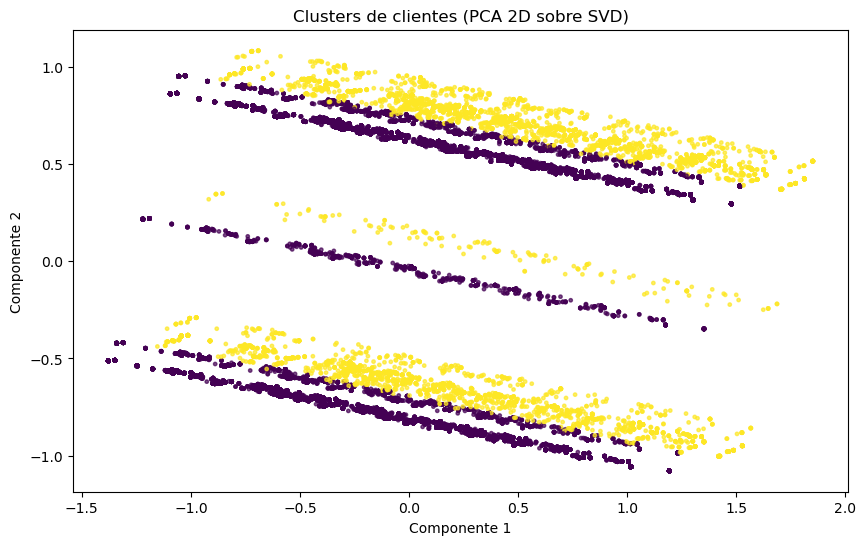

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reducir a 2 dimensiones para visualizar
pca_2d = PCA(n_components=2, random_state=42)
X_2d = pca_2d.fit_transform(X_red)

plt.figure(figsize=(10,6))
plt.scatter(X_2d[:,0], X_2d[:,1], c=dfc["cluster"], s=6, alpha=0.7)
plt.title("Clusters de clientes (PCA 2D sobre SVD)")
plt.xlabel("Componente 1")
plt.ylabel("Componente 2")
plt.show()


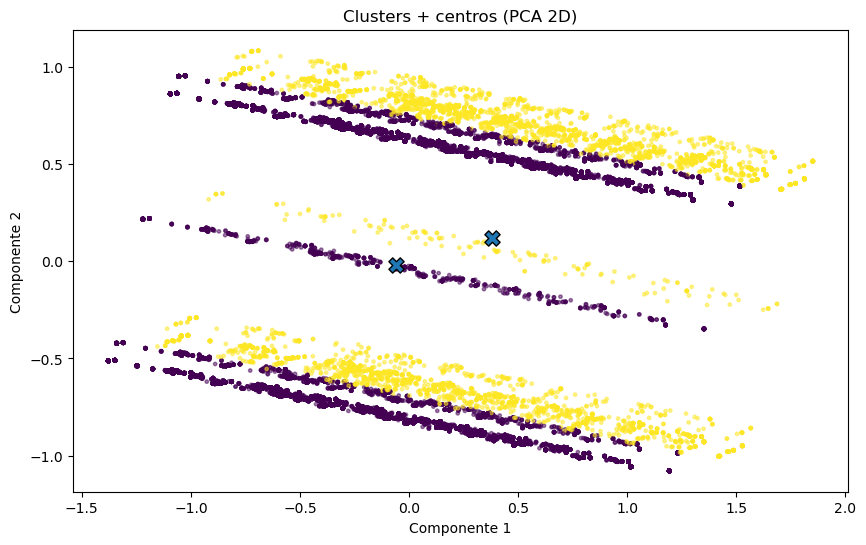

In [ ]:
import numpy as np

centros_2d = np.vstack([
    X_2d[dfc["cluster"].values == k].mean(axis=0)
    for k in sorted(dfc["cluster"].unique())
])

plt.figure(figsize=(10,6))
plt.scatter(X_2d[:,0], X_2d[:,1], c=dfc["cluster"], s=6, alpha=0.5)
plt.scatter(centros_2d[:,0], centros_2d[:,1], s=120, marker="X", edgecolors="black")
plt.title("Clusters + centros (PCA 2D)")
plt.xlabel("Componente 1")
plt.ylabel("Componente 2")
plt.show()


In [ ]:
# Distribución de categorías por cluster (ej: poutcome)
pd.crosstab(dfc["cluster"], dfc["poutcome"], normalize="index").round(3)


poutcome,failure,nonexistent,success
cluster,,,
0,0.000,1.0,0.000
1,0.756,0.0,0.244


In [ ]:
cols_cluster = ["housing","loan","age_group","previous_bin","education_grp","job","marital","poutcome"]

for col in cols_cluster:
    print("\n" + "="*70)
    print(col)
    display(pd.crosstab(dfc["cluster"], dfc[col], normalize="index").round(3))



housing


housing,no,unknown,yes
cluster,,,
0,0.457,0.024,0.519
1,0.421,0.025,0.555



loan


loan,no,unknown,yes
cluster,,,
0,0.824,0.024,0.152
1,0.824,0.025,0.151



age_group


age_group,18-25,26-35,36-45,46-55,56-65,66+
cluster,,,,,,
0,0.037,0.358,0.319,0.205,0.071,0.010
1,0.060,0.375,0.269,0.169,0.079,0.048



previous_bin


previous_bin,0,1,2,3+
cluster,,,,
0,1.0,0.000,0.000,0.000
1,0.0,0.811,0.134,0.055



education_grp


education_grp,basic,high_school,illiterate,university,unknown,vocational
cluster,,,,,,
0,0.310,0.228,0.0,0.292,0.041,0.128
1,0.263,0.251,0.0,0.316,0.048,0.122



job


job,"admin,",blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
cluster,,,,,,,,,,,,
0,0.25,0.232,0.036,0.027,0.070,0.037,0.035,0.097,0.017,0.166,0.024,0.008
1,0.27,0.179,0.032,0.020,0.076,0.069,0.031,0.092,0.050,0.147,0.028,0.007



marital


marital,divorced,married,single,unknown
cluster,,,,
0,0.112,0.614,0.273,0.002
1,0.112,0.552,0.332,0.003



poutcome


poutcome,failure,nonexistent,success
cluster,,,
0,0.000,1.0,0.000
1,0.756,0.0,0.244


In [ ]:
import pandas as pd
import plotly.express as px

def heatmap_cluster_categoria(dfc, col, cluster_col="cluster", top_n=None):
    """
    Heatmap: filas=cluster, columnas=categorías de `col`, valores=% dentro del cluster.
    - top_n: si lo indicas, agrupa el resto en "otros" para que sea legible.
    """
    tmp = dfc[[cluster_col, col]].copy()

    # MUY IMPORTANTE: si la columna es Categorical, pasamos a object para poder meter "missing"/"otros"
    tmp[col] = tmp[col].astype("object").fillna("missing").astype(str)

    # (opcional) quedarnos con las categorías más frecuentes
    if top_n is not None:
        top_cats = tmp[col].value_counts().head(top_n).index
        tmp[col] = tmp[col].where(tmp[col].isin(top_cats), other="otros")

    # matriz de porcentajes por cluster
    tab = pd.crosstab(tmp[cluster_col], tmp[col], normalize="index") * 100

    fig = px.imshow(
        tab.round(2),
        text_auto=".1f",
        aspect="auto",
        labels=dict(x=col, y="cluster", color="% dentro del cluster"),
        color_continuous_scale="Blues"  # suave
    )

    fig.update_layout(
        title=f"Matriz cluster × {col} (% dentro del cluster)",
        xaxis_title=col,
        yaxis_title="cluster"
    )

    fig.show()


In [ ]:
cols_cluster = ["housing","loan","age_group","previous_bin","education_grp","job","marital","poutcome"]

for col in cols_cluster:
    # para job suele haber muchas categorías: recorto a top 12 (ajusta si quieres)
    if col == "job":
        heatmap_cluster_categoria(dfc, col, top_n=12)
    else:
        heatmap_cluster_categoria(dfc, col)


In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA

X_2d = PCA(n_components=2, random_state=42).fit_transform(X_red)

df_plot = pd.DataFrame(X_2d, columns=["Dim1", "Dim2"])
df_plot["cluster"] = clusters.astype(int)

fig = px.scatter(
    df_plot, x="Dim1", y="Dim2",
    color=df_plot["cluster"].astype(str),
    opacity=0.7,
    title="Mapa 2D (PCA) coloreado por clúster"
)
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px
from sklearn.decomposition import TruncatedSVD

X_2d = TruncatedSVD(n_components=2, random_state=42).fit_transform(X_red)

df_plot = pd.DataFrame(X_2d, columns=["Dim1", "Dim2"])
df_plot["cluster"] = clusters.astype(int)

fig = px.scatter(
    df_plot, x="Dim1", y="Dim2",
    color=df_plot["cluster"].astype(str),
    opacity=0.7,
    title="Mapa 2D (SVD) coloreado por clúster"
)
fig.show()


In [ ]:
print(type(X_red), getattr(X_red, "shape", None))


<class 'numpy.ndarray'> (41184, 41)


In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px
from sklearn.decomposition import TruncatedSVD

# X_red: (n, 41)
svd2 = TruncatedSVD(n_components=2, random_state=42)
X_2d = svd2.fit_transform(X_red)   # (n, 2)

df_plot = pd.DataFrame(X_2d, columns=["Dim1", "Dim2"])
df_plot["cluster"] = clusters.astype(int)

# (opcional) si tienes y_true/proba en dfc:
# df_plot["y_true"] = dfc["y_true"].to_numpy()
# df_plot["proba"]  = dfc["proba"].to_numpy()

fig = px.scatter(
    df_plot, x="Dim1", y="Dim2",
    color=df_plot["cluster"].astype(str),
    opacity=0.65,
    title="Mapa 2D (SVD) coloreado por clúster"
)
fig.show()


In [ ]:
dfc["y_true"] = (dfc["y"].astype(str).str.lower() == "yes").astype(int)


In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px

def _safe_fill_str(s: pd.Series, fill="missing") -> pd.Series:
    if pd.api.types.is_categorical_dtype(s):
        s = s.cat.add_categories([fill])
    return s.fillna(fill).astype(str)

def _get_target_col(dfc, target_col=None):
    # si el usuario pasa target_col, úsalo
    if target_col is not None:
        if target_col not in dfc.columns:
            raise KeyError(f"target_col='{target_col}' no está en dfc.columns")
        return target_col

    # autodetección
    for c in ["y_true", "y", "target", "label"]:
        if c in dfc.columns:
            return c
    raise KeyError("No encuentro columna target. Usa target_col='...' o crea dfc['y_true'].")

def _to_binary_target(s: pd.Series) -> pd.Series:
    # convierte yes/no -> 1/0, o deja numérico
    if s.dtype == "O" or pd.api.types.is_string_dtype(s):
        ss = s.astype(str).str.lower()
        return (ss == "yes").astype(int)
    return s.astype(int)

def heatmap_cluster_categoria(
    dfc, col, cluster_col="cluster",
    metric="pct_in_cluster",  # "pct_in_cluster" | "conv_rate" | "lift_conv_vs_global" | "lift_conv_vs_cluster"
    top_n=12,
    target_col=None
):
    # base
    if cluster_col not in dfc.columns:
        raise KeyError(f"'{cluster_col}' no está en dfc.columns")
    if col not in dfc.columns:
        raise KeyError(f"'{col}' no está en dfc.columns")

    tmp = dfc[[cluster_col, col]].copy()
    tmp[col] = _safe_fill_str(tmp[col])

    # top categorías para no petar
    if top_n is not None:
        top = tmp[col].value_counts().head(top_n).index
        tmp[col] = np.where(tmp[col].isin(top), tmp[col], "OTHER")

    # 1) PRESENCIA (no necesita y_true)
    if metric == "pct_in_cluster":
        mat = pd.crosstab(tmp[cluster_col], tmp[col], normalize="index") * 100

    else:
        # métricas de conversión -> necesitamos target
        tcol = _get_target_col(dfc, target_col=target_col)
        tmp["y_bin"] = _to_binary_target(dfc.loc[tmp.index, tcol])

        global_conv = tmp["y_bin"].mean()
        conv_cluster = tmp.groupby(cluster_col)["y_bin"].mean()

        if metric == "conv_rate":
            mat = (tmp.groupby([cluster_col, col])["y_bin"].mean().unstack()) * 100

        elif metric == "lift_conv_vs_global":
            mat = (tmp.groupby([cluster_col, col])["y_bin"].mean() / global_conv).unstack()

        elif metric == "lift_conv_vs_cluster":
            mat = (tmp.groupby([cluster_col, col])["y_bin"].mean() / conv_cluster).unstack()

        else:
            raise ValueError("metric no reconocido")

    fig = px.imshow(
        mat,
        aspect="auto",
        text_auto=".2f",
        title=f"Heatmap {metric} — cluster × {col}"
    )
    fig.update_layout(xaxis_title=col, yaxis_title="cluster")
    fig.show()
    return mat


In [ ]:
heatmap_cluster_categoria(dfc, "job", metric="pct_in_cluster", top_n=12)


job,"admin,",blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
cluster,,,,,,,,,,,,
0,25.034450,23.192441,3.591215,2.665992,7.022132,3.745887,3.504036,9.704997,1.670463,16.631514,2.412891,0.823983
1,27.004444,17.866667,3.182222,1.991111,7.573333,6.897778,3.111111,9.208889,4.995556,14.737778,2.773333,0.657778


In [ ]:
heatmap_cluster_categoria(dfc, "job", metric="conv_rate", top_n=12, target_col="y")
heatmap_cluster_categoria(dfc, "job", metric="lift_conv_vs_cluster", top_n=12, target_col="y")


job,"admin,",blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
cluster,,,,,,,,,,,,
0,1.145826,0.698720,0.904255,0.800107,0.992904,2.158793,1.044868,0.784033,2.820700,0.920758,1.108342,0.850035
1,1.114140,0.481664,0.461201,1.306675,0.960147,1.740851,0.729057,0.608514,1.695971,1.127108,1.443270,1.521284


In [ ]:
client_cols = ["housing","loan","age_group","previous_bin","education_grp","job","marital","poutcome"]


In [ ]:
# Qué top_n usar por variable (ajústalo si quieres)
topn_map = {
    "job": 12,
    "education_grp": 12,
    "age_group": 12,
    "previous_bin": None,
    "housing": None,
    "loan": None,
    "marital": None,
    "poutcome": None,
}

mats = {}  # guardamos matrices por si quieres revisarlas después

for col in client_cols:
    top_n = topn_map.get(col, 12)

    # 1) Presencia (% dentro del cluster)
    mats[(col, "pct_in_cluster")] = heatmap_cluster_categoria(
        dfc, col, metric="pct_in_cluster", top_n=top_n
    )

    # 2) Conversión (% conversión dentro de cluster×categoría)
    mats[(col, "conv_rate")] = heatmap_cluster_categoria(
        dfc, col, metric="conv_rate", top_n=top_n, target_col="y_true"  # o "y" si no creaste y_true
    )

    # 3) Lift vs global (ratio vs conversión global)
    mats[(col, "lift_conv_vs_global")] = heatmap_cluster_categoria(
        dfc, col, metric="lift_conv_vs_global", top_n=top_n, target_col="y_true"
    )

    # 4) Lift vs cluster (ratio vs conversión media del cluster)
    mats[(col, "lift_conv_vs_cluster")] = heatmap_cluster_categoria(
        dfc, col, metric="lift_conv_vs_cluster", top_n=top_n, target_col="y_true"
    )


In [ ]:
dfc.groupby("cluster")["y_true"].agg(
    n="size",
    conv_rate="mean"
).sort_values("conv_rate", ascending=False)


,n,conv_rate
cluster,,
1,5625,0.266489
0,35559,0.088332


In [ ]:
rank = dfc.groupby("cluster")["y_true"].mean().sort_values().index  # de menor a mayor conv
cold, hot = rank[0], rank[-1]

dfc["cluster_label"] = dfc["cluster"].map({cold: "COLD", hot: "HOT"})
dfc.groupby("cluster_label")["y_true"].mean()


cluster_label
COLD    0.088332
HOT     0.266489
Name: y_true, dtype: float64

### Modelo operativa 

In [ ]:
features_op = features_pre + ["contact", "campaign", "duration"]
X_op = df_model[features_op]


In [ ]:
df_clientes

,job,marital,education,default,housing,loan,age,y,age_group,education_grp
0,housemaid,married,"basic,4y",no,no,no,56,no,56-65,basic
1,services,married,"high,school",unknown,no,no,57,no,56-65,high_school
2,services,married,"high,school",no,yes,no,37,no,36-45,high_school
3,"admin,",married,"basic,6y",no,no,no,40,no,36-45,basic
4,services,married,"high,school",no,no,yes,56,no,56-65,high_school
...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,"professional,course",no,yes,no,73,yes,66+,vocational
41184,blue-collar,married,"professional,course",no,no,no,46,no,46-55,vocational
41185,retired,married,"university,degree",no,yes,no,56,no,56-65,university
41186,technician,married,"professional,course",no,no,no,44,yes,36-45,vocational


Exception ignored in: <function ResourceTracker.__del__ at 0x106ed1bc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x104addbc0>
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/anaconda3/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x102879bc0>
Traceback (most recent call last

### Split para comparar modelos